In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D

import numpy as np
import scipy.stats as st
from sklearn import decomposition
from sklearn import preprocessing
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn import manifold
from sklearn import metrics
from datetime import datetime
import timeit
import matplotlib.cm as cm
from time import time
import statistics
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
from scipy.spatial.distance import cdist


pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 1000)

Fonction pour grapher un dendrogramme

In [2]:
from scipy.cluster.hierarchy import dendrogram


def plot_dendrogram(Z, title):
    plt.figure(figsize=(10, 25))
    plt.title('Hierarchical Clustering Dendrogram-Method '+title)
    plt.xlabel('distance')
    dendrogram(
        Z,
        orientation="left",
    )
    plt.show()

Fonction pour grapher les score de silhouette des clusters créés via Kmeans

In [50]:
def Kmeans_plot_silhouette_score(proj_name, n_clusters, X, clusterModel):

    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    cluster_labels = clusterModel.fit_predict(X)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = metrics.silhouette_samples(X, cluster_labels)

    # store the average value of each sample
    sample_silhouette_average = []

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        sample_silhouette_average.append(
            statistics.mean(ith_cluster_silhouette_values))

    silhouette_avg = metrics.silhouette_score(X, cluster_labels)
    silhouette_median = statistics.median(sample_silhouette_average)

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red",
                linestyle="--", label="silhouette_mean")
    ax1.axvline(x=silhouette_median, color="blue",
                linestyle=":", label="silhouette_median")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

    ax2.scatter(
        X[:, 0], X[:, 1], marker="o", s=30, lw=0, alpha=1, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterModel.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="red",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" %
                    i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        proj_name+"-Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

    ax1.legend(loc="upper right")

    plt.show()

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters

    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # davies_bouldin_score
    # The score is defined as the average similarity measure of each cluster with its most similar cluster,
    # where similarity is the ratio of within-cluster distances to between-cluster distances.
    davies_bouldin = metrics.davies_bouldin_score(X, cluster_labels)

    print(
        "For n_clusters =",
        n_clusters,
        "The Davies-Bouldin score is :",
        davies_bouldin,
    )

    print(
        "For n_clusters =",
        n_clusters,
        "The ratio mean/median silhouette is :",
        silhouette_avg/silhouette_median,
    )

    scores = []
    scores.append([proj_name, n_clusters, 'davies_bouldin', davies_bouldin])
    scores.append([proj_name, n_clusters, 'silhouette_mean', silhouette_avg])
    scores.append([proj_name, n_clusters, 'ratio mean/median silhouette',
                  silhouette_avg/silhouette_median])

    return scores, cluster_labels

Fonction pour grapher les score de silhouette des clusters créés via DBSCAN

In [53]:
def DBSCAN_plot_silhouette_score(param_grid, X, clusterModel, K_value=None, eps_value=None):

    # Initialize the clusterer with n_clusters value and a random generator
    cluster_labels = clusterModel.fit_predict(X)

    n_clusters_ = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

    # Compute the silhouette scores for each sample
    if cluster_labels.sum() != 0 and np.mean(cluster_labels) > -1:
        sample_silhouette_values = metrics.silhouette_samples(
            X, cluster_labels)
    else:
        return [], []

    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters_ + 1) * 10])

    # store the average value of each sample
    sample_silhouette_average = []

    y_lower = 10

    for i in range(n_clusters_):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i+2) / (n_clusters_+2))

        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
            cmap="viridis"
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        if len(ith_cluster_silhouette_values) != 0:
            sample_silhouette_average.append(
                statistics.mean(ith_cluster_silhouette_values))

    silhouette_avg = metrics.silhouette_score(X, cluster_labels)
    silhouette_median = statistics.median(sample_silhouette_average)

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red",
                linestyle="--", label="silhouette_mean")
    ax1.axvline(x=silhouette_median, color="blue", linestyle=":",
                label="ratio mean_median silhouette")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    #colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters_)

    colors = cm.nipy_spectral((cluster_labels.astype(float)+2)/(n_clusters_+2))

    ax2.scatter(
        # X[:, 0], X[:, 1], marker="o", s=30, lw=0, alpha=1, c=colors, edgecolor="k
        X[:, 0], X[:, 1], marker="o", s=30, lw=0, alpha=1, c=colors, edgecolor="k"
    )

    # Labeling the clusters

    clustering_df = pd.DataFrame(X)
    clustering_df['clustering'] = cluster_labels
    clustering_df = clustering_df[clustering_df['clustering'] != -1]
    clusters_centroids = clustering_df.groupby('clustering').mean()

    centers = clusters_centroids.to_numpy()

    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="red",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" %
                    i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "DBscan-neighbors:"+str(param_grid[1])+"-Epsilon:"+str(
            param_grid[2])+"-Silhouette analysis for "+str(param_grid[0])+" neighbors with n_clusters = %d"
        % n_clusters_,
        fontsize=14,
        fontweight="bold",
    )

    ax1.legend(loc="upper right")
    plt.show()

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters

    print(
        "For n_clusters =",
        n_clusters_,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # davies_bouldin_score
    # The score is defined as the average similarity measure of each cluster with its most similar cluster,
    # where similarity is the ratio of within-cluster distances to between-cluster distances.
    davies_bouldin = metrics.davies_bouldin_score(X, cluster_labels)

    print(
        "For n_clusters =",
        n_clusters_,
        "The Davies-Bouldin score is :",
        davies_bouldin,
    )

    print(
        "For n_clusters =",
        n_clusters_,
        "The ratio mean/median silhouette is :",
        silhouette_avg/silhouette_median,
    )

    scores = []
    value_detail = ''

    if K_value != None:
        value_detail = '-K:'+str(K_value)

    scores.append([str(param_grid[0])+value_detail, n_clusters_, 'davies_bouldin',
                  davies_bouldin, eps_value, param_grid[0]+"-min_sample:"+str(param_grid[1])])
    scores.append([str(param_grid[0])+value_detail, n_clusters_, 'silhouette_mean',
                  silhouette_avg, eps_value, param_grid[0]+"-min_sample:"+str(param_grid[1])])
    scores.append([str(param_grid[0])+value_detail, n_clusters_, 'ratio mean/median silhouette',
                  silhouette_avg/silhouette_median, eps_value, param_grid[0]+"-min_sample:"+str(param_grid[1])])

    return scores, cluster_labels

In [52]:
def Hierarchique_plot_silhouette_score(project_name, X, cluster_labels_):

    # Initialize the clusterer with n_clusters value and a random generator
    cluster_labels = cluster_labels_

    n_clusters_ = len(set(cluster_labels))

    # Compute the silhouette scores for each sample
    sample_silhouette_values = metrics.silhouette_samples(X, cluster_labels)

    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters_ + 1) * 10])

    # store the average value of each sample
    sample_silhouette_average = []

    y_lower = 10

    for i in range(1, n_clusters_+1):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i+2) / (n_clusters_+2))

        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
            cmap="viridis"
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        sample_silhouette_average.append(
            statistics.mean(ith_cluster_silhouette_values))

    silhouette_avg = metrics.silhouette_score(X, cluster_labels)
    silhouette_median = statistics.median(sample_silhouette_average)

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red",
                linestyle="--", label="silhouette_mean")
    ax1.axvline(x=silhouette_median, color="blue", linestyle=":",
                label="ratio mean_median silhouette")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral((cluster_labels.astype(float)+2)/(n_clusters_+2))

    ax2.scatter(
        X[:, 0], X[:, 1], marker="o", s=30, lw=0, alpha=1, c=colors, edgecolor="k"
    )

    # Labeling the clusters

    clustering_df = pd.DataFrame(X)
    clustering_df['clustering'] = cluster_labels
    clustering_df = clustering_df[clustering_df['clustering'] != -1]
    clusters_centroids = clustering_df.groupby('clustering').mean()

    centers = clusters_centroids.to_numpy()

    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="red",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" %
                    (i+1), alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Clustering hiéarchique-Silhouette analysis for " +
        str(project_name)+" with n_clusters = %d"
        % n_clusters_,
        fontsize=14,
        fontweight="bold",
    )

    ax1.legend(loc="upper right")
    plt.show()

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters

    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # davies_bouldin_score
    # The score is defined as the average similarity measure of each cluster with its most similar cluster,
    # where similarity is the ratio of within-cluster distances to between-cluster distances.
    davies_bouldin = metrics.davies_bouldin_score(X, cluster_labels)

    print(
        "For n_clusters =",
        n_clusters,
        "The Davies-Bouldin score is :",
        davies_bouldin,
    )

    print(
        "For n_clusters =",
        n_clusters,
        "The ratio mean/median silhouette is :",
        silhouette_avg/silhouette_median,
    )

    scores = []

    scores.append([project_name, n_clusters_,
                  'davies_bouldin', davies_bouldin])
    scores.append([project_name, n_clusters_,
                  'silhouette_mean', silhouette_avg])
    scores.append([project_name, n_clusters_,
                  'ratio mean/median silhouette', silhouette_avg/silhouette_median])

    return scores

Fonction pour grapher les clusters (centroïdes) et la heatmap.

In [6]:
def plot_custumer_cluster(X_scaled_reduced, labels, model_projection_name):
    clustering_df = pd.DataFrame(X_scaled_reduced, columns=[
                                 'price', 'frequence', 'order_purchase_timestamp'])
    clustering_df['clustering'] = labels[model_projection_name]
    clusters_centroids = clustering_df.groupby('clustering').mean()
    clusters_centroids['clustering'] = clusters_centroids.index
    clusters_centroids = clusters_centroids[clusters_centroids['clustering'] != -1]

    clusters_centroids = clusters_centroids.drop('clustering', axis=1)

    centroid_scale = preprocessing.MinMaxScaler().fit(clusters_centroids)
    clusters_centroids_scaled = centroid_scale.transform(clusters_centroids)
    centroid_scale_df = pd.DataFrame(clusters_centroids_scaled, columns=[
                                     'Montant', 'fréquence', 'Dernière commande'])

    sns.heatmap(centroid_scale_df, linewidths=.5,
                cmap='coolwarm', vmin=0, vmax=1)

Navigation vers le dossier source

In [7]:
cd Desktop/Formation_Ingenieur_Machine_Learning/P4_voelker_jean-florent

/Users/jfv/Desktop/Formation_Ingenieur_Machine_Learning/P4_voelker_jean-florent


Chargement du fichier issu du nettoyage des données

In [8]:
df_olist_customers_dataset = pd.read_csv('df_customer_ML.csv', delimiter=',')

In [9]:
data = df_olist_customers_dataset[[
    'price', 'frequence', 'order_purchase_timestamp']]

Je centre et réduis les données

In [10]:
X = data.values
std_scale = preprocessing.StandardScaler().fit(X)
X_scaled = std_scale.transform(X)

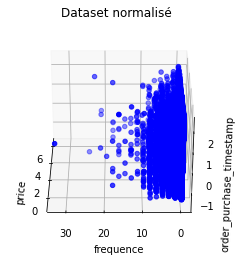

In [11]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.view_init(azim=180)
ax.scatter3D(X_scaled[:, 0], X_scaled[:, 1],
             X_scaled[:, 2], c='b', cmap='Greens')
ax.set_xlabel("price")
ax.set_ylabel("frequence")
ax.set_zlabel("order_purchase_timestamp")
plt.title("Dataset normalisé")

plt.show()

In [12]:
n_clusters_init = 5000

km_init = KMeans(n_clusters=n_clusters_init)
km_init.fit(X_scaled)

X_scaled_reduced = km_init.cluster_centers_
y_labels_ = km_init.labels_

Optimisation du modèle "Kernel-PCA"

Je crée une fonction de scoring qui calcule la transfomée inverse du modèle calculé pour les paramètres choisis et qui renvoie l'opposée de l'erreur quadratique moyenne entre l'image de départ et l'image reconstruite après tranformée inverse.

In [13]:
def KPCA_my_scorer(estimator, X, y=None):
    X_reduced = estimator.transform(X)
    X_preimage = estimator.inverse_transform(X_reduced)
    return -1 * metrics.mean_squared_error(X, X_preimage)

In [45]:
param_grid = [{
    "gamma": np.linspace(0.01, 0.1, 50),
    "kernel": ["rbf", "linear", "poly"]
}]

param_grid = [{
    "gamma": [0.09448979591836734],
    "kernel": ["linear"]
}]
kpca = decomposition.KernelPCA(
    n_components=2, n_jobs=-1, fit_inverse_transform=True)

grid_search = GridSearchCV(
    kpca,
    param_grid,
    cv=5,
    scoring=KPCA_my_scorer
)

grid_search.fit(X_scaled_reduced)

kernel = grid_search.best_params_['kernel']
gamma = grid_search.best_params_['gamma']

In [15]:
grid_search.best_params_

{'gamma': 0.09448979591836734, 'kernel': 'linear'}

Optimisation du modèle "Isomap"

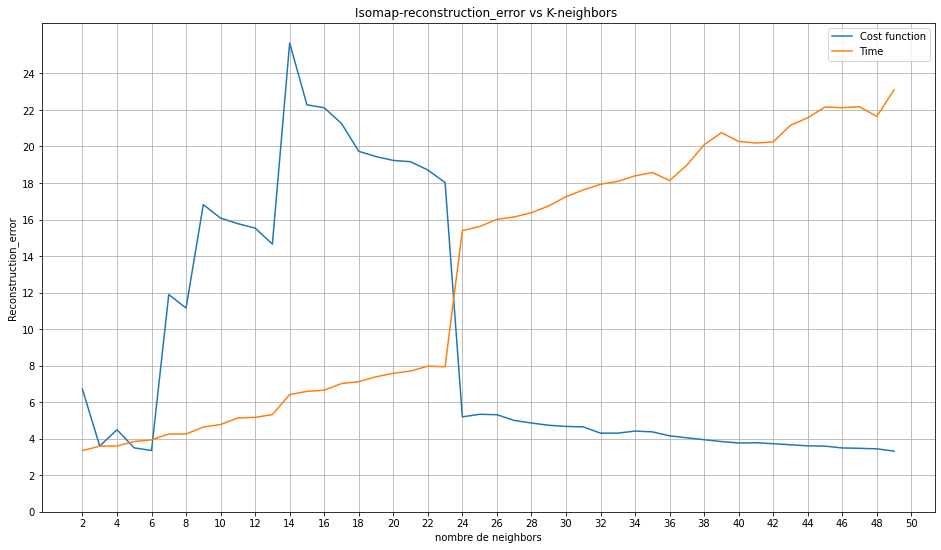

In [16]:
K_intervalle = range(2, 50)
isomap_cost_list = []
isomap_time_list = []

for k in K_intervalle:
    #
    start_time = time()
    ISOmap = manifold.Isomap(n_neighbors=k, n_components=2, n_jobs=-1)
    ISOmap.fit_transform(X_scaled_reduced)
    #
    isomap_cost_list.append(ISOmap.reconstruction_error())
    isomap_time_list.append(time() - start_time)

ax = plt.figure(figsize=(16, 9)).add_subplot()
plt.plot(K_intervalle, isomap_cost_list, label="Cost function")
plt.plot(K_intervalle, isomap_time_list, label="Time")
plt.xlabel("nombre de neighbors")
plt.ylabel("Reconstruction_error")
plt.title("Isomap-reconstruction_error vs K-neighbors ")
plt.legend(loc="upper right")
ax.set_xticks(np.arange(2, 51, 2))
ax.set_yticks(np.arange(0, 25, 2))
plt.grid(True)
plt.show()

Le graphique montre une bonne réduction de l'erreur de reconstruction pour K = 24

In [18]:
Isomap_n_neighbors = 24

Optimisation du modèle "LLE" (Locally Linear Embedding) 

L'optimisation est réalisée en utilisant l'opposée de l'ereur de construction comme score

In [19]:
def my_scorer_LLE(estimator, X, y=None):
    return -1 * estimator.reconstruction_error_

In [20]:
param_grid = [{
    "n_neighbors": [6, 10, 15, 20, 30, 40],
    "method": ["standard", "hessian", "modified", "ltsa"]
}]


LLE_scorer = metrics.make_scorer(my_scorer_LLE)

LLE = manifold.LocallyLinearEmbedding(
    n_jobs=-1,
    eigen_solver='dense'
)

grid_search = GridSearchCV(
    LLE,
    param_grid,
    cv=5,
    scoring=my_scorer_LLE
)

grid_search.fit(X_scaled_reduced)

method = grid_search.best_params_['method']
lle_n_neighbors = grid_search.best_params_['n_neighbors']

In [21]:
grid_search.best_params_

{'method': 'ltsa', 'n_neighbors': 6}

Optimisation du modèle "t-SNE"

Utilisation de la divergence de Kullback-Leibler égale à l'entropie croisée (p,q) moins l'entropie(p). Cette dernière est l'entropie théorique.
La divergence de Kullback-Leibler mesure la similitude (ou la dissemblance) entre deux distributions de probabilité. Plus les 2 distributions sont similaires plus la divergence tend vers 0.
Je prends donc l'opposée de la divergence de Kullback-Leibler pour optimiser ma recherche


In [22]:
def my_scorer_TSNE(estimator, X, y=None):
    print(estimator)
    return -1 * estimator.kl_divergence_

In [23]:
perplexity = np.arange(41, 51, 2)
n_iter = [1000, 2000, 3000]
learning_rate = np.arange(10, 1010, 100)

nb_case = len(learning_rate)*len(perplexity)*len(n_iter)
nb_itération = 0

perplexity = [49]
n_iter = [3000]
learning_rate = [970]
#{'learning_rate': 970, 'n_iter': 3000, 'perplexity': 49}

param_grid = [{
    "perplexity": perplexity,
    "n_iter": n_iter,
    "learning_rate": learning_rate
}]

TSNE = manifold.TSNE(n_components=2, init='pca', random_state=0, n_jobs=-1)

grid_search = GridSearchCV(
    TSNE,
    param_grid,
    cv=5,
    scoring=my_scorer_TSNE
)

grid_search.fit(X_scaled_reduced)

perplexity = grid_search.best_params_['perplexity']
max_iter = grid_search.best_params_['n_iter']
learning_rate = grid_search.best_params_['learning_rate']

TSNE(init='pca', learning_rate=970, n_iter=3000, n_jobs=-1, perplexity=49,
     random_state=0)
TSNE(init='pca', learning_rate=970, n_iter=3000, n_jobs=-1, perplexity=49,
     random_state=0)
TSNE(init='pca', learning_rate=970, n_iter=3000, n_jobs=-1, perplexity=49,
     random_state=0)
TSNE(init='pca', learning_rate=970, n_iter=3000, n_jobs=-1, perplexity=49,
     random_state=0)
TSNE(init='pca', learning_rate=970, n_iter=3000, n_jobs=-1, perplexity=49,
     random_state=0)


In [24]:
grid_search.best_params_

{'learning_rate': 970, 'n_iter': 3000, 'perplexity': 49}

In [25]:
n_components = 2

Kernel_PCA = "Kernel-PCA-"+kernel
Isomap = "Isomap"
LLE = "LLE-"+method+"-K="+str(lle_n_neighbors)
tSNE = "tSNE"

embeddings = {
    "baseline": X_scaled_reduced,
    Kernel_PCA: decomposition.KernelPCA(
        n_components=n_components, kernel=kernel, n_jobs=-1, gamma=gamma
    ),
    Isomap: manifold.Isomap(
        n_neighbors=Isomap_n_neighbors, n_components=n_components, n_jobs=-1
    ),
    LLE: manifold.LocallyLinearEmbedding(
        n_neighbors=lle_n_neighbors, n_components=n_components, method=method, n_jobs=-1, eigen_solver='dense'
    ),
    tSNE: manifold.TSNE(
        n_components=n_components, init="pca", random_state=0, n_jobs=-1
    )
}

Clustering initial par K-means pour créer un dataset avec un nombre d'individus réduits pour les méthodes ayant une complexité algorithmique qui croît avec le nombre d'individus.

In [26]:
projections, timing = {}, {}
methode_list = []

# Sélection du dataset en fonction de l'algorithme
for name, transformer in embeddings.items():
    if "baseline" in name:
        print(f"Computing {name}...")
        data = X_scaled_reduced
        projections[name] = data
        methode_list.append(name)
    else:
        #data = X_scaled
        data = X_scaled_reduced
        print(f"Computing {name}...")
        start_time = time()
        projections[name] = transformer.fit_transform(data)
        timing[name] = time() - start_time
        methode_list.append(name)

Computing baseline...
Computing Kernel-PCA-linear...
Computing Isomap...
Computing LLE-ltsa-K=6...
Computing tSNE...


Clustering avec K-means

Clustering Kmeans de la baseline


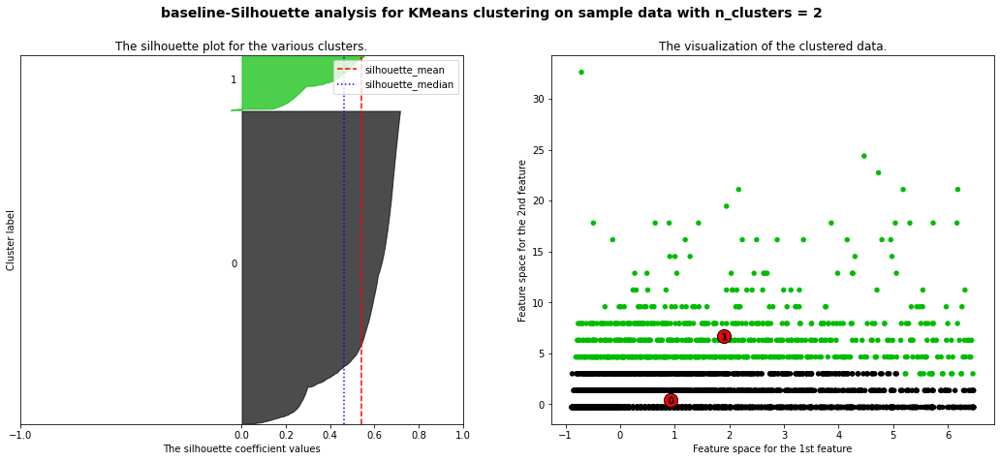

For n_clusters = 2 The average silhouette_score is : 0.5405345875249304
For n_clusters = 2 The Davies-Bouldin score is : 0.8269255352771542
For n_clusters = 2 The ratio mean/median silhouette is : 1.1683482187079592


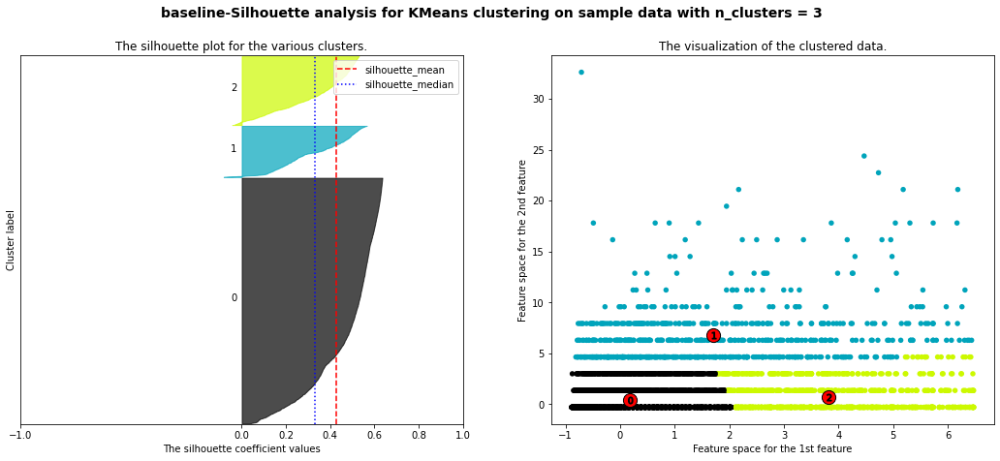

For n_clusters = 3 The average silhouette_score is : 0.4293755823017856
For n_clusters = 3 The Davies-Bouldin score is : 0.9213356908862496
For n_clusters = 3 The ratio mean/median silhouette is : 1.2980091846922728


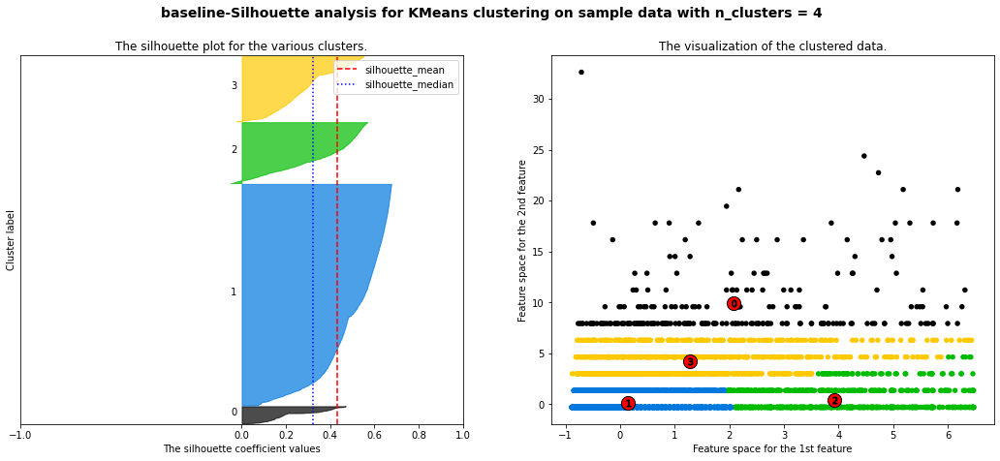

For n_clusters = 4 The average silhouette_score is : 0.4336567795646808
For n_clusters = 4 The Davies-Bouldin score is : 0.9067172050622698
For n_clusters = 4 The ratio mean/median silhouette is : 1.339579837848983


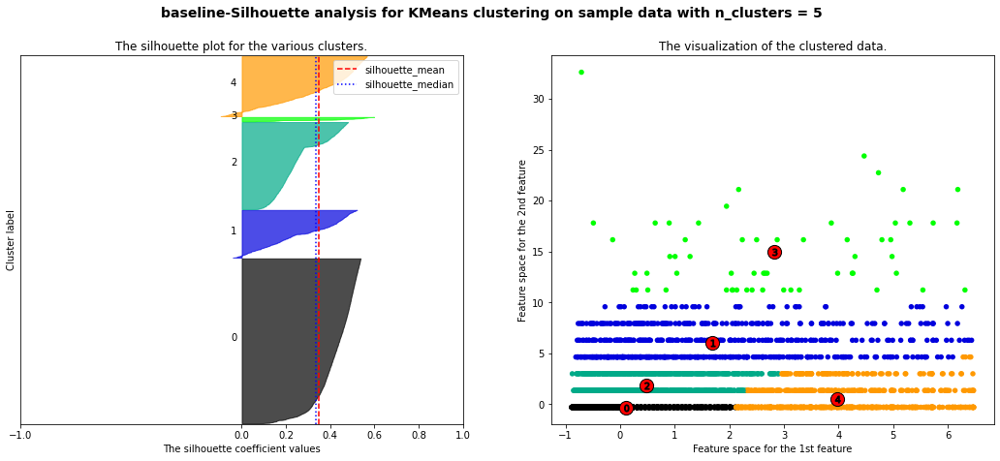

For n_clusters = 5 The average silhouette_score is : 0.3499791084353924
For n_clusters = 5 The Davies-Bouldin score is : 0.9940271670605341
For n_clusters = 5 The ratio mean/median silhouette is : 1.0426338254904801


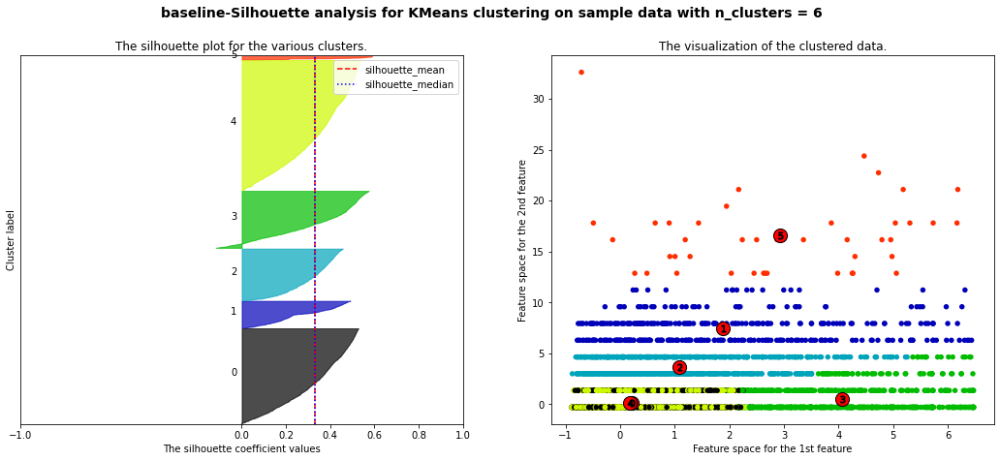

For n_clusters = 6 The average silhouette_score is : 0.33011757534484315
For n_clusters = 6 The Davies-Bouldin score is : 1.0069426050560193
For n_clusters = 6 The ratio mean/median silhouette is : 0.9944817119498784


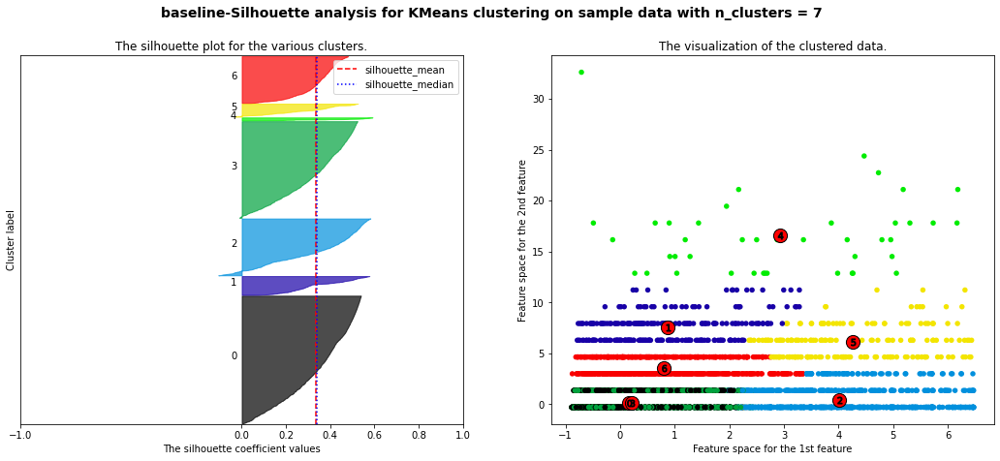

For n_clusters = 7 The average silhouette_score is : 0.3366477676658945
For n_clusters = 7 The Davies-Bouldin score is : 0.9690984366880572
For n_clusters = 7 The ratio mean/median silhouette is : 0.9928475618303015


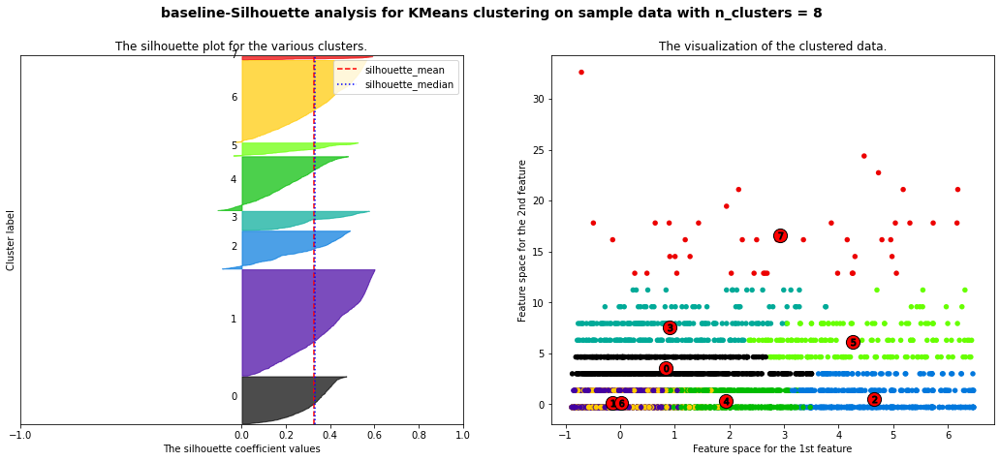

For n_clusters = 8 The average silhouette_score is : 0.3275104363283006
For n_clusters = 8 The Davies-Bouldin score is : 0.9868166427267724
For n_clusters = 8 The ratio mean/median silhouette is : 0.9932247352950516


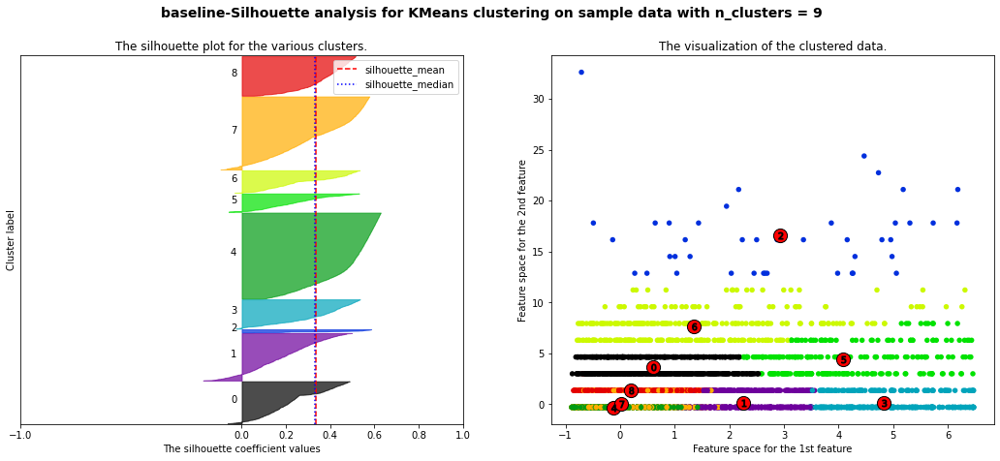

For n_clusters = 9 The average silhouette_score is : 0.3337399152528284
For n_clusters = 9 The Davies-Bouldin score is : 0.9618213000301821
For n_clusters = 9 The ratio mean/median silhouette is : 1.0083803600008667


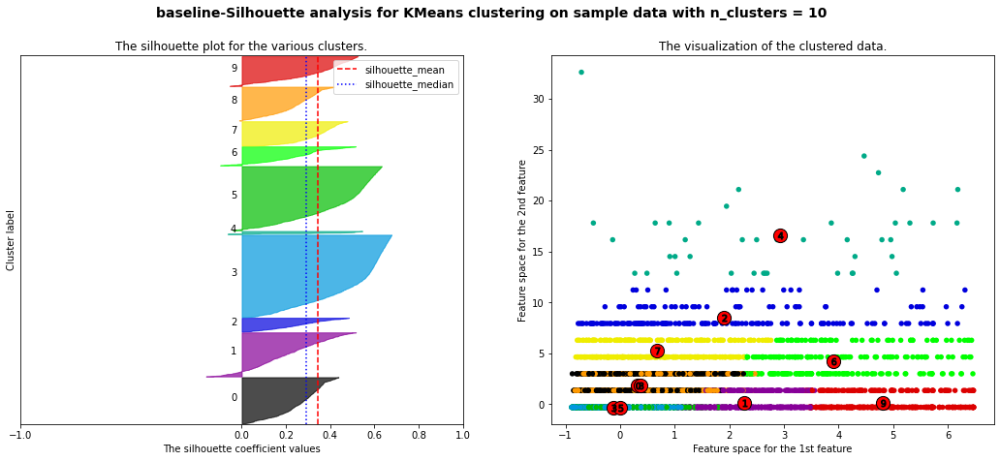

For n_clusters = 10 The average silhouette_score is : 0.3439621833342904
For n_clusters = 10 The Davies-Bouldin score is : 1.0243250205946859
For n_clusters = 10 The ratio mean/median silhouette is : 1.1855763817225462
Clustering Kmeans selon la projection Kernel-PCA-linear


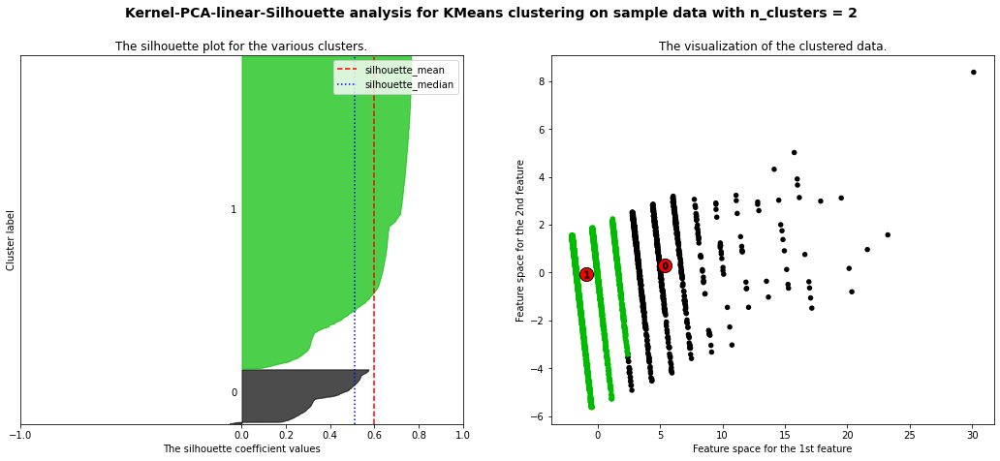

For n_clusters = 2 The average silhouette_score is : 0.5975517135600148
For n_clusters = 2 The Davies-Bouldin score is : 0.7420454770139466
For n_clusters = 2 The ratio mean/median silhouette is : 1.168944997910487


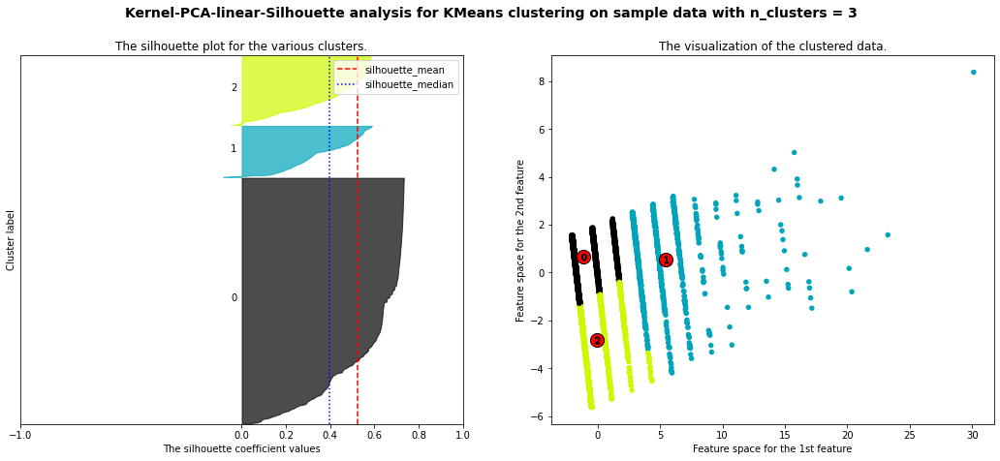

For n_clusters = 3 The average silhouette_score is : 0.5236408603519773
For n_clusters = 3 The Davies-Bouldin score is : 0.7631377891221641
For n_clusters = 3 The ratio mean/median silhouette is : 1.3184761857854488


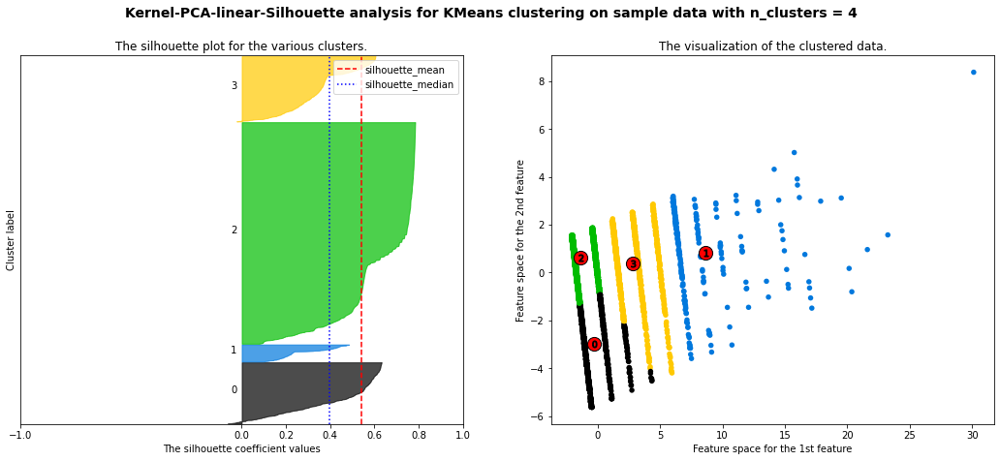

For n_clusters = 4 The average silhouette_score is : 0.540479900968025
For n_clusters = 4 The Davies-Bouldin score is : 0.7770085320815754
For n_clusters = 4 The ratio mean/median silhouette is : 1.361990236108024


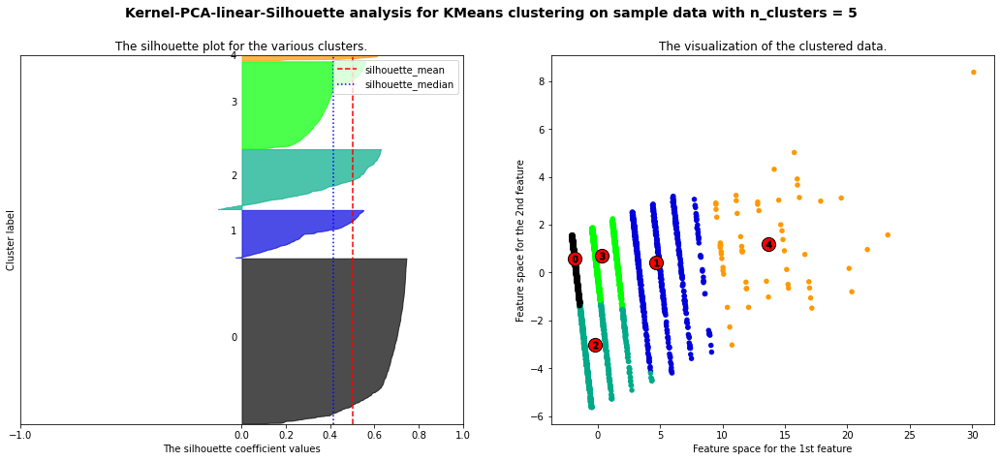

For n_clusters = 5 The average silhouette_score is : 0.5036727451997925
For n_clusters = 5 The Davies-Bouldin score is : 0.7347288274045838
For n_clusters = 5 The ratio mean/median silhouette is : 1.2226366423593313


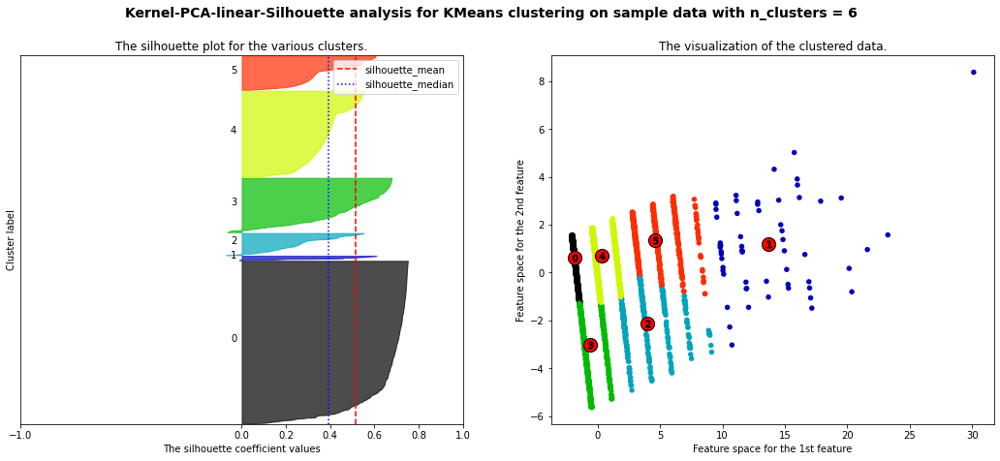

For n_clusters = 6 The average silhouette_score is : 0.5134178618220334
For n_clusters = 6 The Davies-Bouldin score is : 0.8102150249013551
For n_clusters = 6 The ratio mean/median silhouette is : 1.3032398931432705


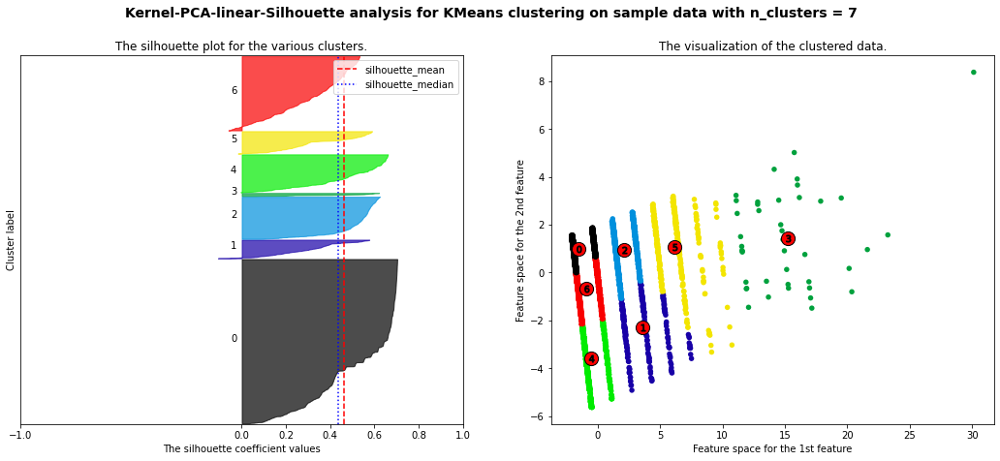

For n_clusters = 7 The average silhouette_score is : 0.4613257959461384
For n_clusters = 7 The Davies-Bouldin score is : 0.8062869074344924
For n_clusters = 7 The ratio mean/median silhouette is : 1.0627672934127612


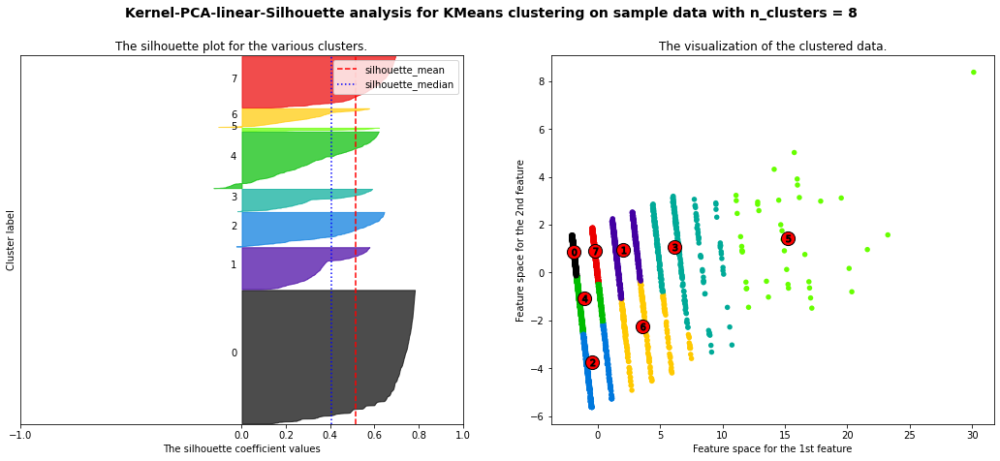

For n_clusters = 8 The average silhouette_score is : 0.5160692460675093
For n_clusters = 8 The Davies-Bouldin score is : 0.7234042919316782
For n_clusters = 8 The ratio mean/median silhouette is : 1.2795896171881043


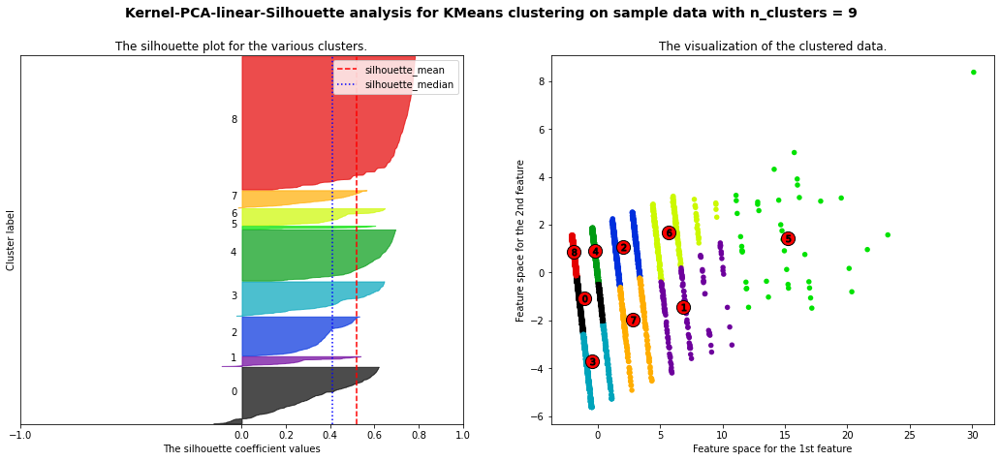

For n_clusters = 9 The average silhouette_score is : 0.5209381986113472
For n_clusters = 9 The Davies-Bouldin score is : 0.7505381963382765
For n_clusters = 9 The ratio mean/median silhouette is : 1.2648262445837322


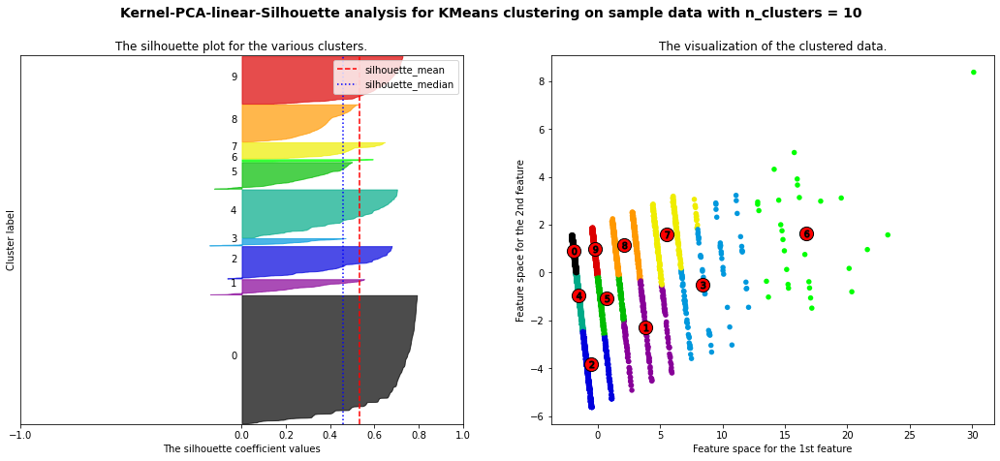

For n_clusters = 10 The average silhouette_score is : 0.5340134498435722
For n_clusters = 10 The Davies-Bouldin score is : 0.737434872318768
For n_clusters = 10 The ratio mean/median silhouette is : 1.165069523024362
Clustering Kmeans selon la projection Isomap


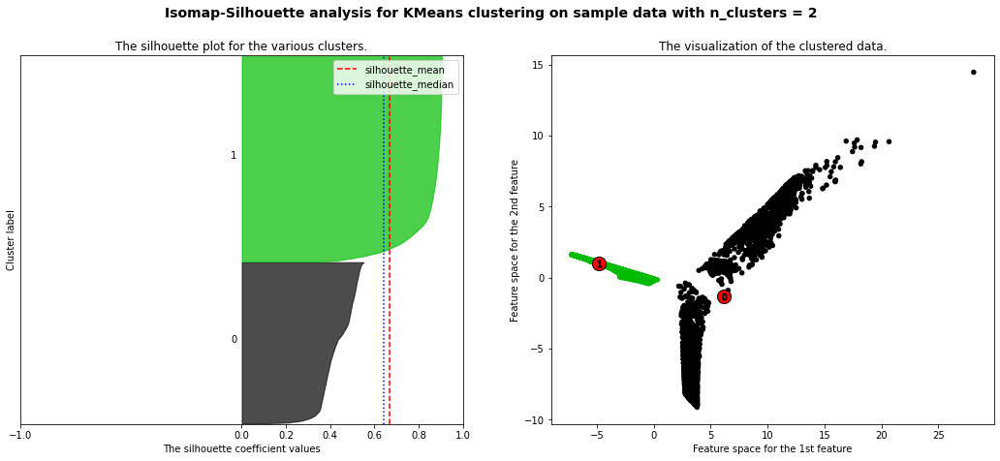

For n_clusters = 2 The average silhouette_score is : 0.6677210639104278
For n_clusters = 2 The Davies-Bouldin score is : 0.6054421887699001
For n_clusters = 2 The ratio mean/median silhouette is : 1.0387135164991208


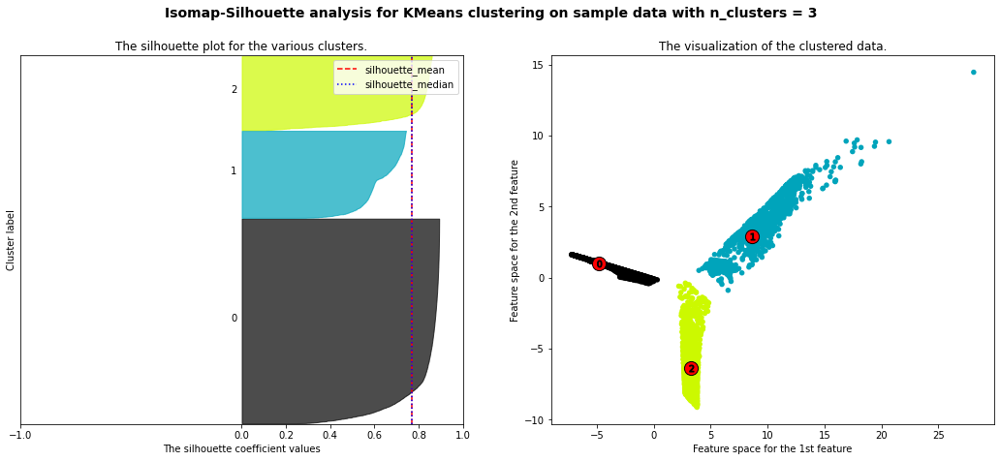

For n_clusters = 3 The average silhouette_score is : 0.77104926176549
For n_clusters = 3 The Davies-Bouldin score is : 0.38566987649921586
For n_clusters = 3 The ratio mean/median silhouette is : 1.0033902774804457


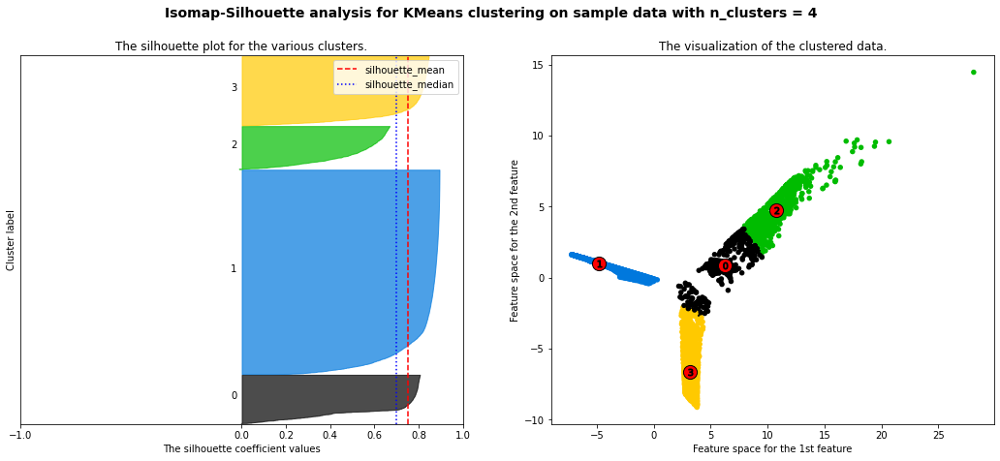

For n_clusters = 4 The average silhouette_score is : 0.751378625134224
For n_clusters = 4 The Davies-Bouldin score is : 0.40685615938611047
For n_clusters = 4 The ratio mean/median silhouette is : 1.0762590411279147


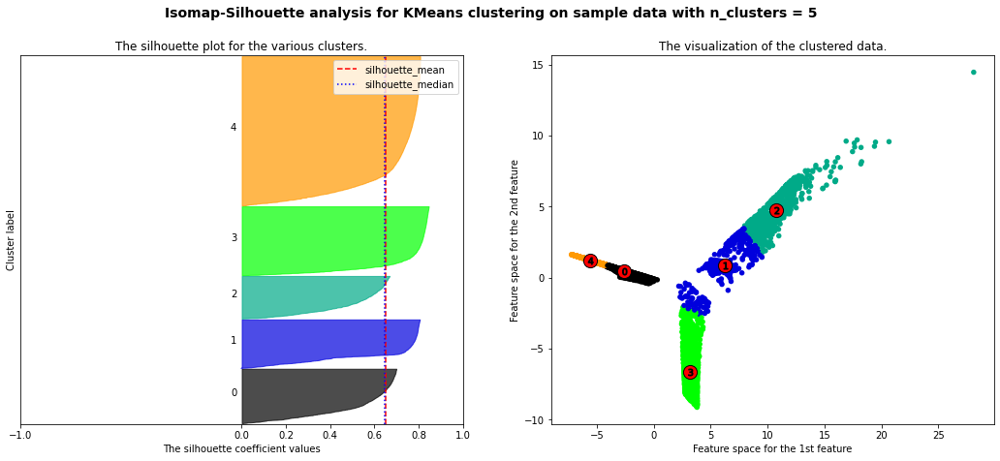

For n_clusters = 5 The average silhouette_score is : 0.6519411164067327
For n_clusters = 5 The Davies-Bouldin score is : 0.4821521831919302
For n_clusters = 5 The ratio mean/median silhouette is : 1.0099626429659312


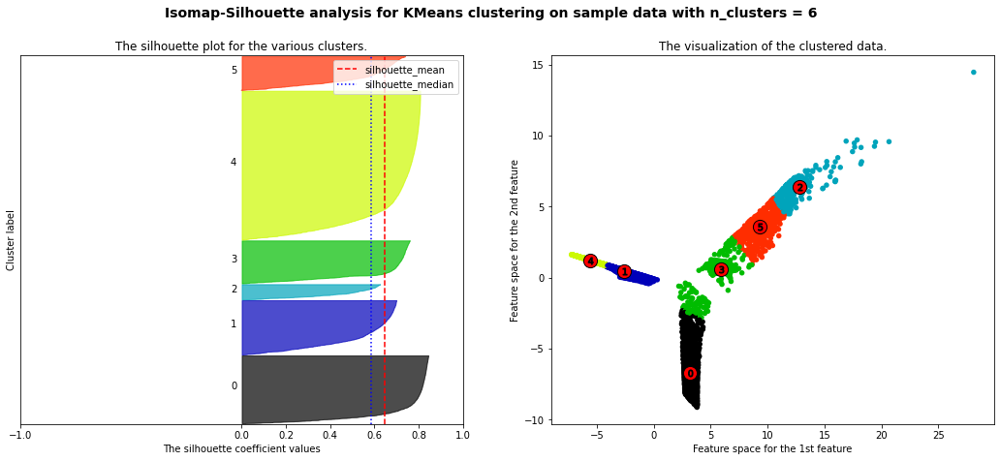

For n_clusters = 6 The average silhouette_score is : 0.646764616292551
For n_clusters = 6 The Davies-Bouldin score is : 0.5234499860660478
For n_clusters = 6 The ratio mean/median silhouette is : 1.1023625412692317


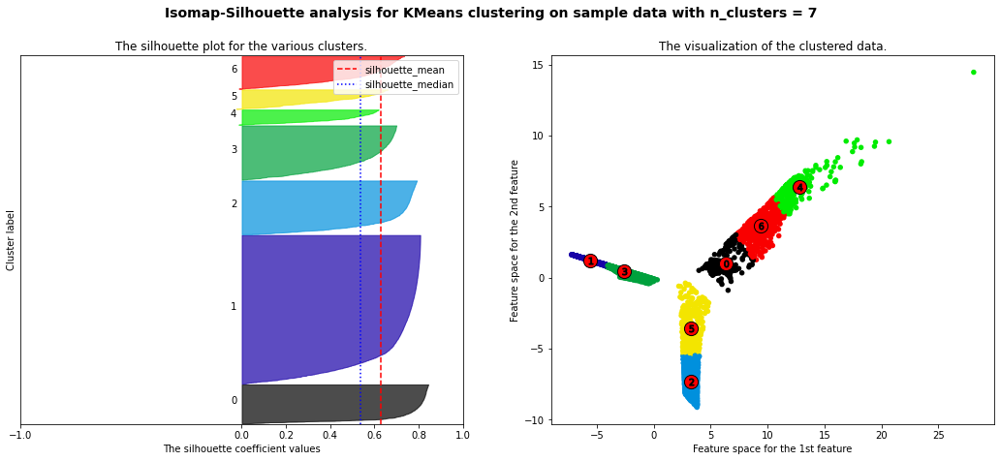

For n_clusters = 7 The average silhouette_score is : 0.6299729923645143
For n_clusters = 7 The Davies-Bouldin score is : 0.5612327125860168
For n_clusters = 7 The ratio mean/median silhouette is : 1.1716719687515278


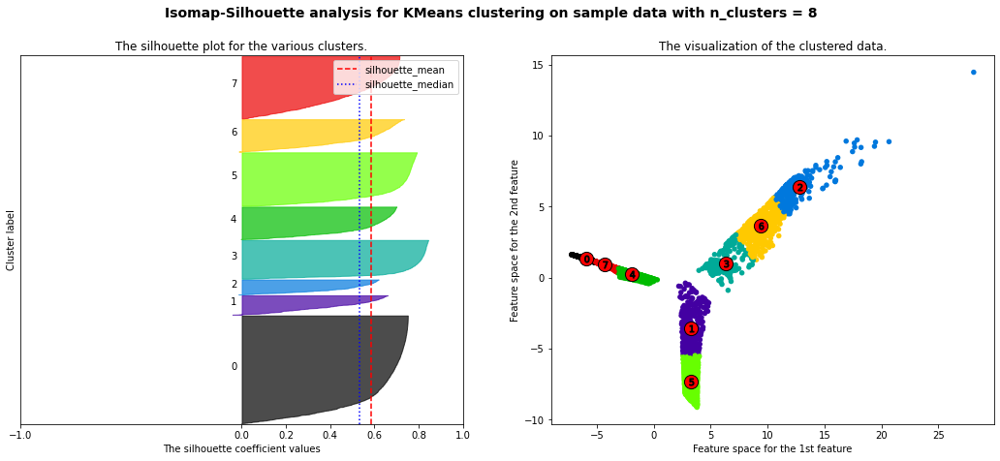

For n_clusters = 8 The average silhouette_score is : 0.5855865116960979
For n_clusters = 8 The Davies-Bouldin score is : 0.5659669184277485
For n_clusters = 8 The ratio mean/median silhouette is : 1.103908402189662


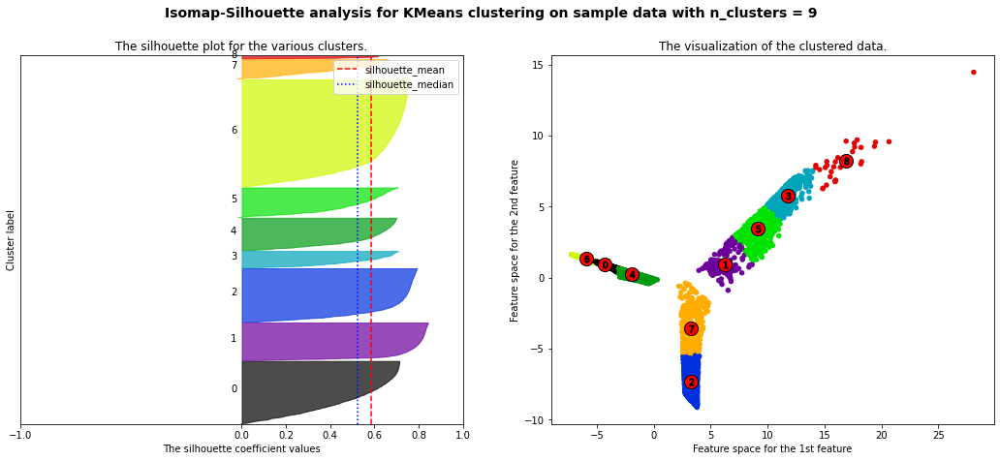

For n_clusters = 9 The average silhouette_score is : 0.5866900933916515
For n_clusters = 9 The Davies-Bouldin score is : 0.5609204726954662
For n_clusters = 9 The ratio mean/median silhouette is : 1.1228420340628351


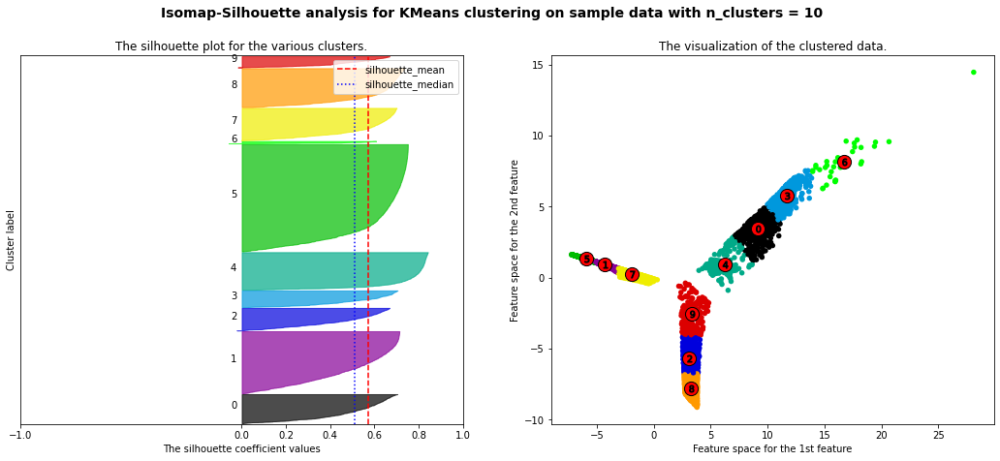

For n_clusters = 10 The average silhouette_score is : 0.5704763607098459
For n_clusters = 10 The Davies-Bouldin score is : 0.5773944043220969
For n_clusters = 10 The ratio mean/median silhouette is : 1.1145521226146107
Clustering Kmeans selon la projection LLE-ltsa-K=6


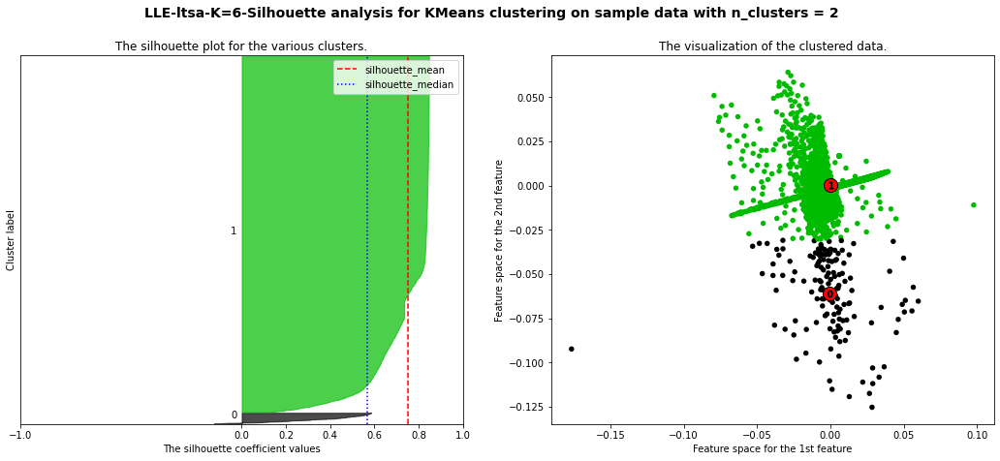

For n_clusters = 2 The average silhouette_score is : 0.7511537017414982
For n_clusters = 2 The Davies-Bouldin score is : 0.6194795469260246
For n_clusters = 2 The ratio mean/median silhouette is : 1.325843015484666


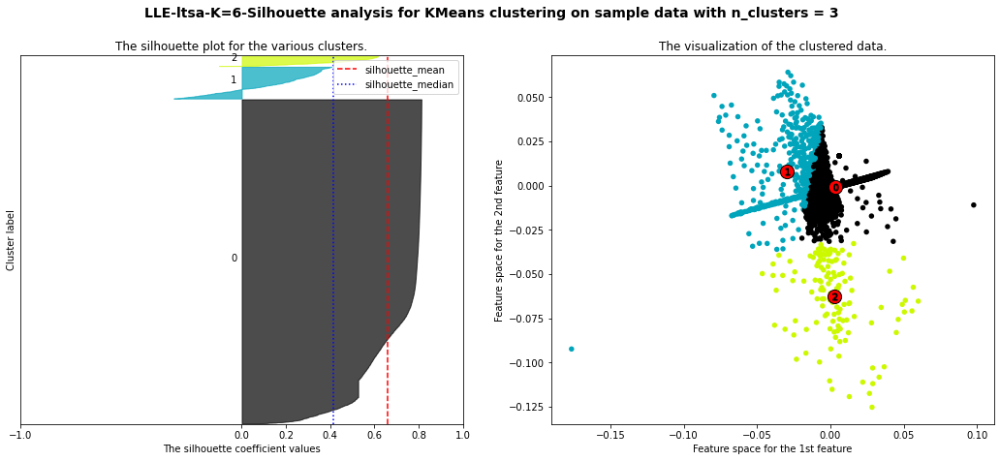

For n_clusters = 3 The average silhouette_score is : 0.6588704948089679
For n_clusters = 3 The Davies-Bouldin score is : 0.8462604859661228
For n_clusters = 3 The ratio mean/median silhouette is : 1.5876910365026269


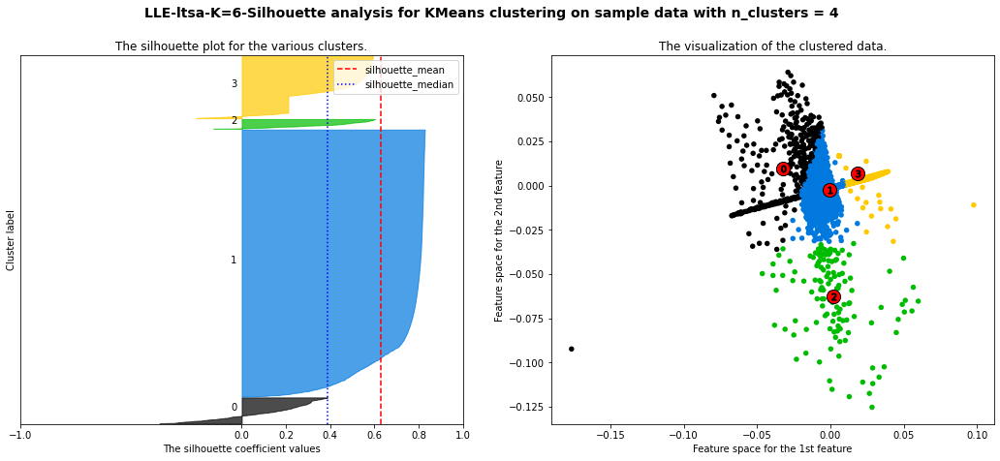

For n_clusters = 4 The average silhouette_score is : 0.6303713412479935
For n_clusters = 4 The Davies-Bouldin score is : 0.7726480689992987
For n_clusters = 4 The ratio mean/median silhouette is : 1.6288297596995926


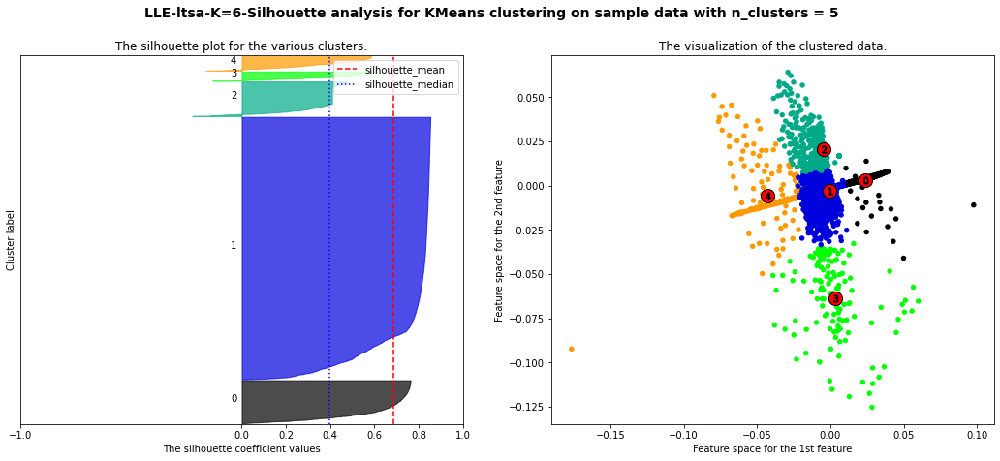

For n_clusters = 5 The average silhouette_score is : 0.6836631168454569
For n_clusters = 5 The Davies-Bouldin score is : 0.6700477852547476
For n_clusters = 5 The ratio mean/median silhouette is : 1.7265789701791383


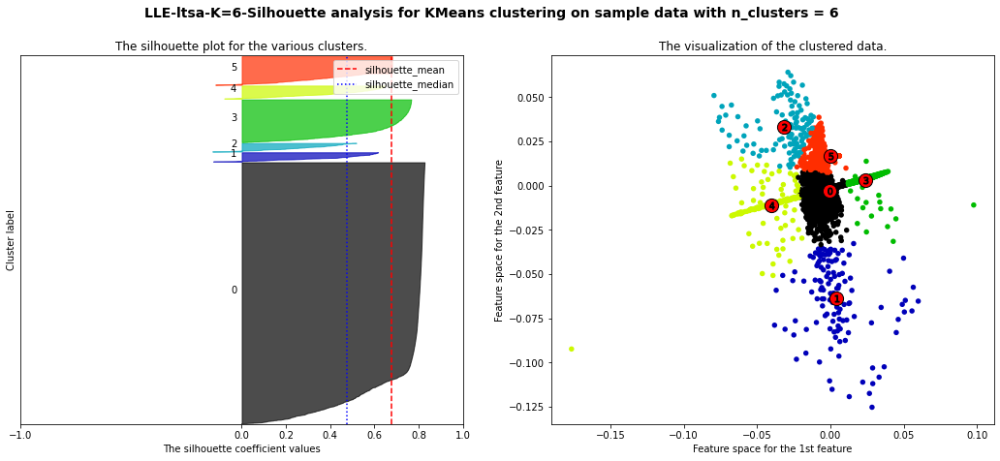

For n_clusters = 6 The average silhouette_score is : 0.6782007529660378
For n_clusters = 6 The Davies-Bouldin score is : 0.6561012749173206
For n_clusters = 6 The ratio mean/median silhouette is : 1.4259328041915318


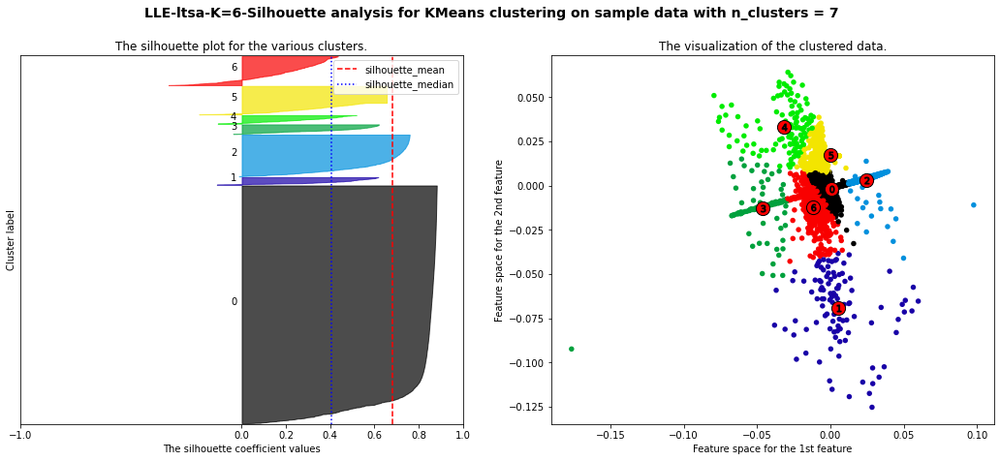

For n_clusters = 7 The average silhouette_score is : 0.6807878315353095
For n_clusters = 7 The Davies-Bouldin score is : 0.703850913984215
For n_clusters = 7 The ratio mean/median silhouette is : 1.6729901287284819


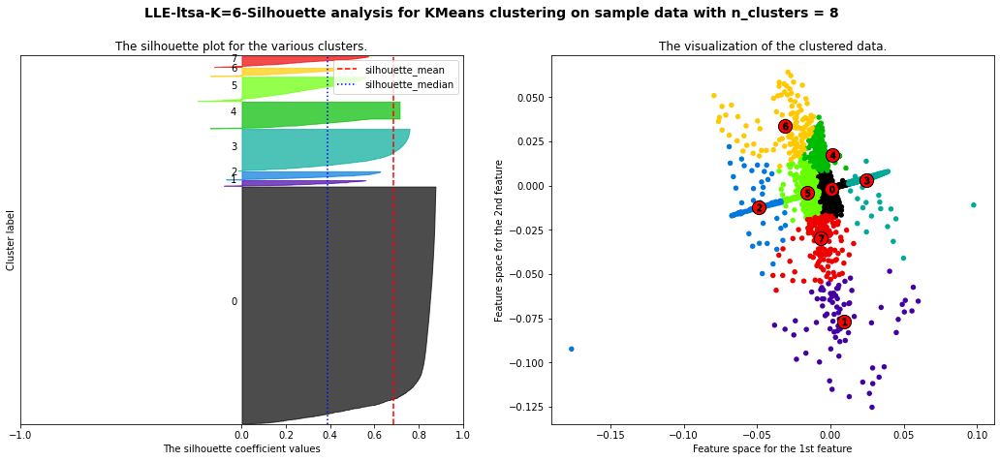

For n_clusters = 8 The average silhouette_score is : 0.6860232486328568
For n_clusters = 8 The Davies-Bouldin score is : 0.6763181394825892
For n_clusters = 8 The ratio mean/median silhouette is : 1.7748808792282467


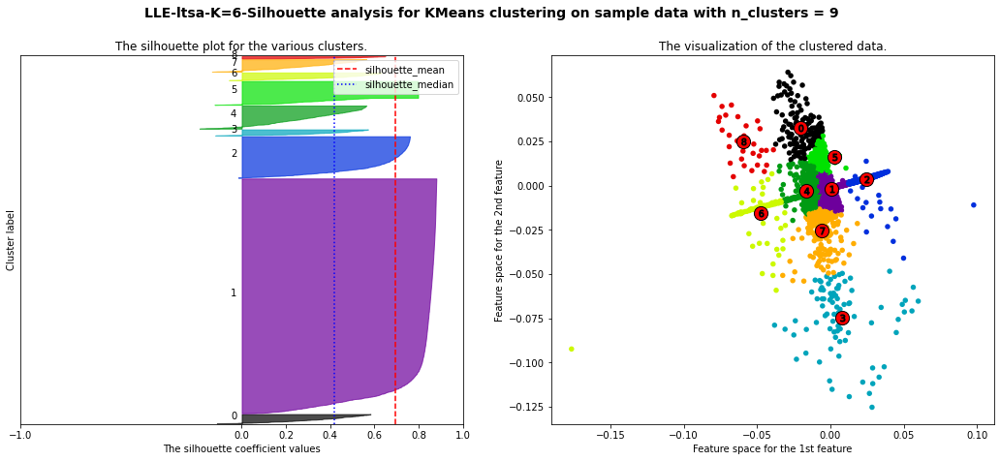

For n_clusters = 9 The average silhouette_score is : 0.6939151442866683
For n_clusters = 9 The Davies-Bouldin score is : 0.668992923846595
For n_clusters = 9 The ratio mean/median silhouette is : 1.6591968063930251


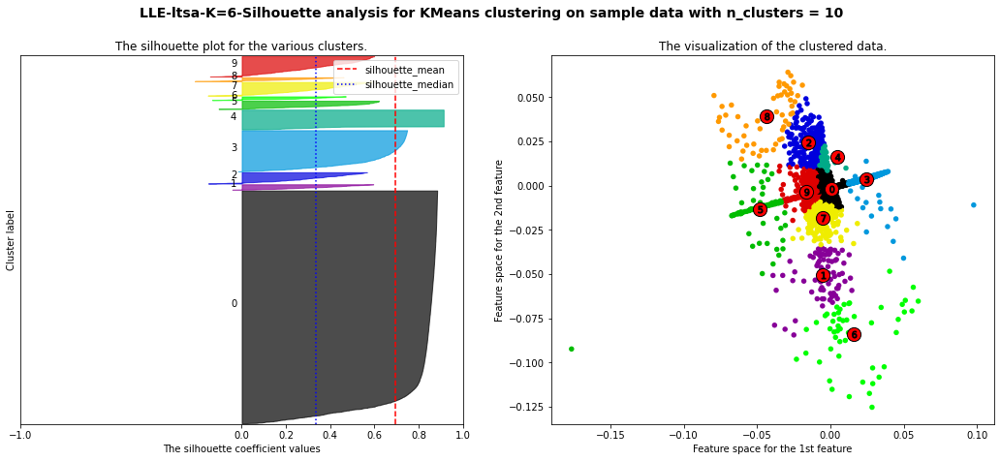

For n_clusters = 10 The average silhouette_score is : 0.6950532834048194
For n_clusters = 10 The Davies-Bouldin score is : 0.7737942070537943
For n_clusters = 10 The ratio mean/median silhouette is : 2.0633460705416975
Clustering Kmeans selon la projection tSNE


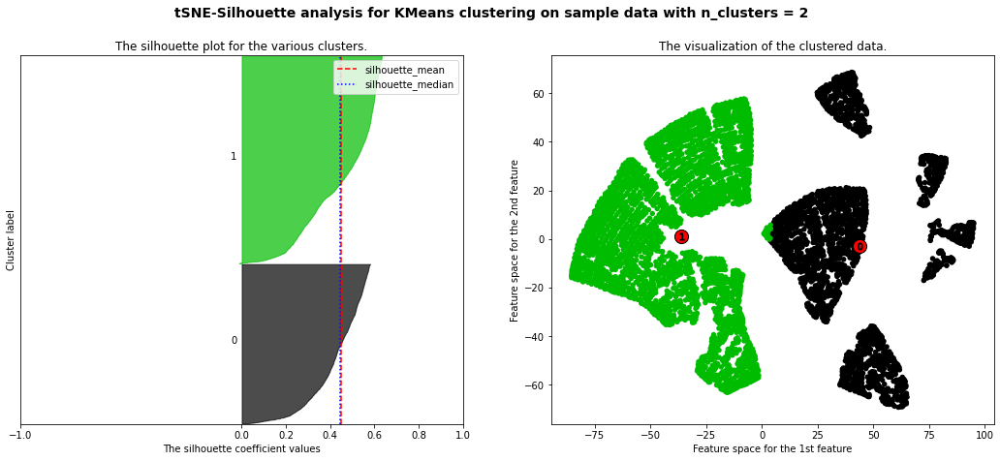

For n_clusters = 2 The average silhouette_score is : 0.4470702
For n_clusters = 2 The Davies-Bouldin score is : 0.9203395944589755
For n_clusters = 2 The ratio mean/median silhouette is : 1.004342365807714


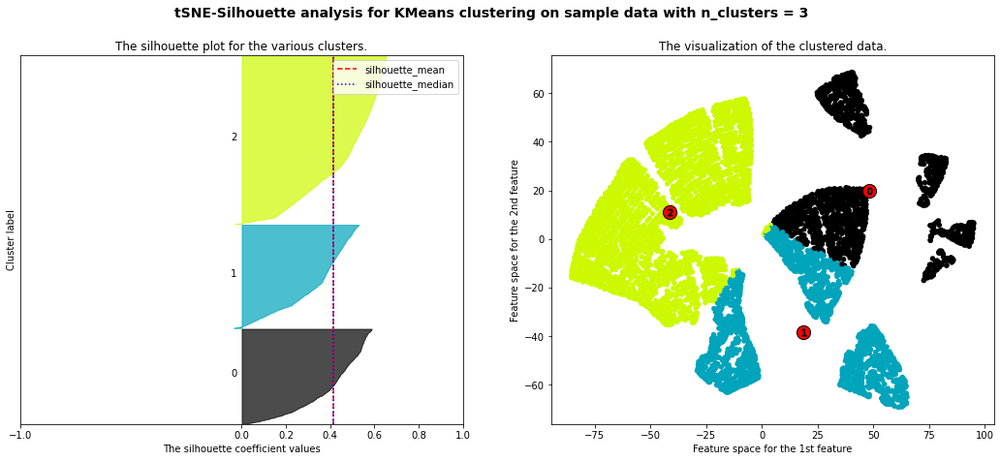

For n_clusters = 3 The average silhouette_score is : 0.4142059
For n_clusters = 3 The Davies-Bouldin score is : 0.926007006422202
For n_clusters = 3 The ratio mean/median silhouette is : 1.0045123


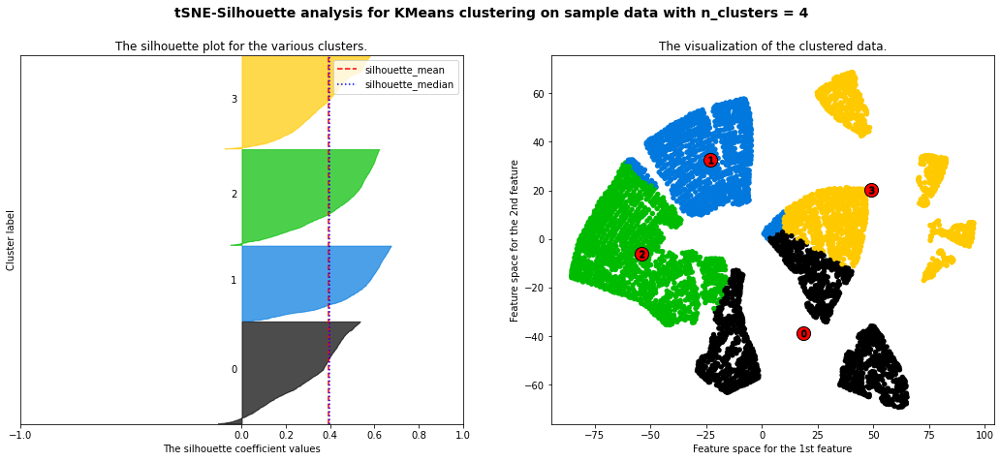

For n_clusters = 4 The average silhouette_score is : 0.39132705
For n_clusters = 4 The Davies-Bouldin score is : 0.889730872770433
For n_clusters = 4 The ratio mean/median silhouette is : 0.9868434966215899


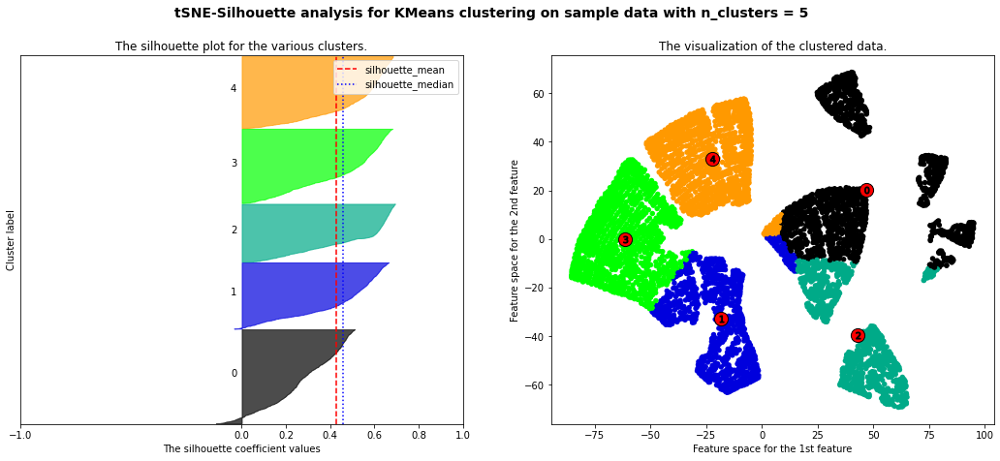

For n_clusters = 5 The average silhouette_score is : 0.4253953
For n_clusters = 5 The Davies-Bouldin score is : 0.7772895288071848
For n_clusters = 5 The ratio mean/median silhouette is : 0.9310299


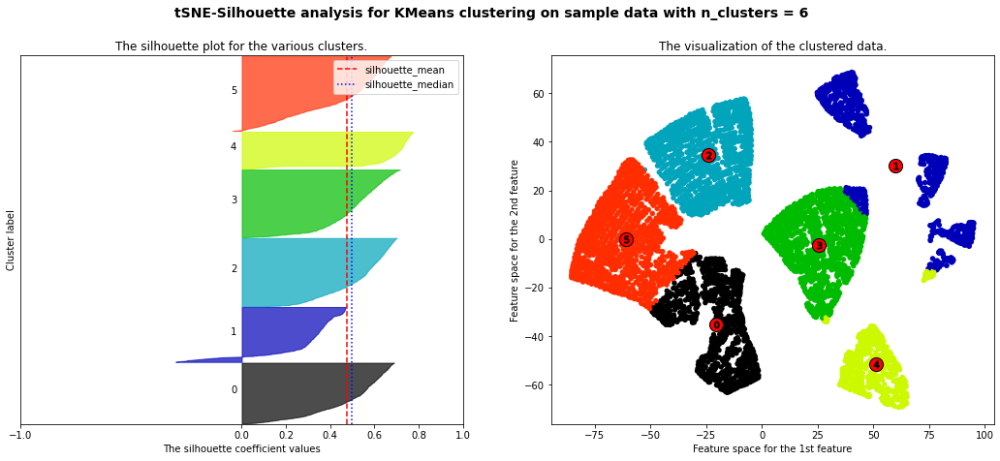

For n_clusters = 6 The average silhouette_score is : 0.47567666
For n_clusters = 6 The Davies-Bouldin score is : 0.7693756970454877
For n_clusters = 6 The ratio mean/median silhouette is : 0.9544386282303001


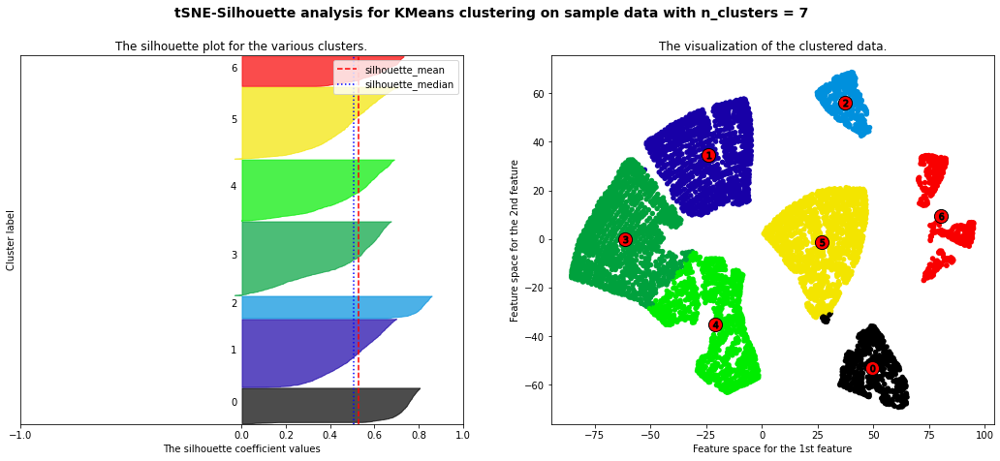

For n_clusters = 7 The average silhouette_score is : 0.5297472
For n_clusters = 7 The Davies-Bouldin score is : 0.5999135780676701
For n_clusters = 7 The ratio mean/median silhouette is : 1.0488259


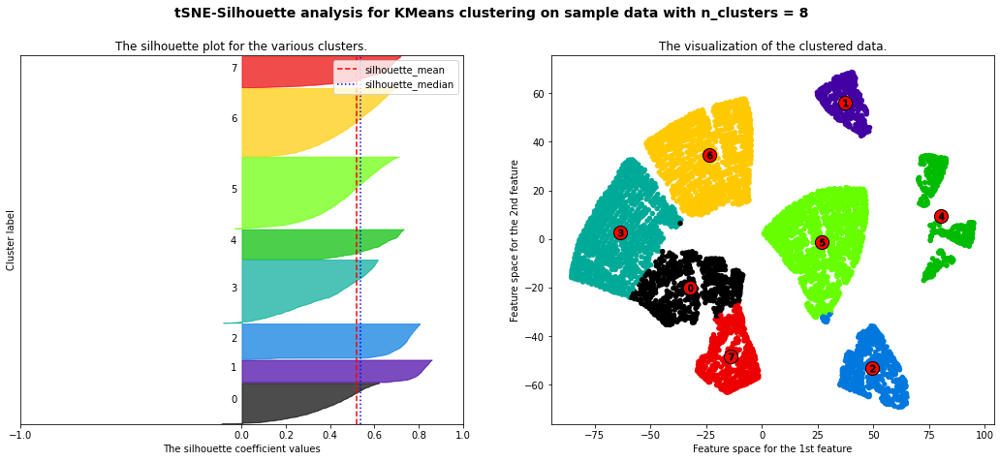

For n_clusters = 8 The average silhouette_score is : 0.517842
For n_clusters = 8 The Davies-Bouldin score is : 0.6431151434436363
For n_clusters = 8 The ratio mean/median silhouette is : 0.9644367335412006


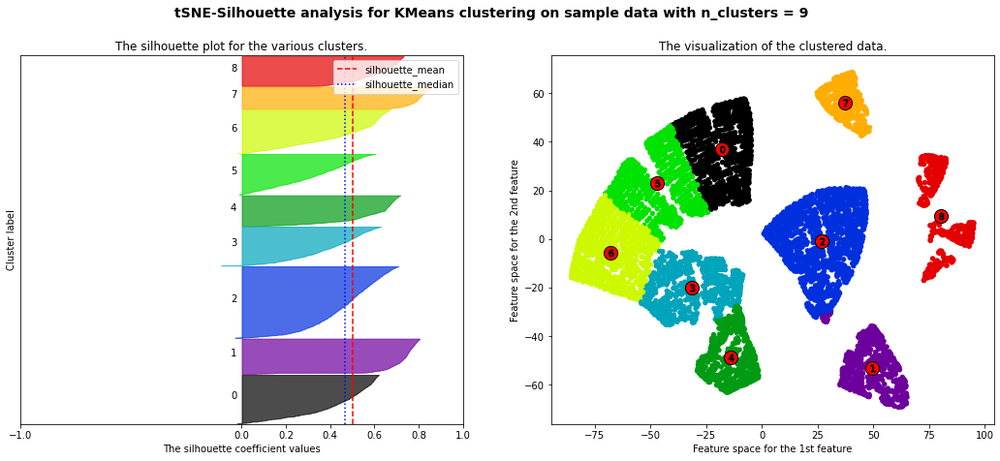

For n_clusters = 9 The average silhouette_score is : 0.5007565
For n_clusters = 9 The Davies-Bouldin score is : 0.6837638118116468
For n_clusters = 9 The ratio mean/median silhouette is : 1.0772158


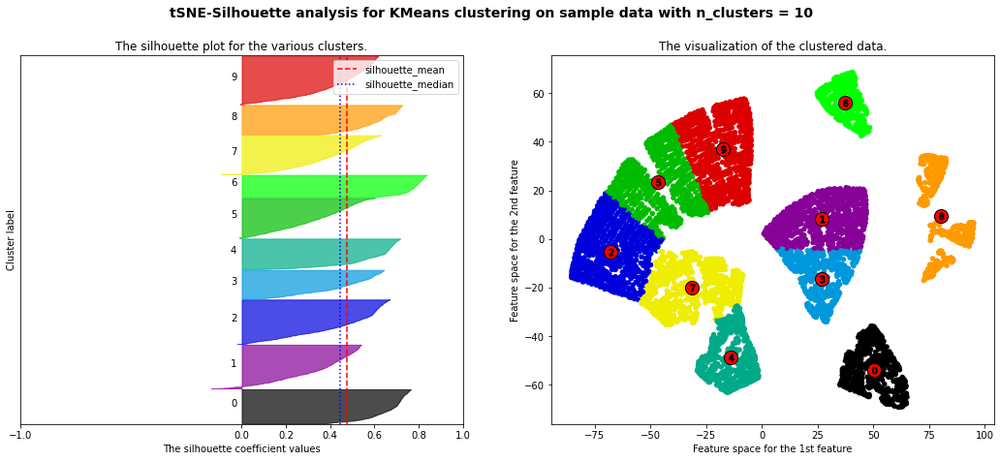

For n_clusters = 10 The average silhouette_score is : 0.4757499
For n_clusters = 10 The Davies-Bouldin score is : 0.7564859352782054
For n_clusters = 10 The ratio mean/median silhouette is : 1.06592928984223


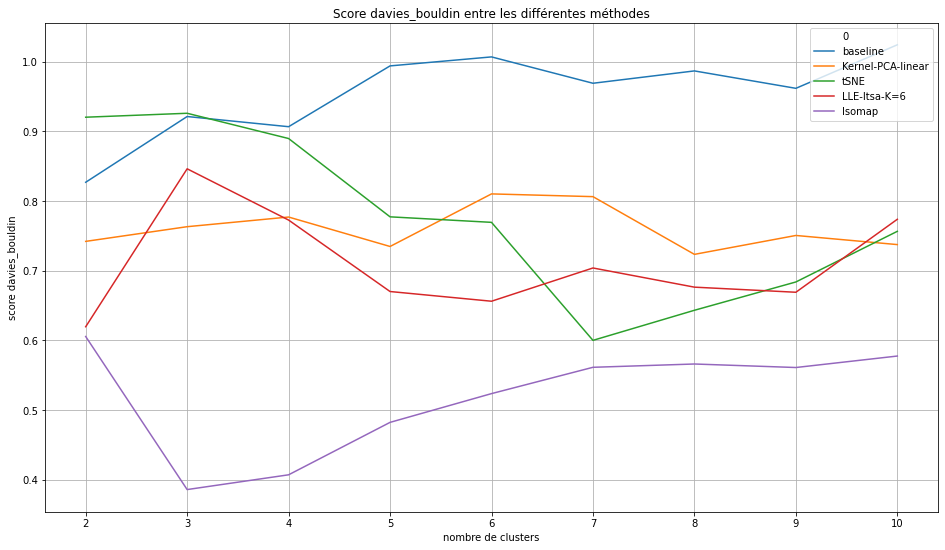

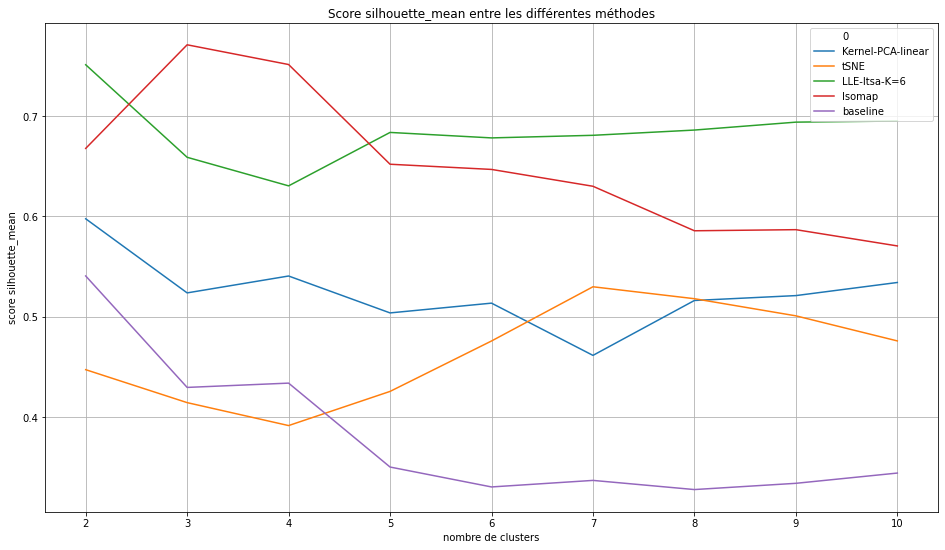

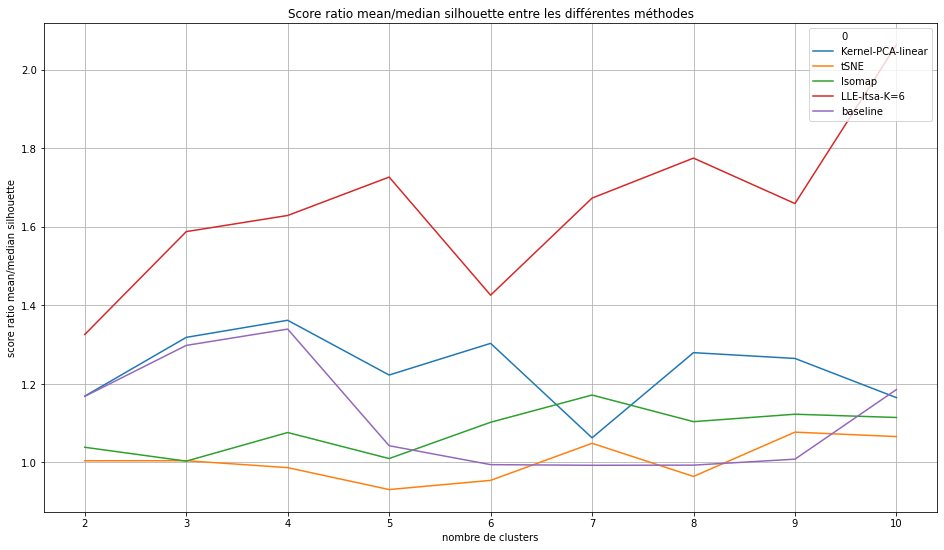

In [47]:
# initialisation du nombre de clusters à tester
n_clusters = np.arange(2, 11)
scores = []
labels = {}

for proj_name in methode_list:

    if "baseline" in proj_name:
        print("Clustering Kmeans de la baseline")
    else:
        print("Clustering Kmeans selon la projection "+str(proj_name))

    # initialisation du tableau de score des clusters
    scores_cluster = []

    for c in n_clusters:
        # Clustering avec KMeans
        km = KMeans(n_clusters=c)
        km.fit(projections[proj_name])
        cluster_labels = km.labels_
        scores_cluster, labels[proj_name+"-Clusters:"+str(
            c)] = Kmeans_plot_silhouette_score(proj_name, c, projections[proj_name], km)
        if len(scores) == 0:
            scores = scores_cluster

        else:
            scores = np.concatenate([scores, scores_cluster])


score_type_list = ['davies_bouldin',
                   'silhouette_mean', 'ratio mean/median silhouette']

# sklearn.metrics.silhouette_score:
# mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample.
# The Silhouette Coefficient for a sample is (b - a) / max(a, b)

# sklearn.metrics.davies_bouldin_score
# The score is defined as the average similarity measure of each cluster with its most similar cluster,
# where similarity is the ratio of within-cluster distances to between-cluster distances.

scores_df = pd.DataFrame(scores)
scores_df[3] = scores_df[3].astype("float")
scores_df[1] = scores_df[1].astype("int")
scores_df = scores_df[scores_df[1] != 1]
scores_df = scores_df.sort_values(by=[1])

for score in score_type_list:
    scores_item_df = scores_df[scores_df[2] == score]
    plt.figure(figsize=(16, 9))
    sns.lineplot(x=1, y=3, data=scores_item_df, hue=0,
                 markers=["o"],  legend="brief")
    plt.xlabel("nombre de clusters")
    plt.ylabel("score "+str(score))
    plt.title("Score "+str(score)+" entre les différentes méthodes")
    plt.legend(loc="upper right")
    plt.grid(True)
    plt.show()

Analyse du résultat de clustering avec Kmeans:

Le score de silhouette le plus élevé ainsi que le score de davis-bouldin le plus faible sont obtenus avec la projection Isomap pour un nombre de cluster de 3, 4 et5. 

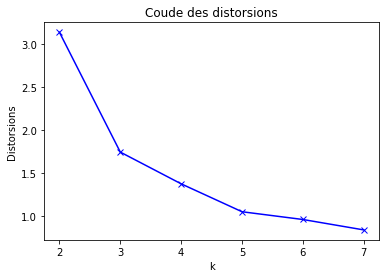

In [48]:
colors = ['b', 'g', 'r']
markers = ['o', 'v', 's']

distorsions = []
K = range(2, 8)

for k in K:
    km = KMeans(n_clusters=k)
    km.fit(projections['Isomap'])

    distorsions.append(sum(np.min(cdist(
        projections['Isomap'], km.cluster_centers_, 'euclidean'), axis=1))/len(projections['Isomap']))

# Je graphe la courbe
plt.plot(K, distorsions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distorsions')
plt.title('Coude des distorsions')
plt.show()

J'observe un coude vers la valeur 4

Je vais analyser les clusters trouvés avec K = 4

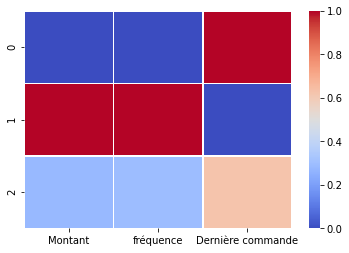

In [49]:
plot_custumer_cluster(X_scaled_reduced, labels, 'Isomap-Clusters:3')

Clustering avec DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

Graphique distances moyennes entre chaque point et ses 10 plus proches voisins.


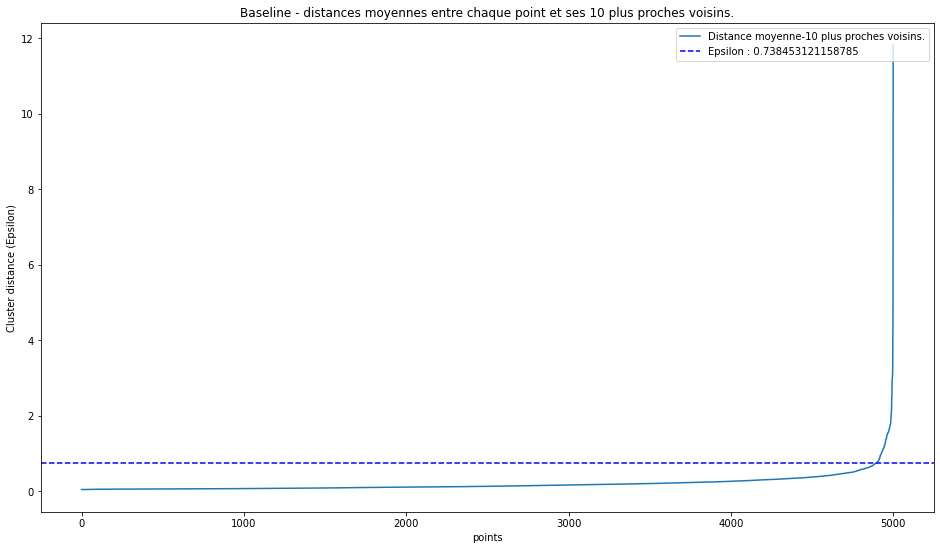

Graphique distances moyennes entre chaque point et ses 60 plus proches voisins.


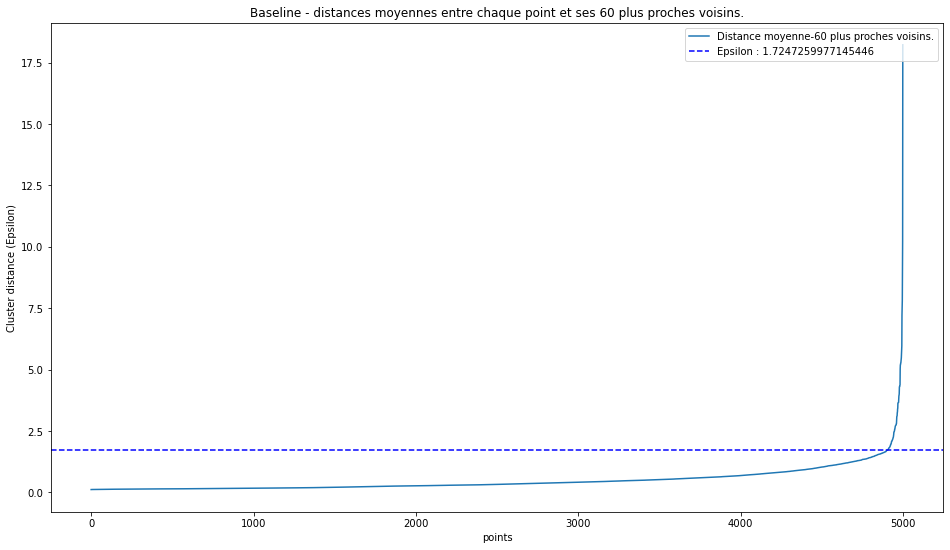

Graphique distances moyennes entre chaque point et ses 110 plus proches voisins.


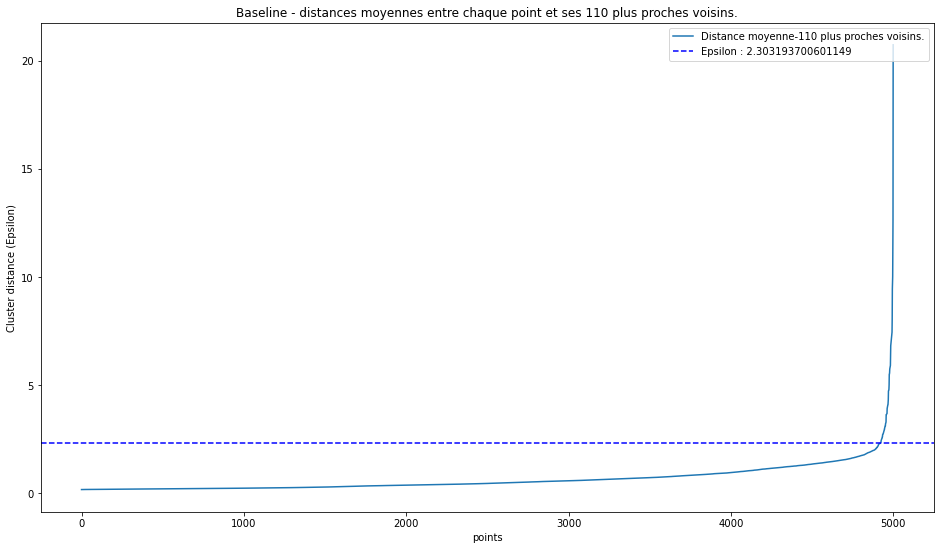

Graphique distances moyennes entre chaque point et ses 160 plus proches voisins.


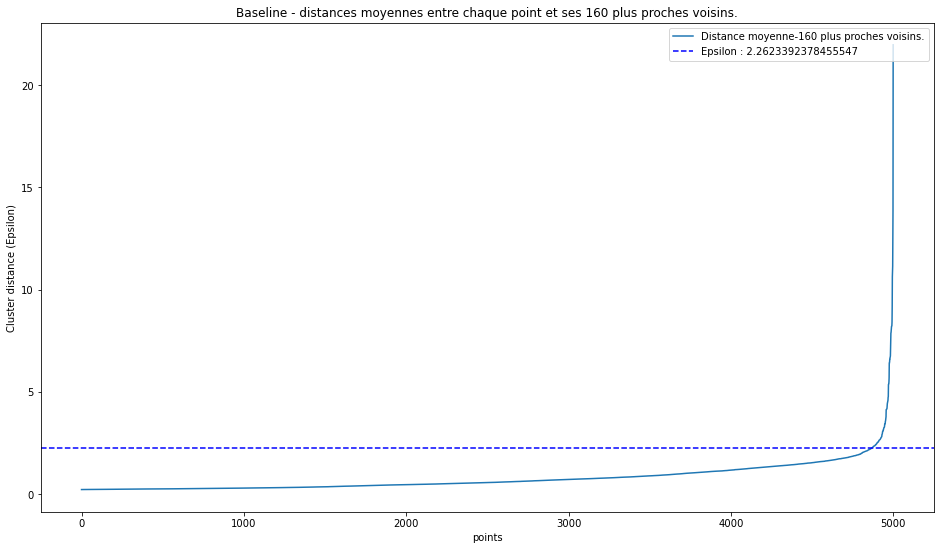

Graphique distances moyennes entre chaque point et ses 210 plus proches voisins.


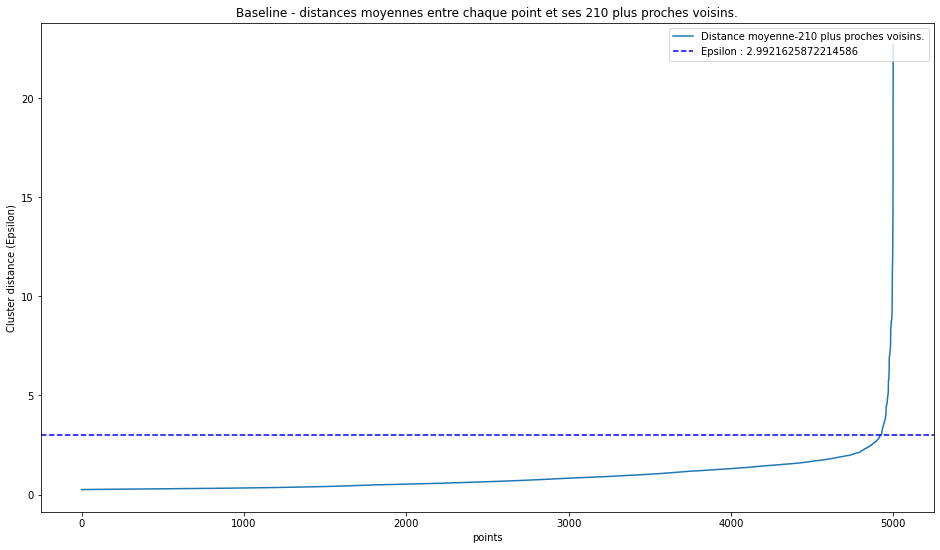

Graphique distances moyennes entre chaque point et ses 10 plus proches voisins.


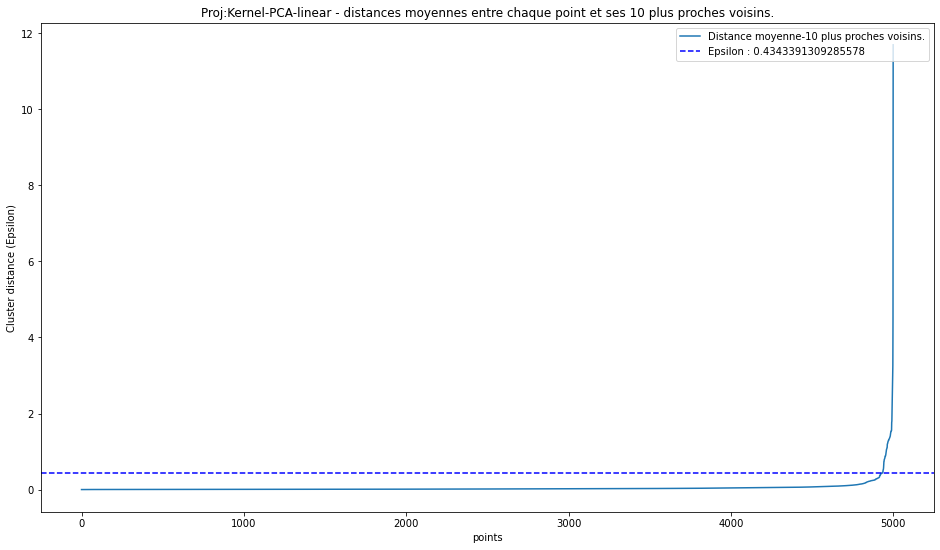

Graphique distances moyennes entre chaque point et ses 60 plus proches voisins.


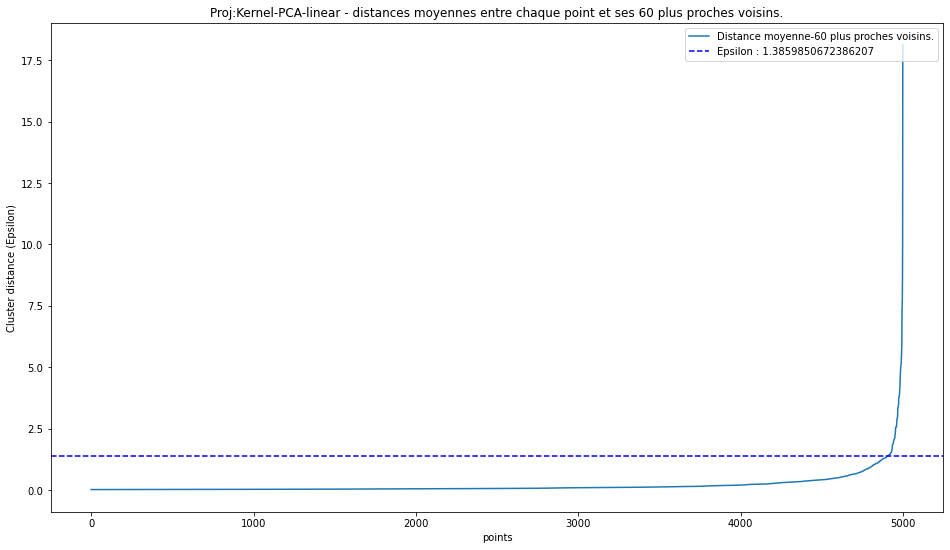

Graphique distances moyennes entre chaque point et ses 110 plus proches voisins.


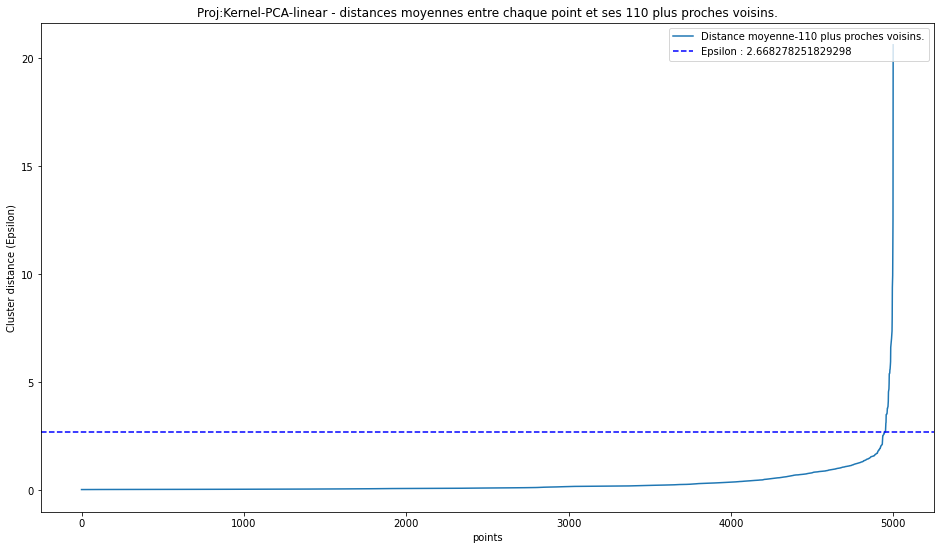

Graphique distances moyennes entre chaque point et ses 160 plus proches voisins.


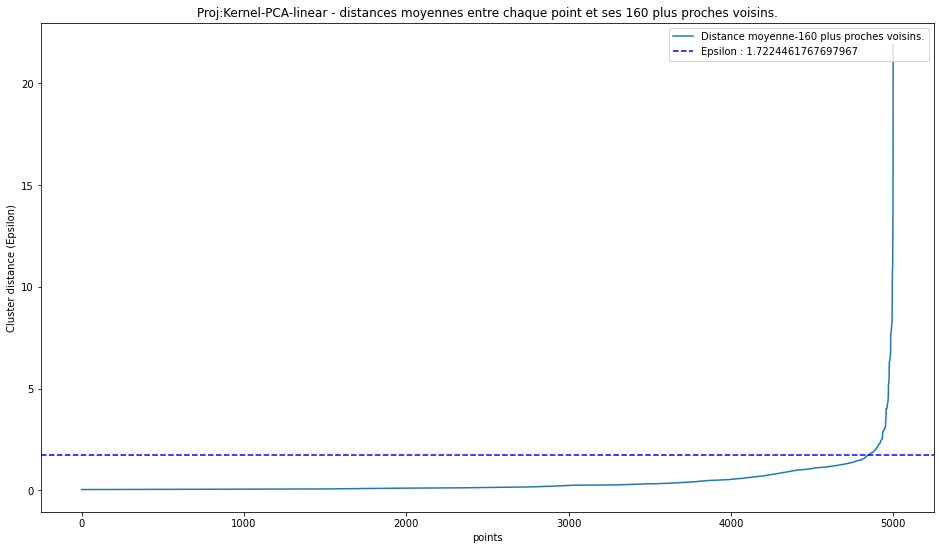

Graphique distances moyennes entre chaque point et ses 210 plus proches voisins.


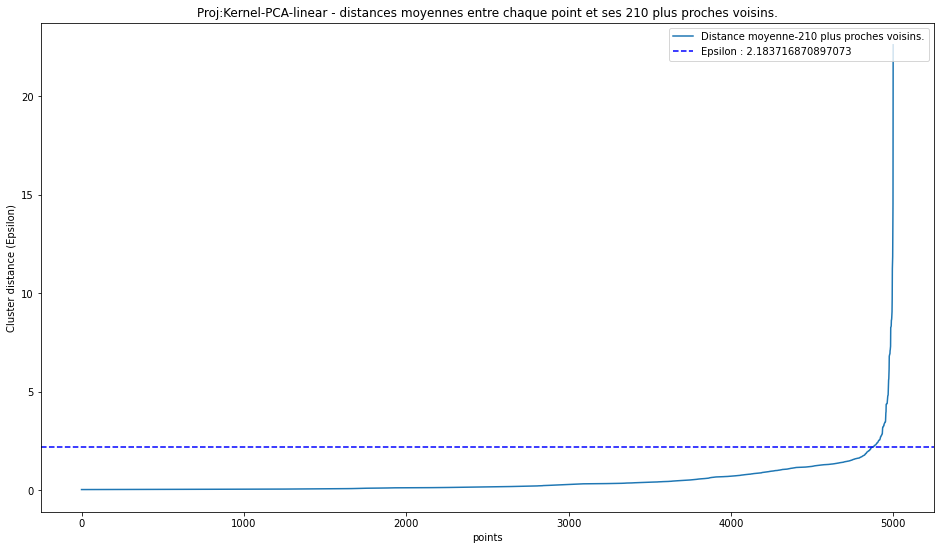

Graphique distances moyennes entre chaque point et ses 10 plus proches voisins.


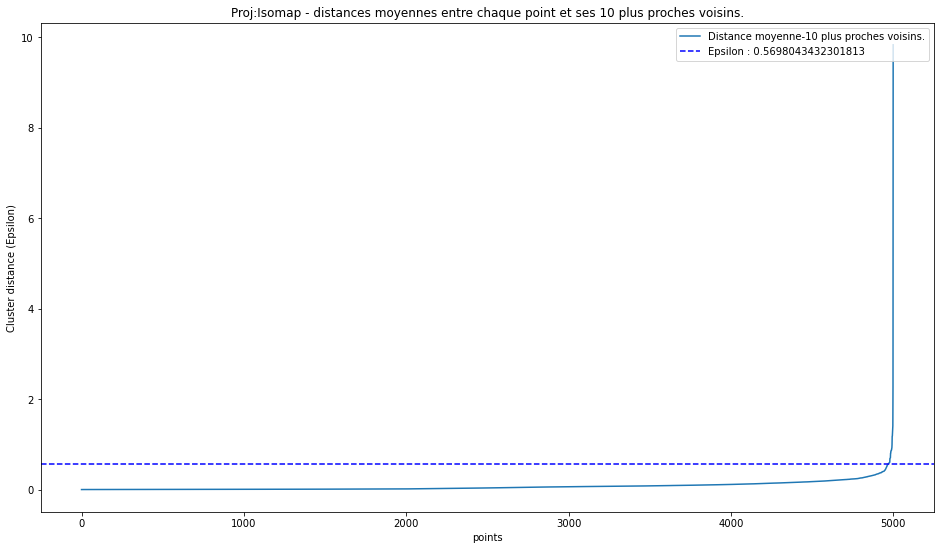

Graphique distances moyennes entre chaque point et ses 60 plus proches voisins.


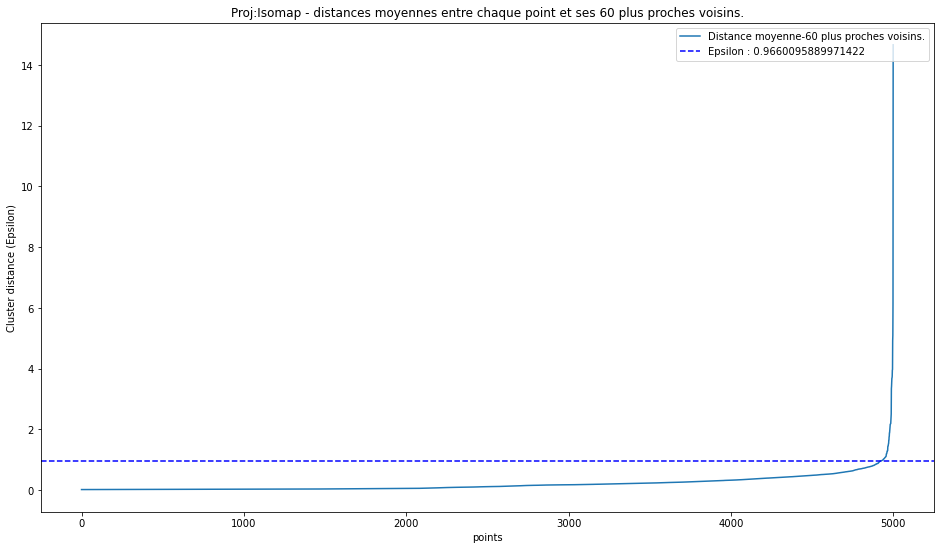

Graphique distances moyennes entre chaque point et ses 110 plus proches voisins.


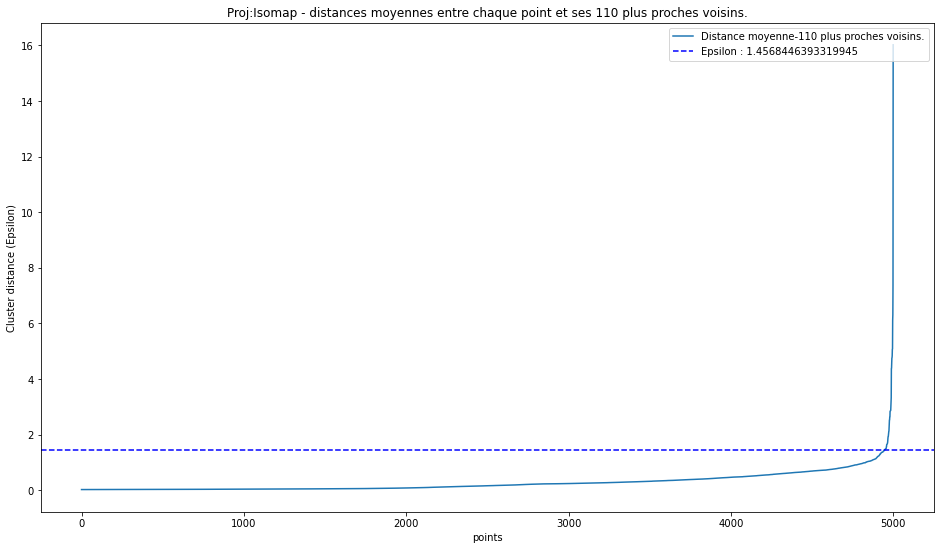

Graphique distances moyennes entre chaque point et ses 160 plus proches voisins.


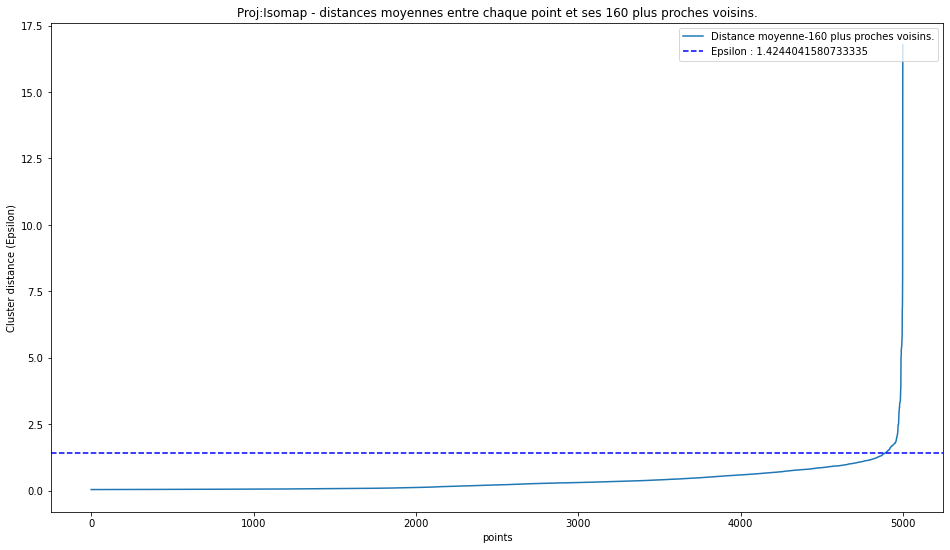

Graphique distances moyennes entre chaque point et ses 210 plus proches voisins.


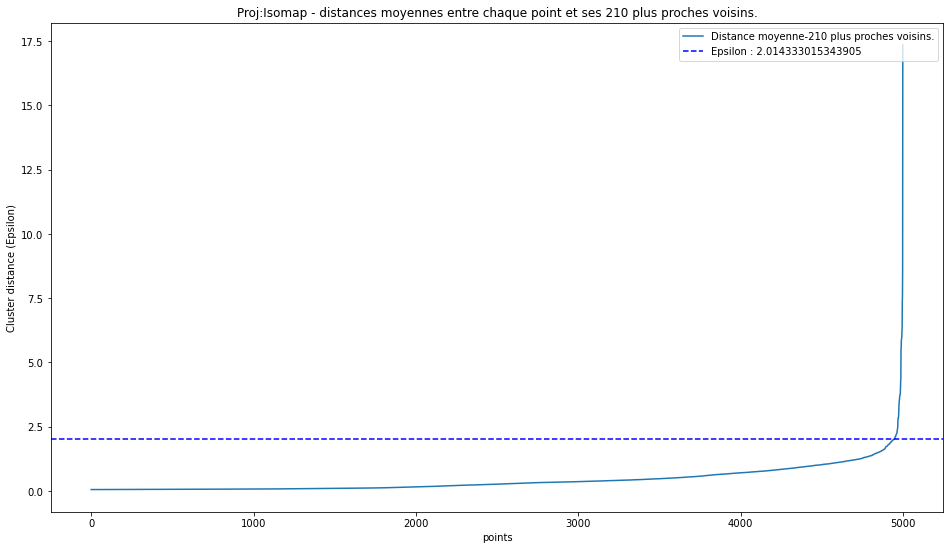

Graphique distances moyennes entre chaque point et ses 2 plus proches voisins.


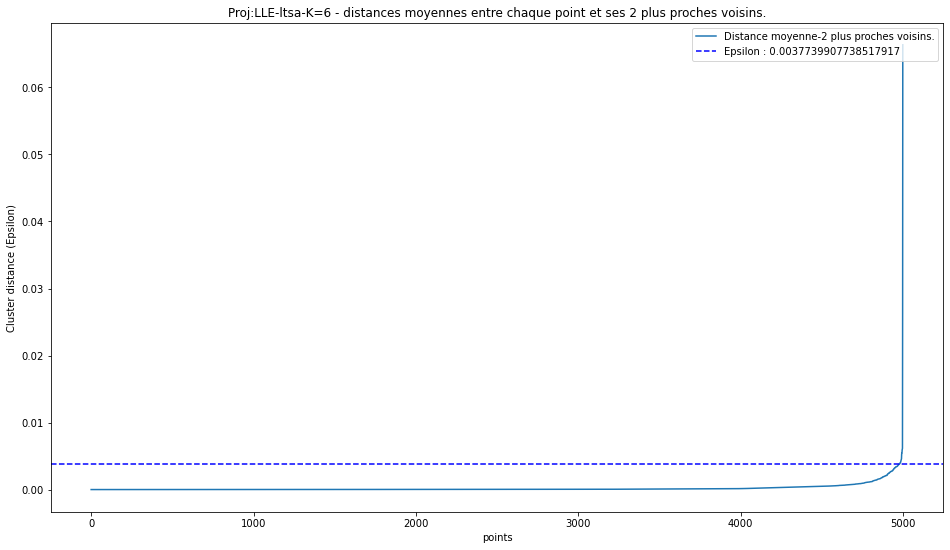

Graphique distances moyennes entre chaque point et ses 3 plus proches voisins.


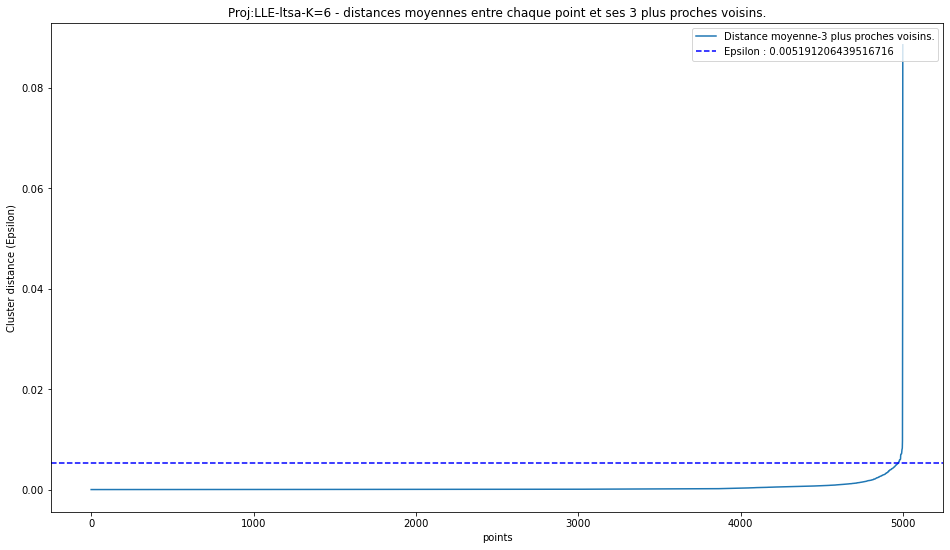

Graphique distances moyennes entre chaque point et ses 4 plus proches voisins.


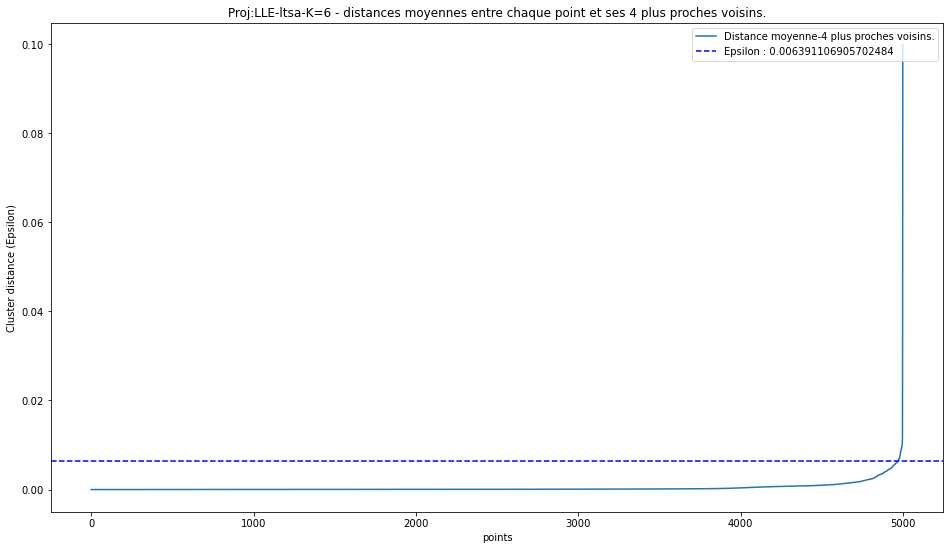

Graphique distances moyennes entre chaque point et ses 5 plus proches voisins.


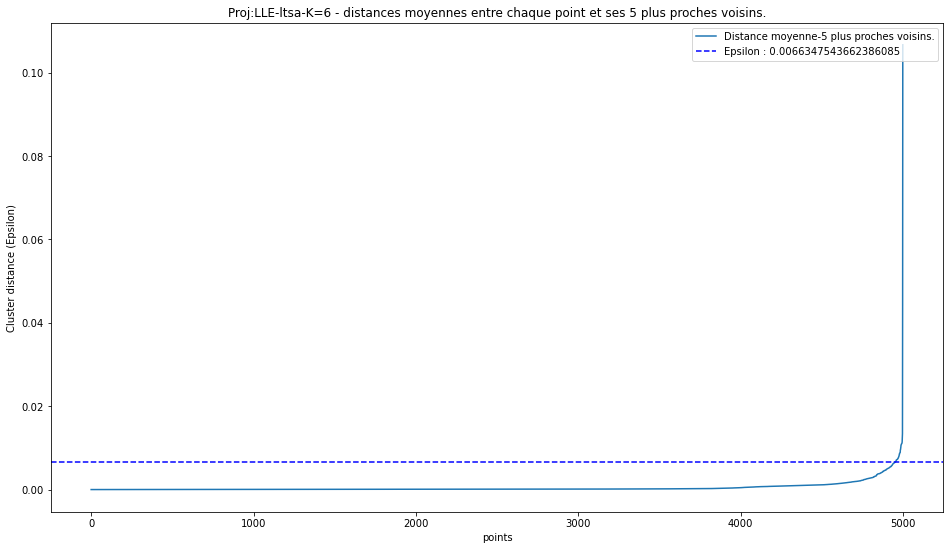

Graphique distances moyennes entre chaque point et ses 6 plus proches voisins.


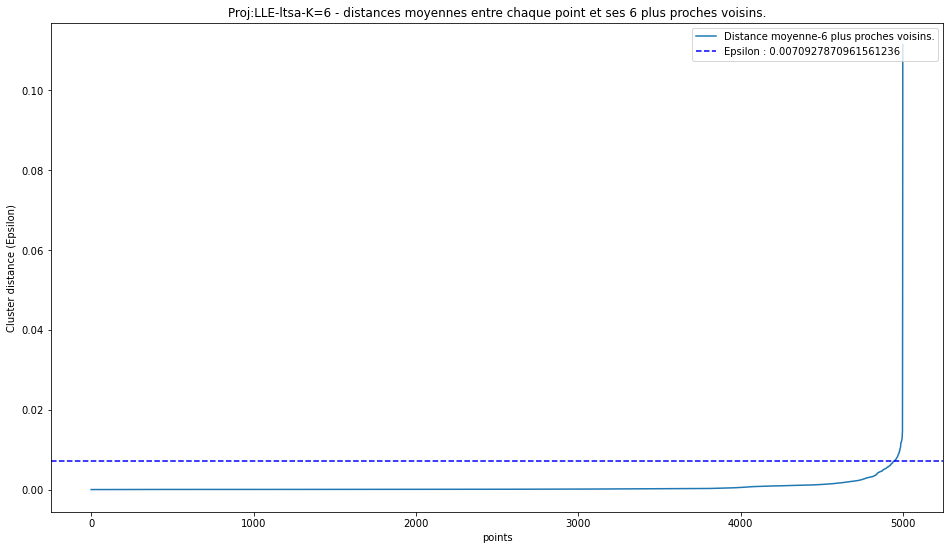

Graphique distances moyennes entre chaque point et ses 7 plus proches voisins.


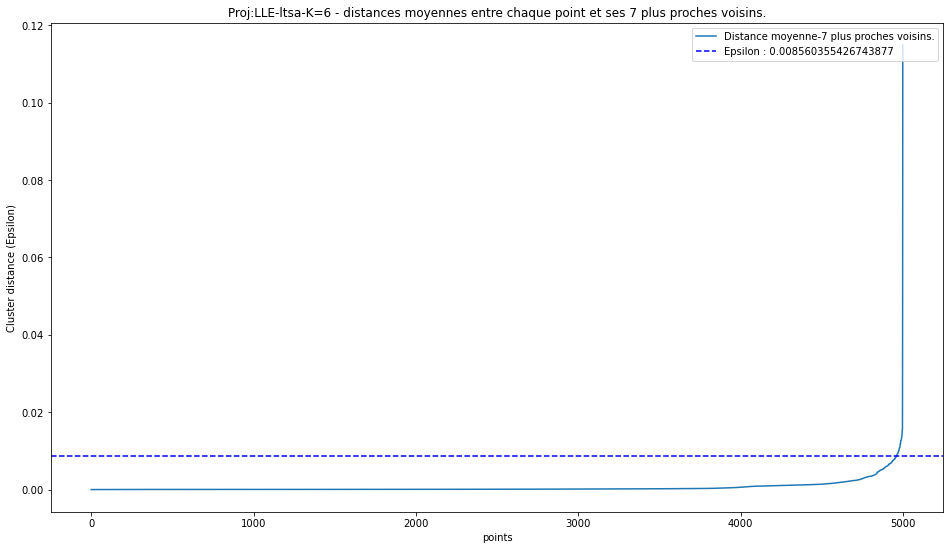

Graphique distances moyennes entre chaque point et ses 8 plus proches voisins.


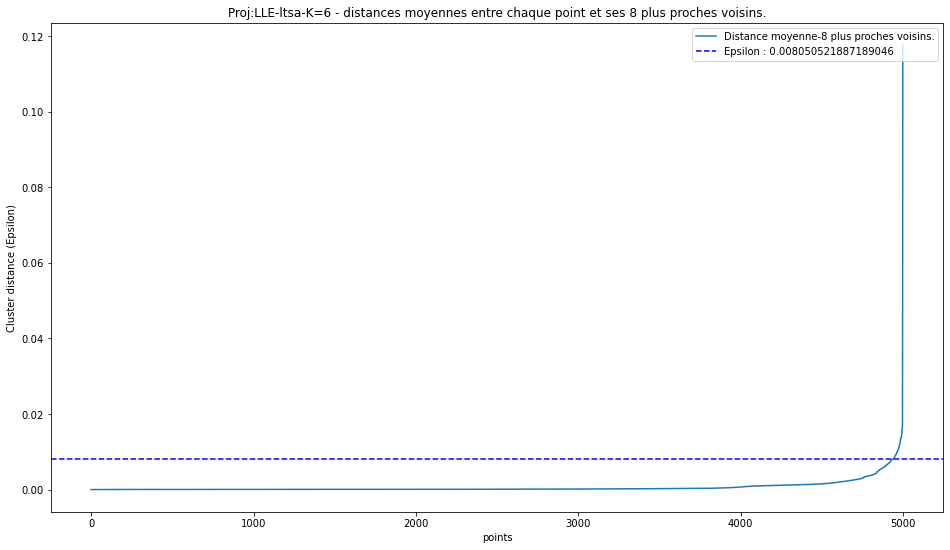

Graphique distances moyennes entre chaque point et ses 9 plus proches voisins.


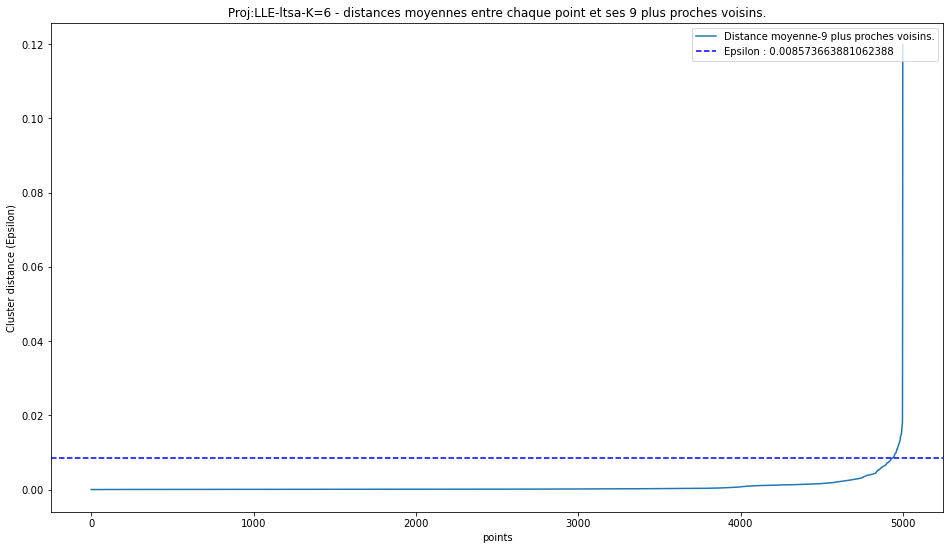

Graphique distances moyennes entre chaque point et ses 10 plus proches voisins.


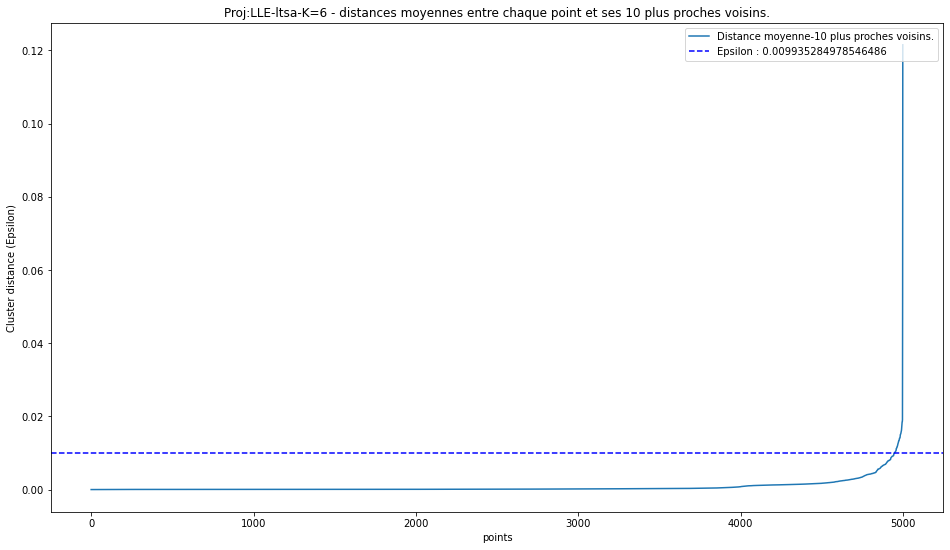

Graphique distances moyennes entre chaque point et ses 11 plus proches voisins.


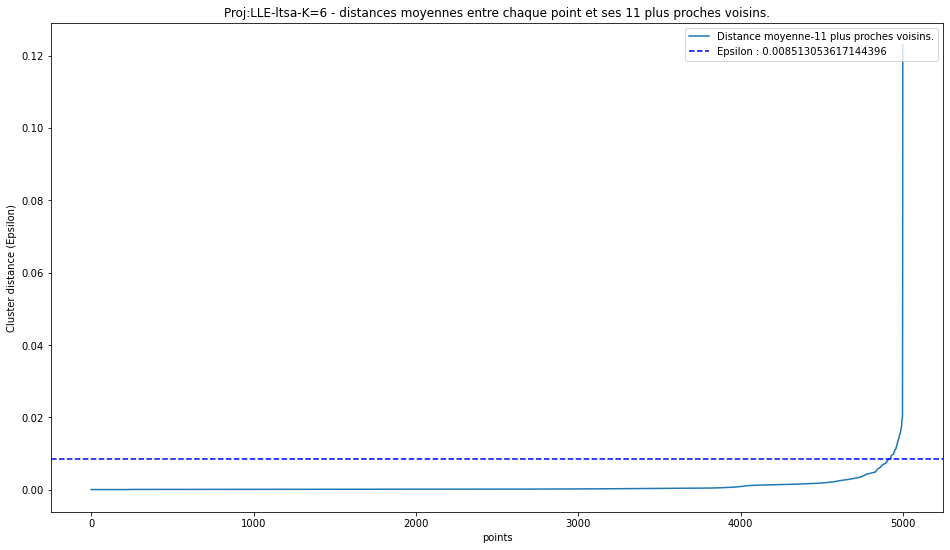

Graphique distances moyennes entre chaque point et ses 12 plus proches voisins.


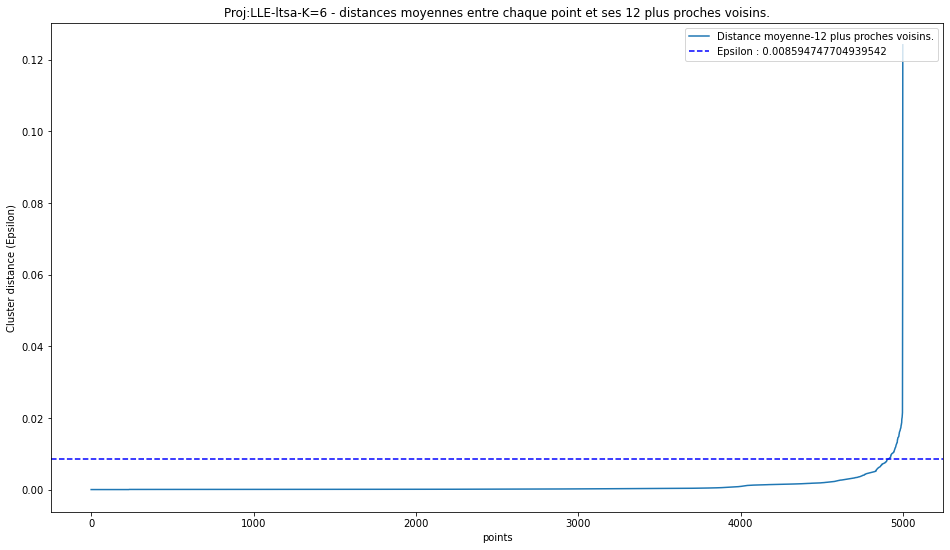

Graphique distances moyennes entre chaque point et ses 13 plus proches voisins.


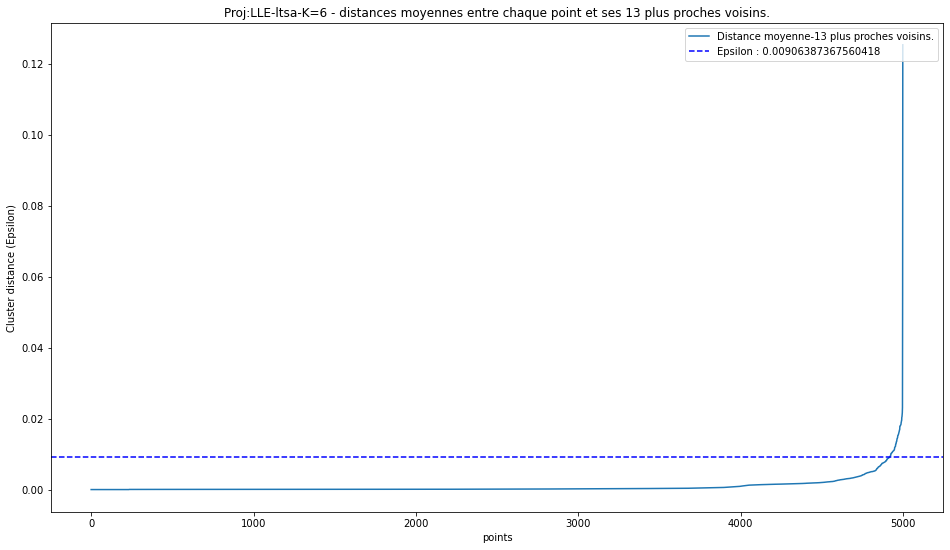

Graphique distances moyennes entre chaque point et ses 14 plus proches voisins.


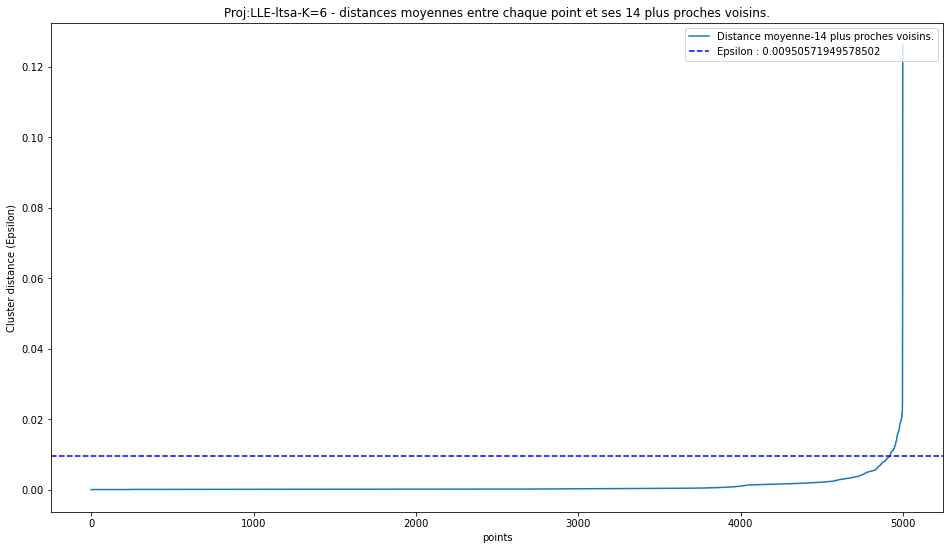

Graphique distances moyennes entre chaque point et ses 15 plus proches voisins.


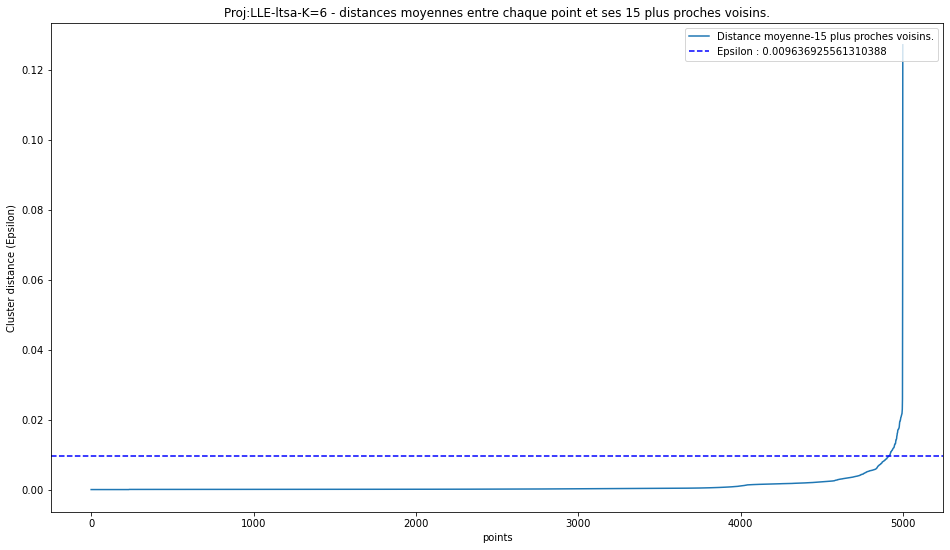

Graphique distances moyennes entre chaque point et ses 16 plus proches voisins.


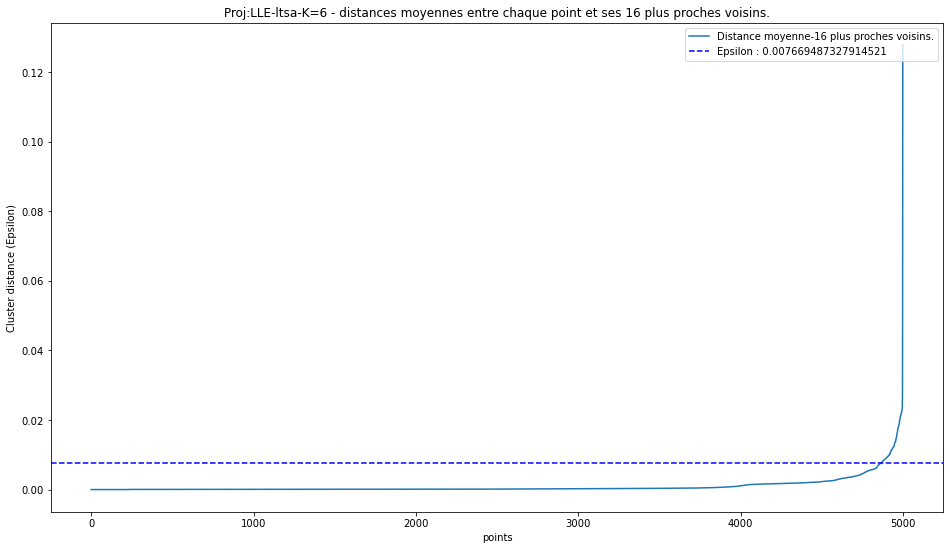

Graphique distances moyennes entre chaque point et ses 17 plus proches voisins.


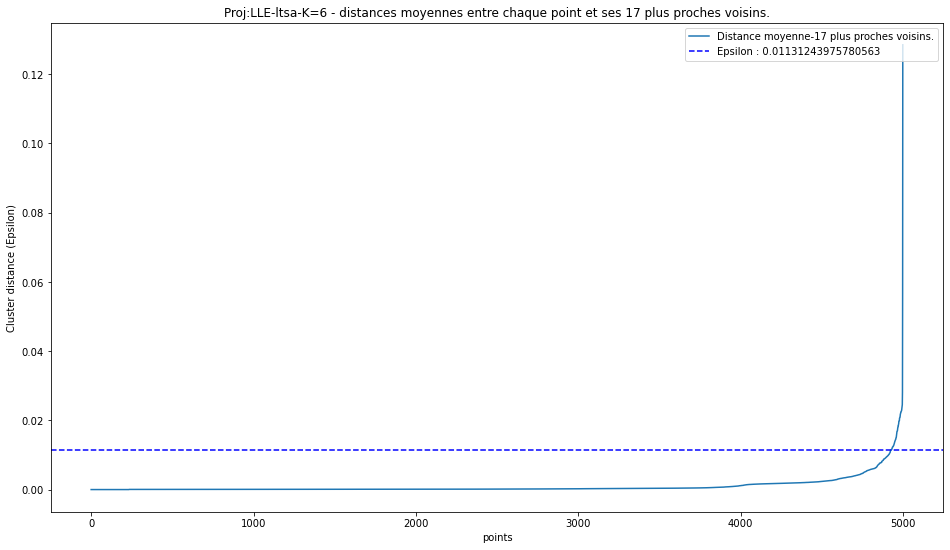

Graphique distances moyennes entre chaque point et ses 18 plus proches voisins.


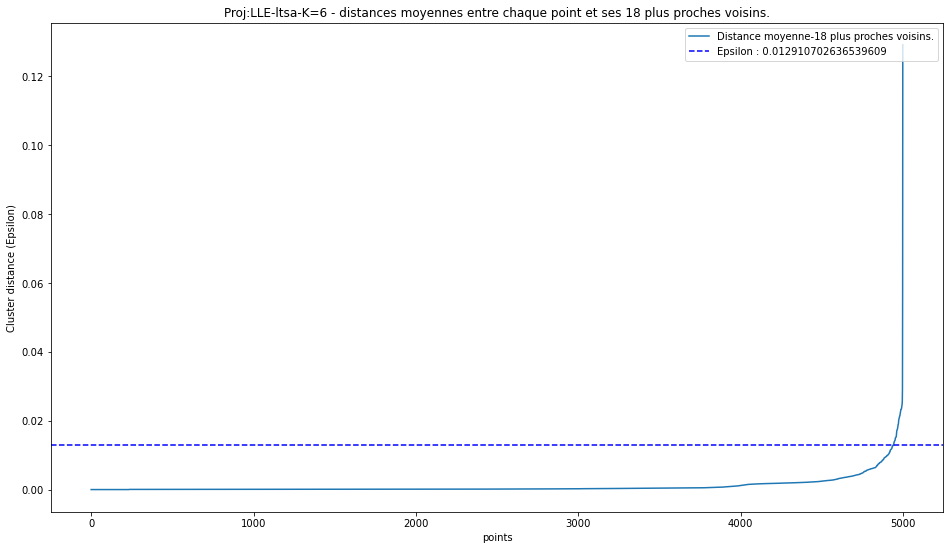

Graphique distances moyennes entre chaque point et ses 19 plus proches voisins.


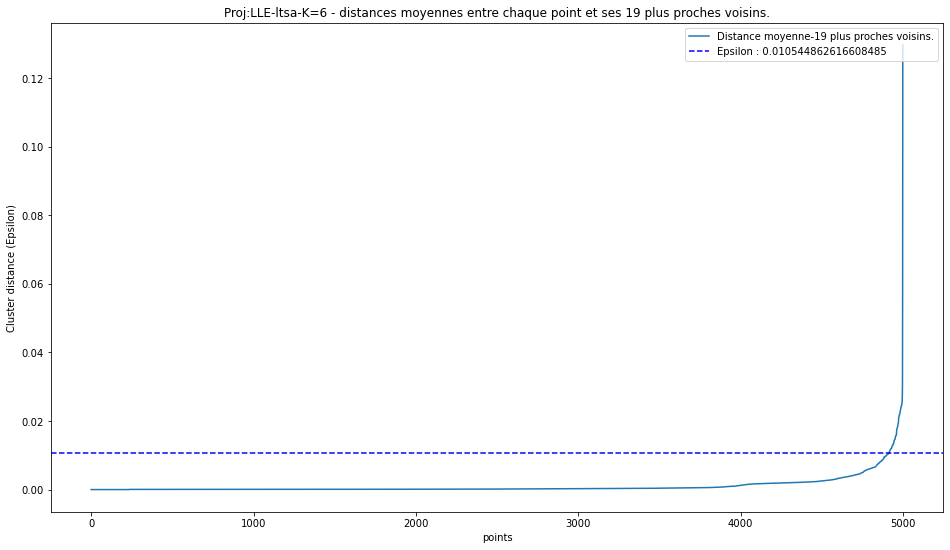

Graphique distances moyennes entre chaque point et ses 5 plus proches voisins.


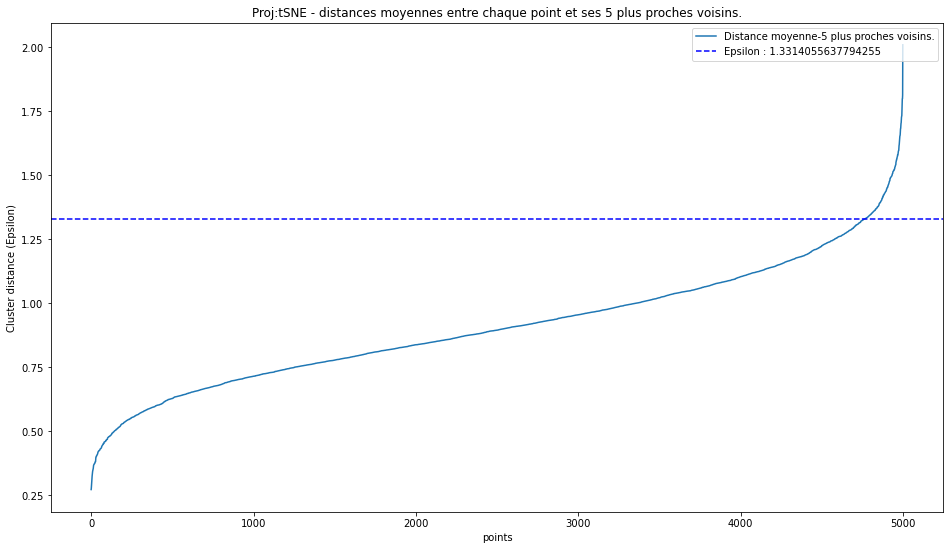

Graphique distances moyennes entre chaque point et ses 15 plus proches voisins.


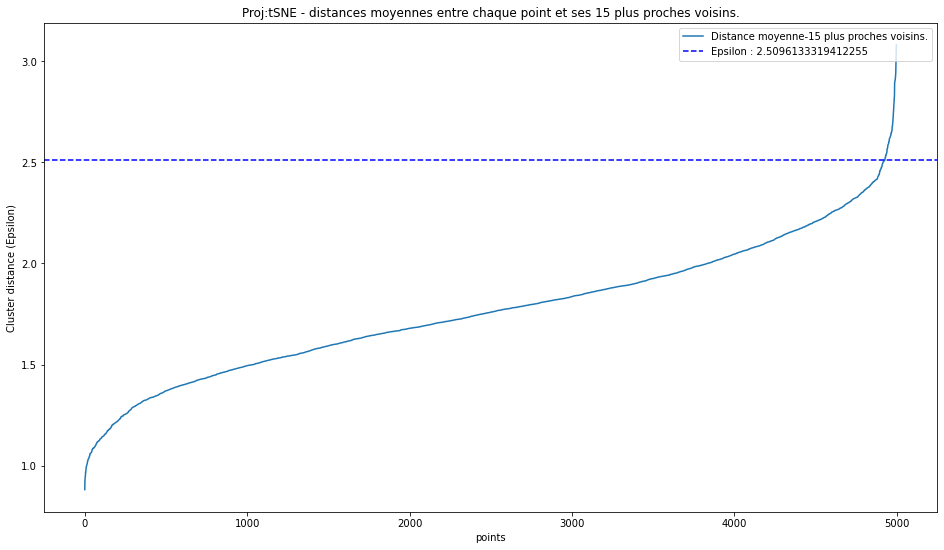

Graphique distances moyennes entre chaque point et ses 25 plus proches voisins.


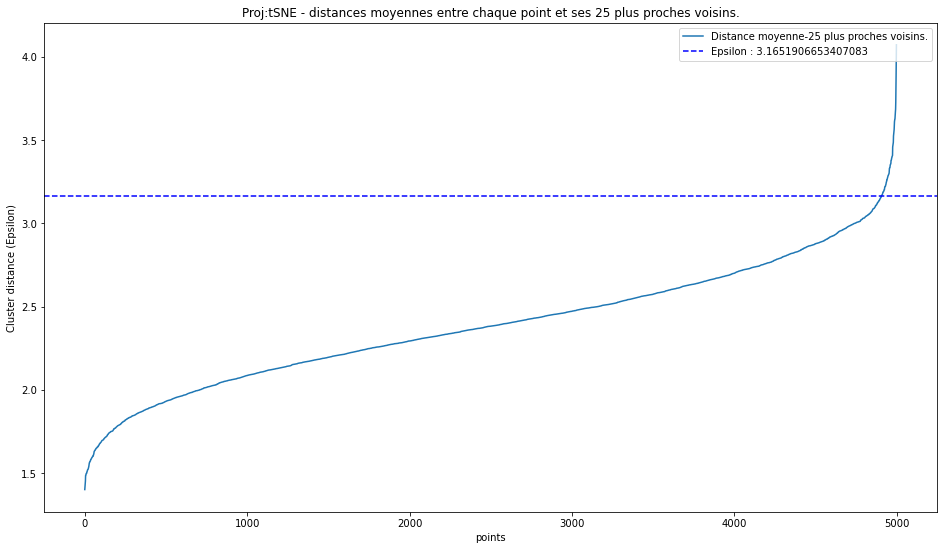

Graphique distances moyennes entre chaque point et ses 35 plus proches voisins.


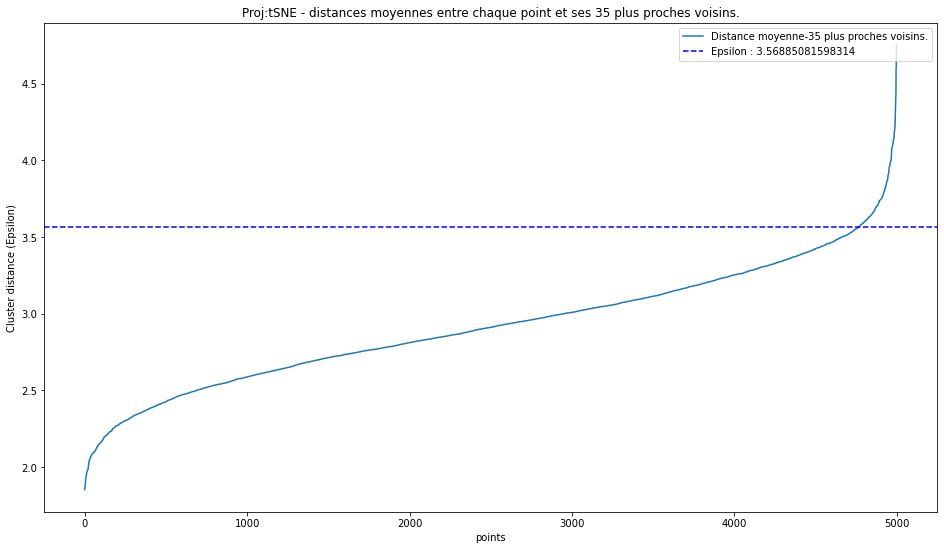

Graphique distances moyennes entre chaque point et ses 45 plus proches voisins.


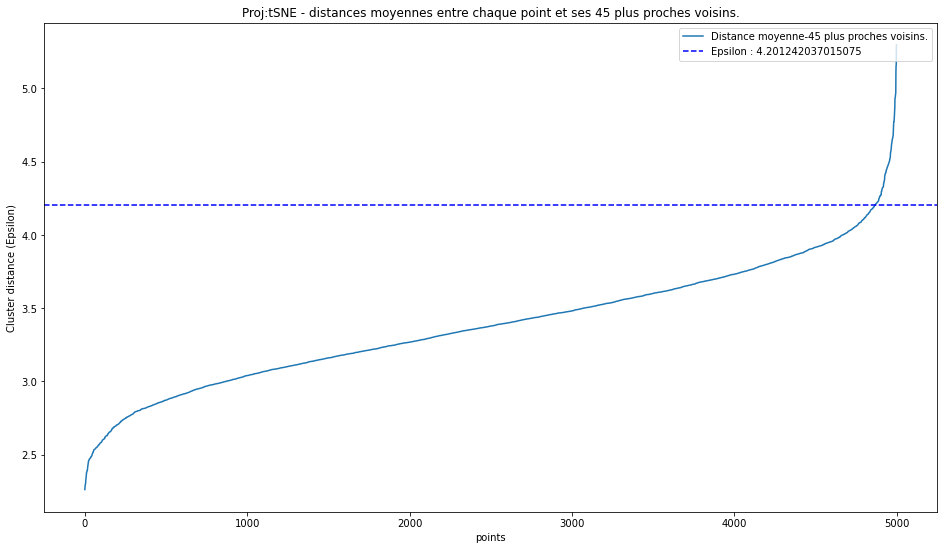

Graphique distances moyennes entre chaque point et ses 55 plus proches voisins.


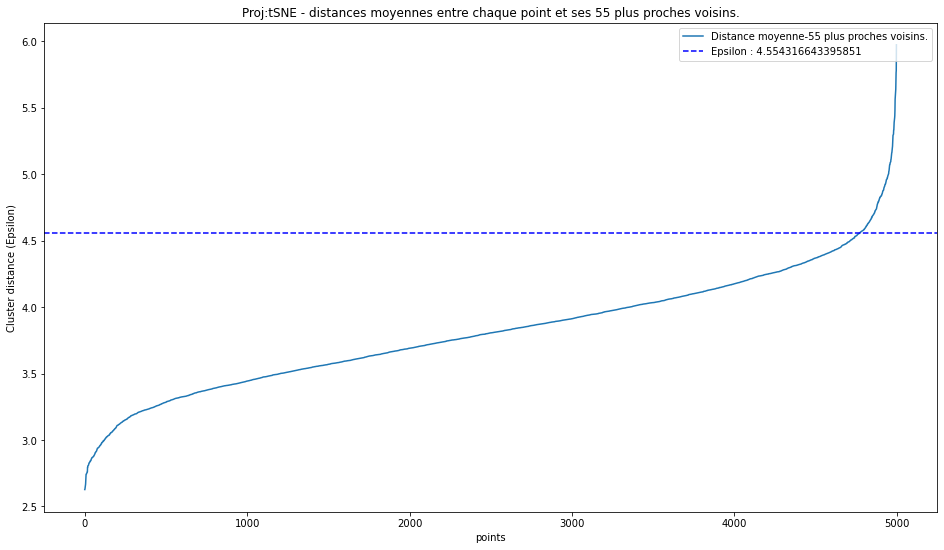

Graphique distances moyennes entre chaque point et ses 65 plus proches voisins.


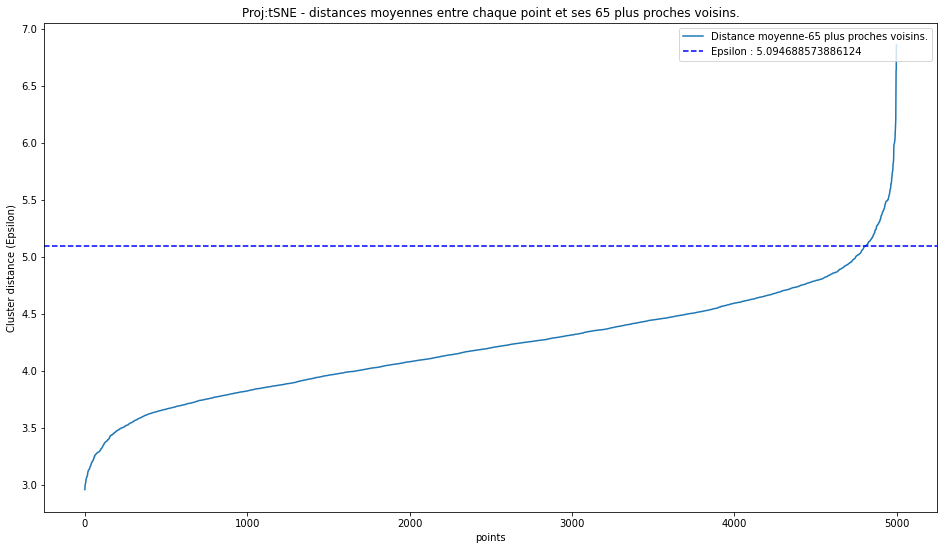

Graphique distances moyennes entre chaque point et ses 75 plus proches voisins.


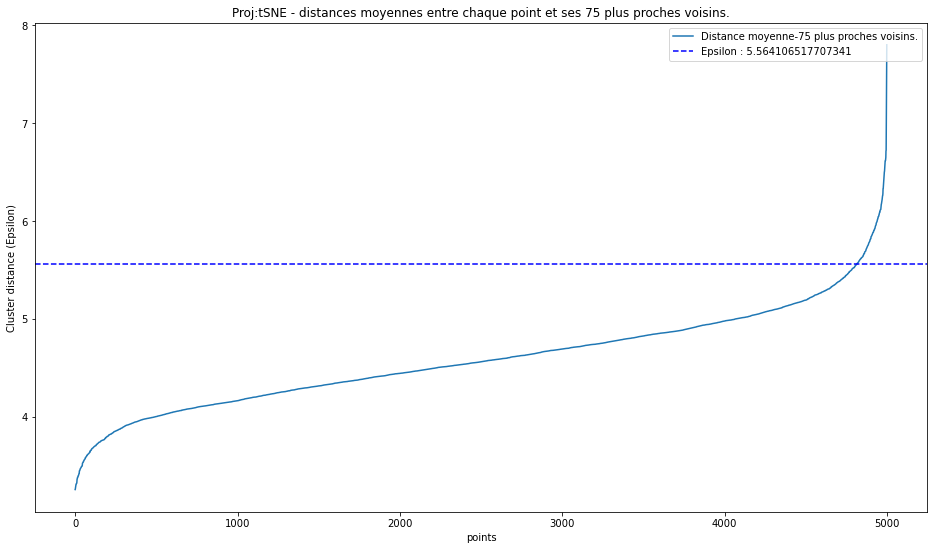

Graphique distances moyennes entre chaque point et ses 85 plus proches voisins.


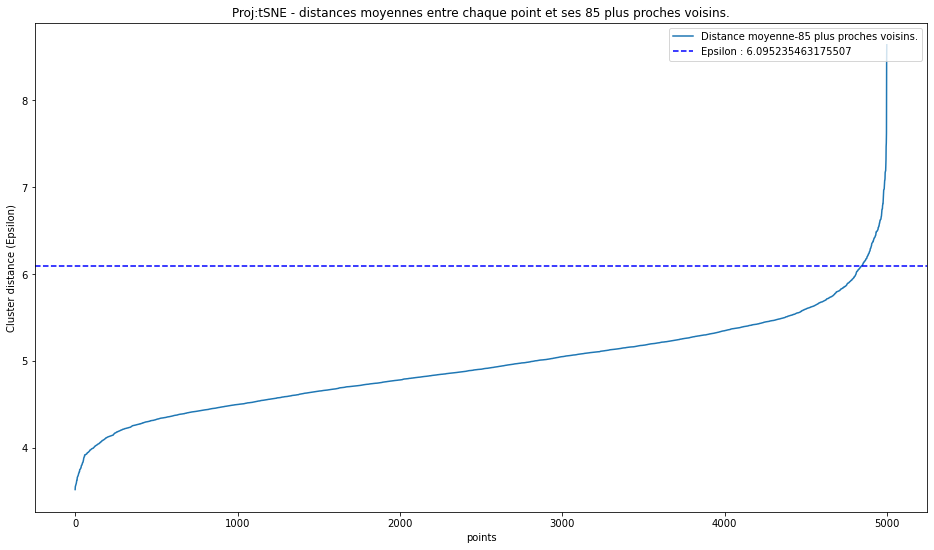

Graphique distances moyennes entre chaque point et ses 95 plus proches voisins.


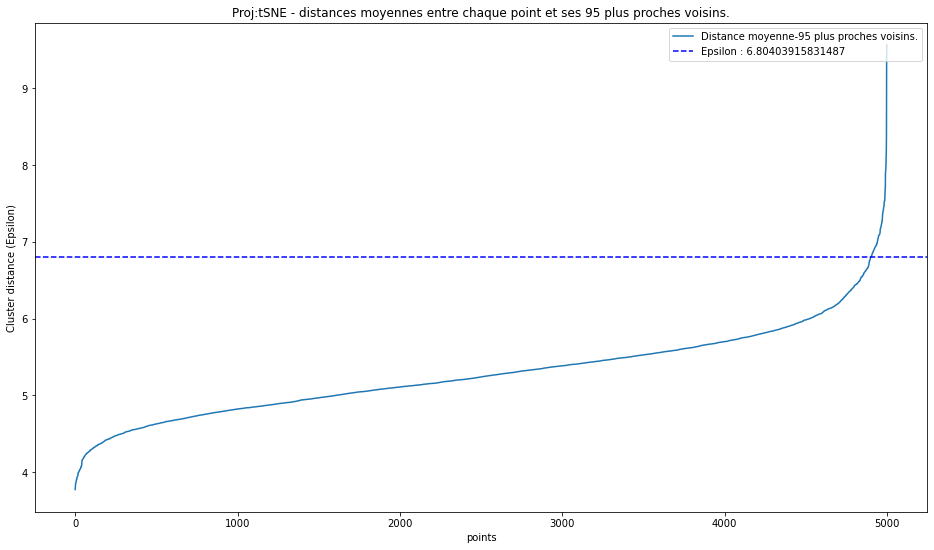

In [57]:
DBSCAN_eps_samples = []

S_values = {}

S_values['baseline'] = 1.4
S_values['Kernel-PCA-linear'] = 1.7
S_values['Isomap'] = 1.3
S_values['LLE-ltsa-K=6'] = 1.1
S_values['tSNE'] = 1.7


# Création des cas graphiques pour les projections : 'baseline','Kernel-PCA-linear','Isomap'
for name in ['baseline', 'Kernel-PCA-linear', 'Isomap']:
    for K in np.arange(10, 211, 50):

        # Sélection du dataset selon la projection
        X = projections[name]
        print('Graphique distances moyennes entre chaque point et ses ' +
              str(K)+' plus proches voisins.')

        # Entrainement d'un kNN
        neighbors = NearestNeighbors(n_neighbors=K)
        neighbors_fit = neighbors.fit(X)
        distances_K, indices = neighbors_fit.kneighbors(X)

        # Calcul des distances moyenne
        mean_distances_K = np.mean(distances_K, axis=1)
        mean_distances_K = np.sort(mean_distances_K, axis=0)

        # Localisation du point de courbure maximum et récupération de Epsilon correspondante(kneedle.knee_y)
        kneedle = KneeLocator(np.arange(0, len(X)), mean_distances_K,
                              S=S_values[name], curve="convex", direction="increasing")
        DBSCAN_eps_samples.append([name, K, kneedle.knee_y])

        # Graph des distances moyenne de n points par rapport à leur k plus proches voisins
        plt.figure(figsize=(16, 9))
        plt.plot(mean_distances_K, label="Distance moyenne-" +
                 str(K)+" plus proches voisins.")
        plt.axhline(y=kneedle.knee_y, color="blue", linestyle="--",
                    label="Epsilon : "+str(kneedle.knee_y))
        plt.xlabel("points")
        plt.ylabel("Cluster distance (Epsilon)")

        if name == 'baseline':
            plt.title('Baseline - distances moyennes entre chaque point et ses ' +
                      str(K)+' plus proches voisins.')
        else:
            plt.title('Proj:'+name+' - distances moyennes entre chaque point et ses ' +
                      str(K)+' plus proches voisins.')

        plt.legend(loc="upper right")
        plt.show()

# Création des cas graphiques pour les projections : 'LLE-ltsa-K=6'
for name in ['LLE-ltsa-K=6']:
    for K in np.arange(2, 20):

        # Sélection du dataset selon la projection
        X = projections[name]
        print('Graphique distances moyennes entre chaque point et ses ' +
              str(K)+' plus proches voisins.')

        # Entrainement d'un kNN
        neighbors = NearestNeighbors(n_neighbors=K)
        neighbors_fit = neighbors.fit(X)
        distances_K, indices = neighbors_fit.kneighbors(X)

        # Calcul des distances moyenne
        mean_distances_K = np.mean(distances_K, axis=1)
        mean_distances_K = np.sort(mean_distances_K, axis=0)

        # Localisation du point de courbure maximum et récupération de Epsilon correspondante(kneedle.knee_y)
        kneedle = KneeLocator(np.arange(0, len(X)), mean_distances_K,
                              S=S_values[name], curve="convex", direction="increasing")
        DBSCAN_eps_samples.append([name, K, kneedle.knee_y])

        # Graph des distances moyenne de n points par rapport à leur k plus proches voisins
        plt.figure(figsize=(16, 9))
        plt.plot(mean_distances_K, label="Distance moyenne-" +
                 str(K)+" plus proches voisins.")
        plt.axhline(y=kneedle.knee_y, color="blue", linestyle="--",
                    label="Epsilon : "+str(kneedle.knee_y))
        plt.xlabel("points")
        plt.ylabel("Cluster distance (Epsilon)")

        if name == 'baseline':
            plt.title('Baseline - distances moyennes entre chaque point et ses ' +
                      str(K)+' plus proches voisins.')
        else:
            plt.title('Proj:'+name+' - distances moyennes entre chaque point et ses ' +
                      str(K)+' plus proches voisins.')

        plt.legend(loc="upper right")
        plt.show()


# Création des cas graphiques pour les projections : 'tSNE'
for name in ['tSNE']:
    for K in np.arange(5, 100, 10):
        # Sélection du dataset selon la projection
        X = projections[name]
        print('Graphique distances moyennes entre chaque point et ses ' +
              str(K)+' plus proches voisins.')

        # Entrainement d'un kNN
        neighbors = NearestNeighbors(n_neighbors=K)
        neighbors_fit = neighbors.fit(X)
        distances_K, indices = neighbors_fit.kneighbors(X)

        # Calcul des distances moyenne
        mean_distances_K = np.mean(distances_K, axis=1)
        mean_distances_K = np.sort(mean_distances_K, axis=0)

        # Localisation du point de courbure maximum et récupération de Epsilon correspondante(kneedle.knee_y)
        kneedle = KneeLocator(np.arange(0, len(X)), mean_distances_K,
                              S=S_values[name], curve="convex", direction="increasing")
        DBSCAN_eps_samples.append([name, K, kneedle.knee_y])

        # Graph des distances moyenne de n points par rapport à leur k plus proches voisins
        plt.figure(figsize=(16, 9))
        plt.plot(mean_distances_K, label="Distance moyenne-" +
                 str(K)+" plus proches voisins.")
        plt.axhline(y=kneedle.knee_y, color="blue", linestyle="--",
                    label="Epsilon : "+str(kneedle.knee_y))
        plt.xlabel("points")
        plt.ylabel("Cluster distance (Epsilon)")

        if name == 'baseline':
            plt.title('Baseline - distances moyennes entre chaque point et ses ' +
                      str(K)+' plus proches voisins.')
        else:
            plt.title('Proj:'+name+' - distances moyennes entre chaque point et ses ' +
                      str(K)+' plus proches voisins.')

        plt.legend(loc="upper right")
        plt.show()

        for eps in np.arange(1, 15, 2):
            DBSCAN_eps_samples.append(['tSNE', K, eps])

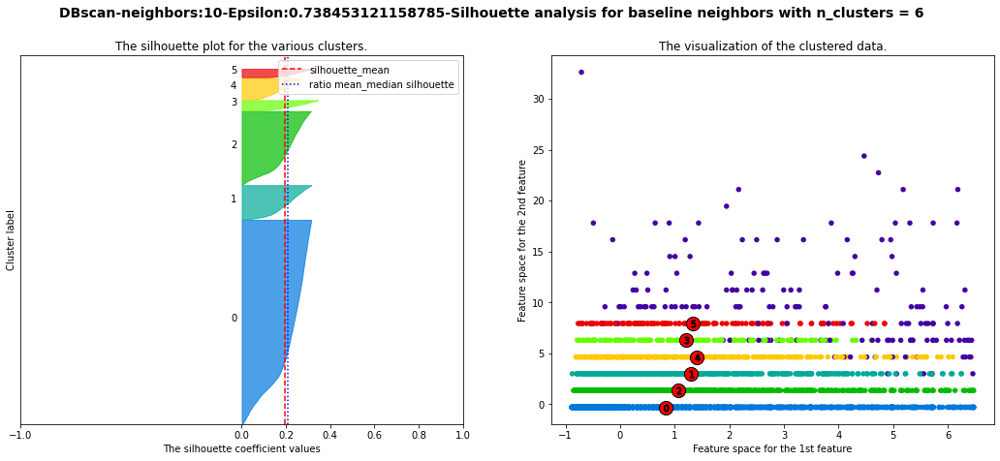

For n_clusters = 6 The average silhouette_score is : 0.1933169171590788
For n_clusters = 6 The Davies-Bouldin score is : 2.0536873227525585
For n_clusters = 6 The ratio mean/median silhouette is : 0.9215915083442108


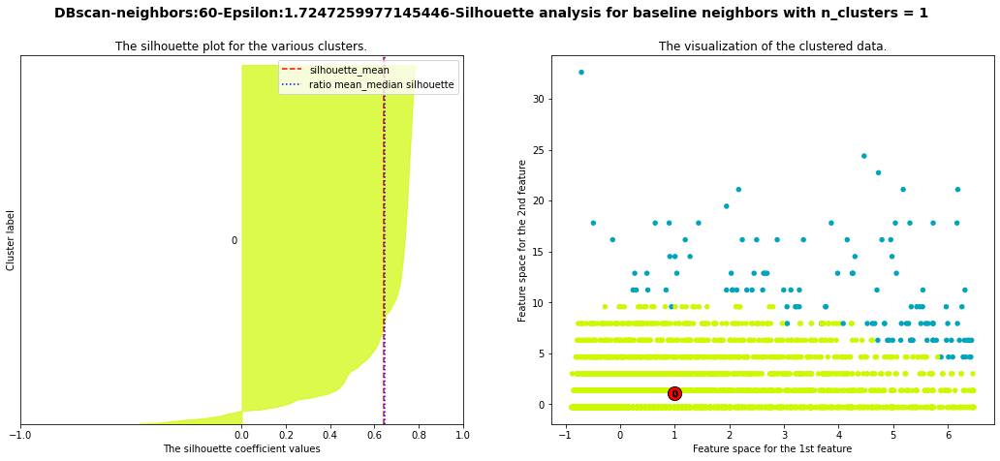

For n_clusters = 1 The average silhouette_score is : 0.6420265440816385
For n_clusters = 1 The Davies-Bouldin score is : 0.6869818811010504
For n_clusters = 1 The ratio mean/median silhouette is : 0.9909877160554328


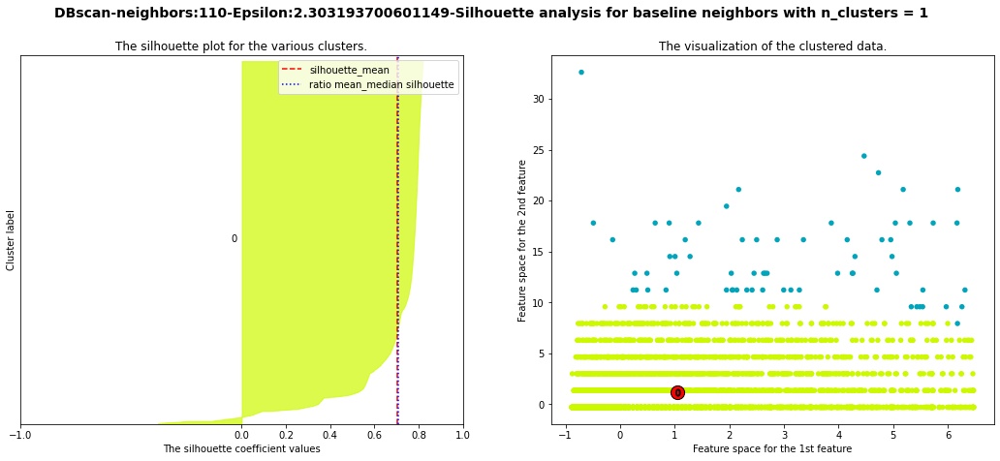

For n_clusters = 1 The average silhouette_score is : 0.704125744315188
For n_clusters = 1 The Davies-Bouldin score is : 0.5016351191120899
For n_clusters = 1 The ratio mean/median silhouette is : 0.9975790794523723


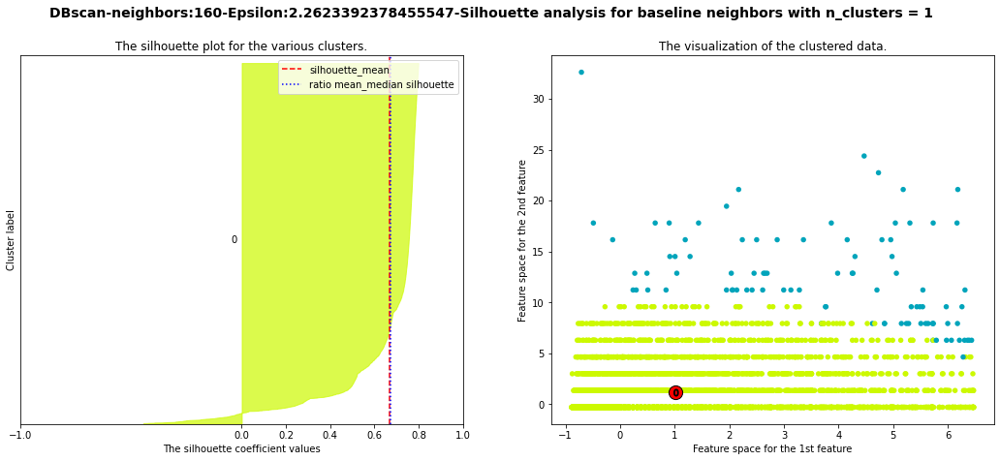

For n_clusters = 1 The average silhouette_score is : 0.6683763531428983
For n_clusters = 1 The Davies-Bouldin score is : 0.6191028713832499
For n_clusters = 1 The ratio mean/median silhouette is : 0.9938806121210733


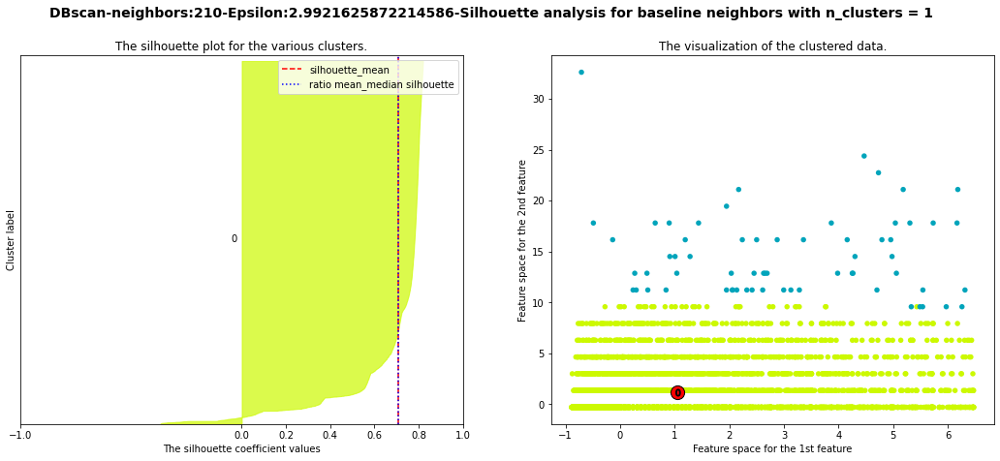

For n_clusters = 1 The average silhouette_score is : 0.70690006312814
For n_clusters = 1 The Davies-Bouldin score is : 0.49225103068939197
For n_clusters = 1 The ratio mean/median silhouette is : 0.9978342272796523


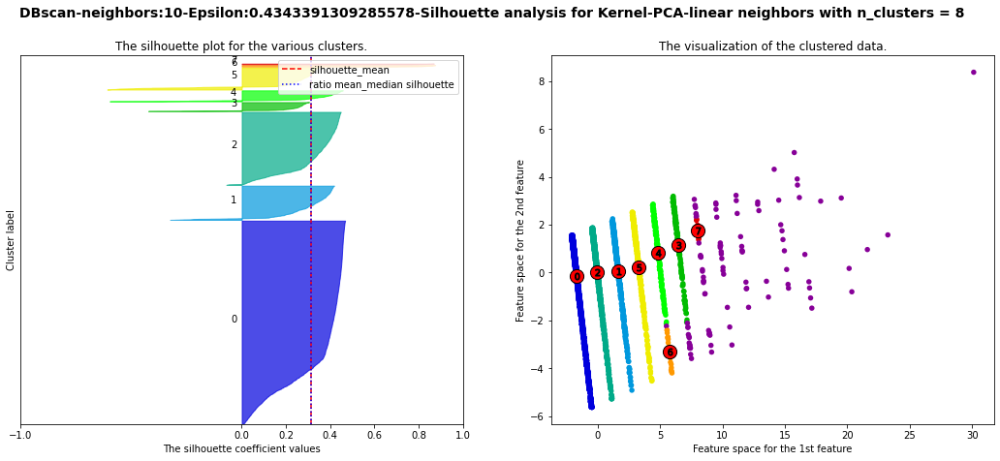

For n_clusters = 8 The average silhouette_score is : 0.31228649619541077
For n_clusters = 8 The Davies-Bouldin score is : 1.4051575459219334
For n_clusters = 8 The ratio mean/median silhouette is : 0.9960605811017091


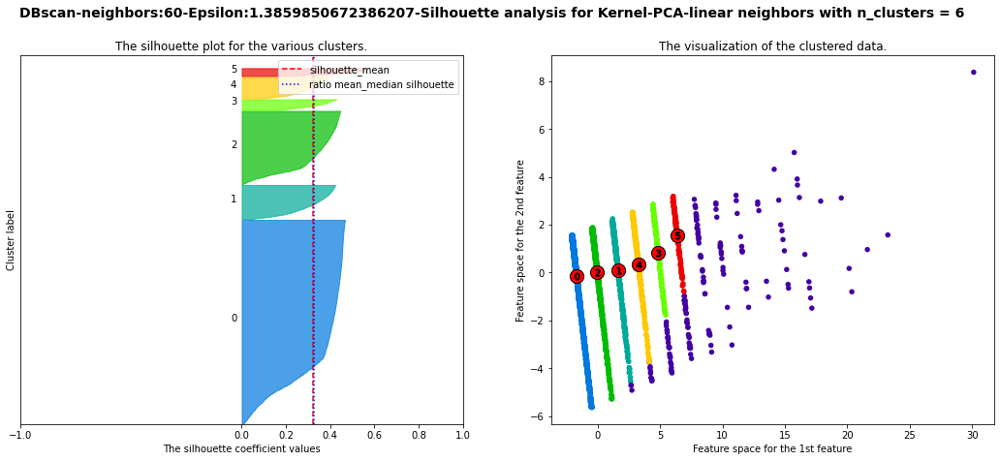

For n_clusters = 6 The average silhouette_score is : 0.32153577887025814
For n_clusters = 6 The Davies-Bouldin score is : 1.5229645482724536
For n_clusters = 6 The ratio mean/median silhouette is : 0.9855427285892738


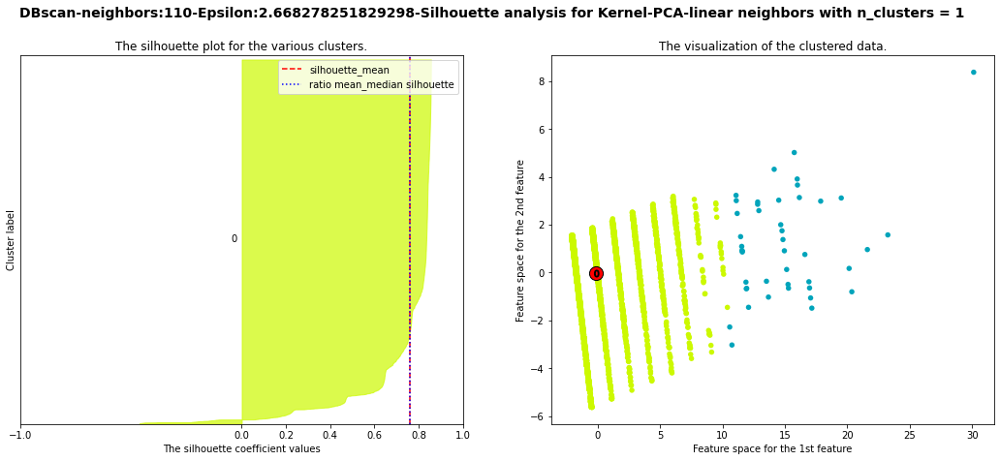

For n_clusters = 1 The average silhouette_score is : 0.7610686993768165
For n_clusters = 1 The Davies-Bouldin score is : 0.3957456201319471
For n_clusters = 1 The ratio mean/median silhouette is : 0.9988906591716357


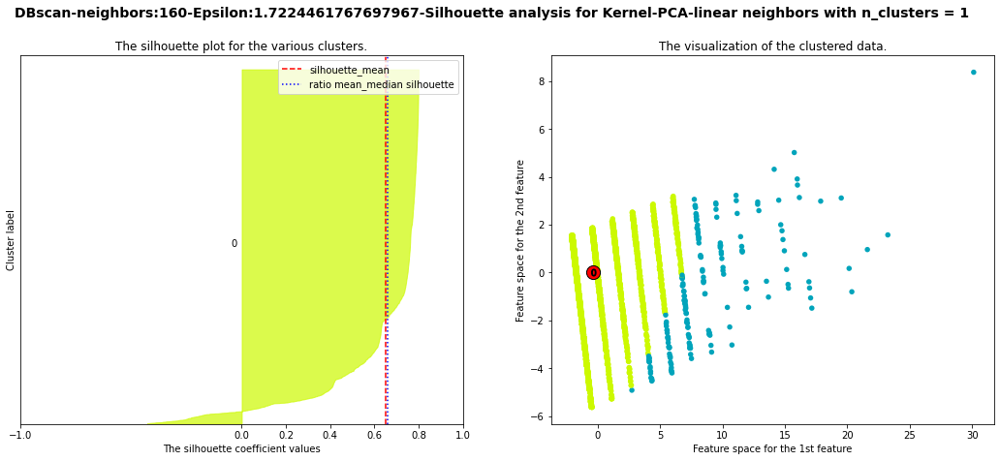

For n_clusters = 1 The average silhouette_score is : 0.6516682750584744
For n_clusters = 1 The Davies-Bouldin score is : 0.6610714050132233
For n_clusters = 1 The ratio mean/median silhouette is : 0.987602537445633


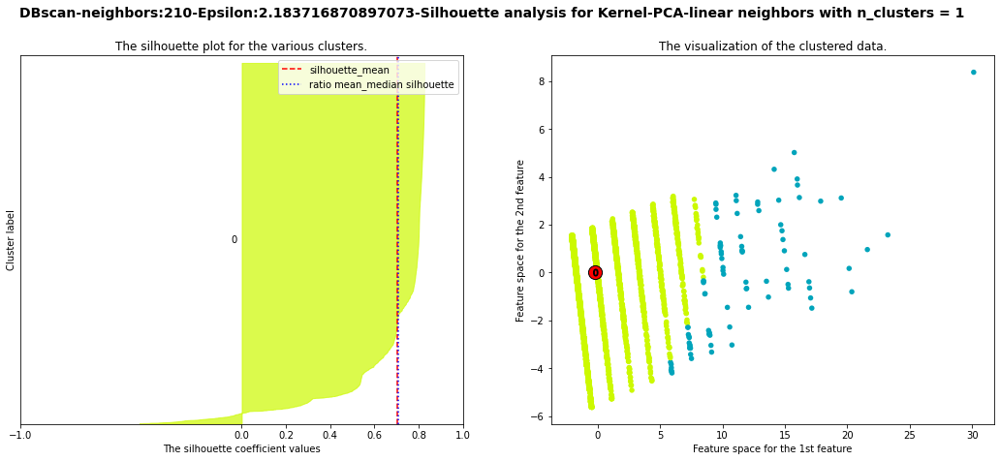

For n_clusters = 1 The average silhouette_score is : 0.7034790318733761
For n_clusters = 1 The Davies-Bouldin score is : 0.5643135204595496
For n_clusters = 1 The ratio mean/median silhouette is : 0.9944255476646858


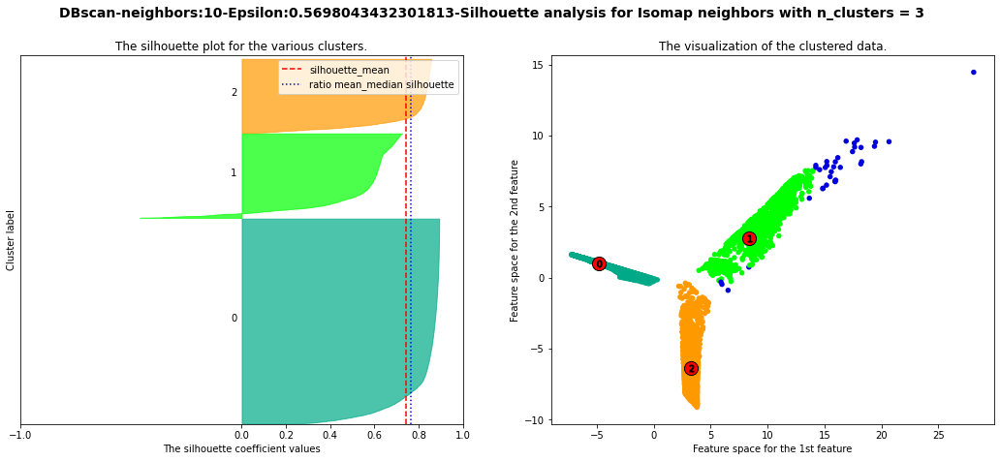

For n_clusters = 3 The average silhouette_score is : 0.7424712611441074
For n_clusters = 3 The Davies-Bouldin score is : 0.5267416293354378
For n_clusters = 3 The ratio mean/median silhouette is : 0.9722328635753196


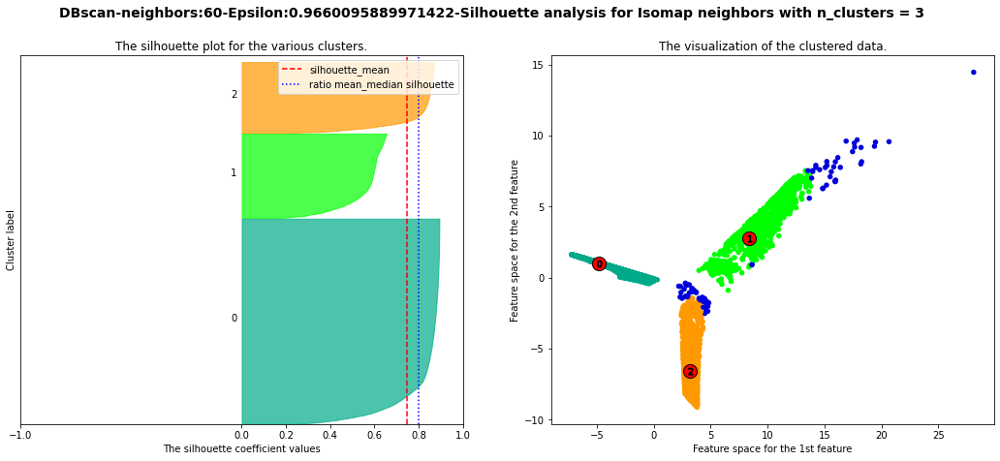

For n_clusters = 3 The average silhouette_score is : 0.7455743259985212
For n_clusters = 3 The Davies-Bouldin score is : 4.407172513823701
For n_clusters = 3 The ratio mean/median silhouette is : 0.9330565273009861


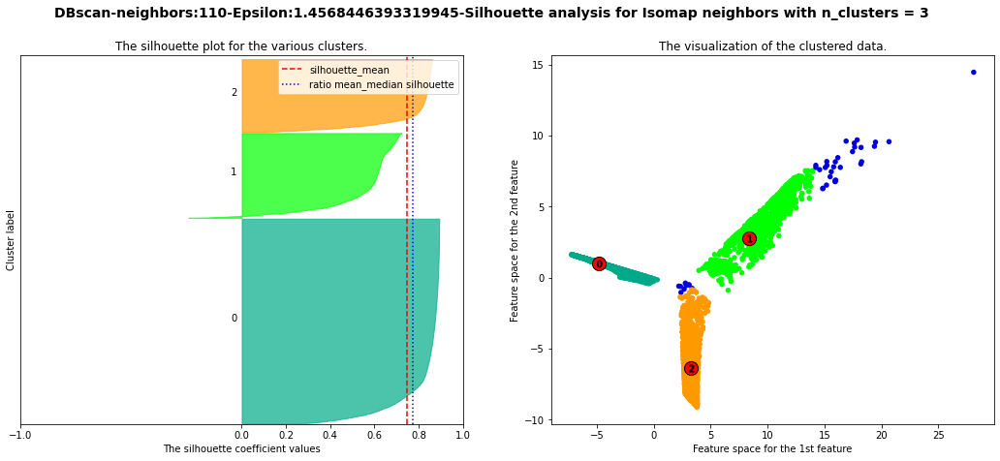

For n_clusters = 3 The average silhouette_score is : 0.7488039927985878
For n_clusters = 3 The Davies-Bouldin score is : 0.8832686824646686
For n_clusters = 3 The ratio mean/median silhouette is : 0.9699583157436141


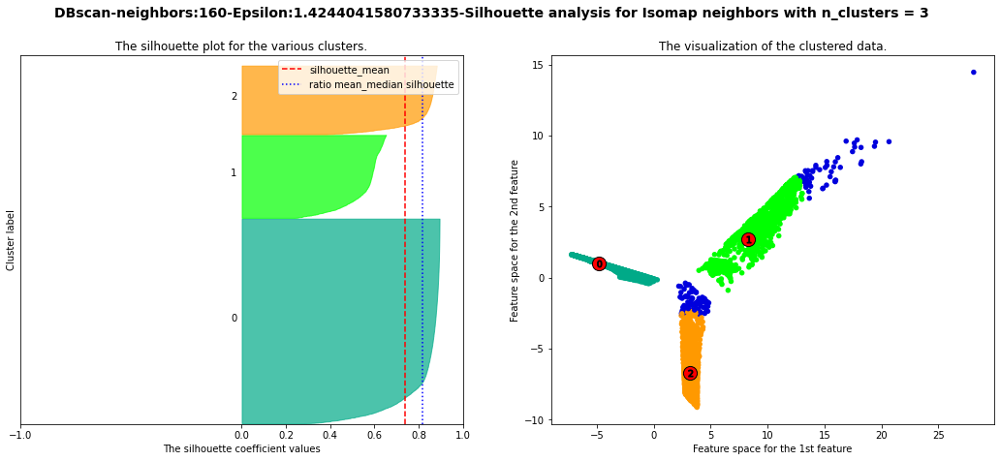

For n_clusters = 3 The average silhouette_score is : 0.7402482894415531
For n_clusters = 3 The Davies-Bouldin score is : 8.95249443175294
For n_clusters = 3 The ratio mean/median silhouette is : 0.9044769203628811


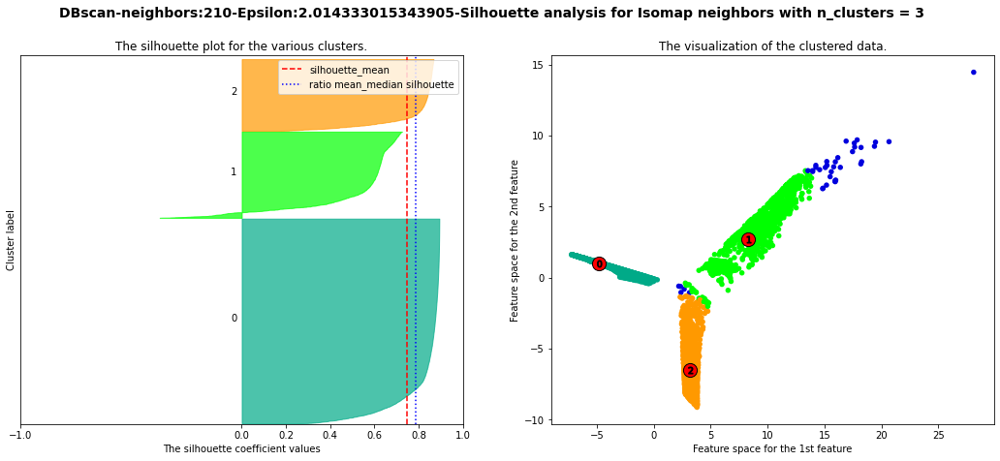

For n_clusters = 3 The average silhouette_score is : 0.7453965216529492
For n_clusters = 3 The Davies-Bouldin score is : 0.6114907126013767
For n_clusters = 3 The ratio mean/median silhouette is : 0.9474136150605331


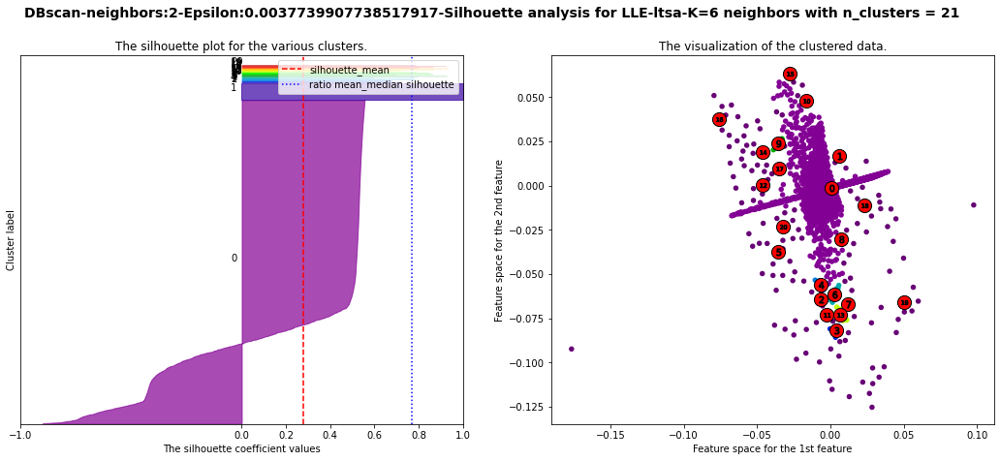

For n_clusters = 21 The average silhouette_score is : 0.27871899925647164
For n_clusters = 21 The Davies-Bouldin score is : 1.5523832255596088
For n_clusters = 21 The ratio mean/median silhouette is : 0.36316938494473355


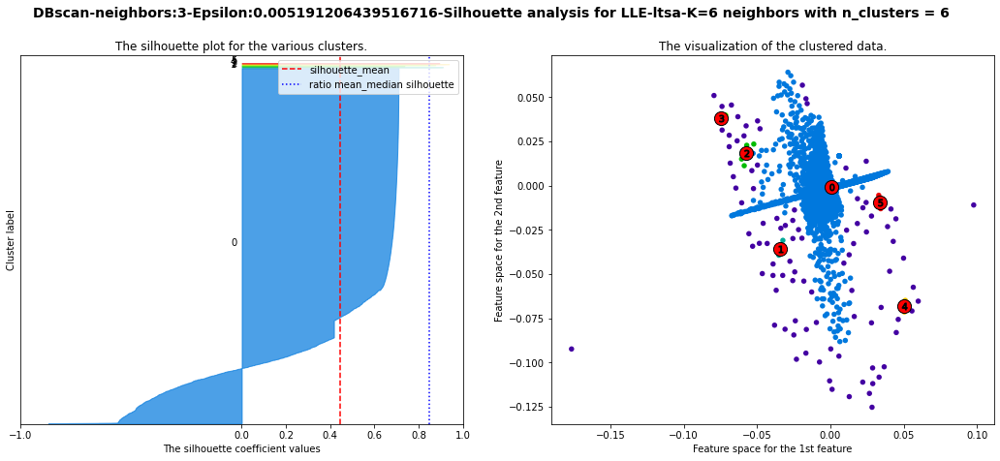

For n_clusters = 6 The average silhouette_score is : 0.4425923646329551
For n_clusters = 6 The Davies-Bouldin score is : 1.5618239030373267
For n_clusters = 6 The ratio mean/median silhouette is : 0.5225115900673781


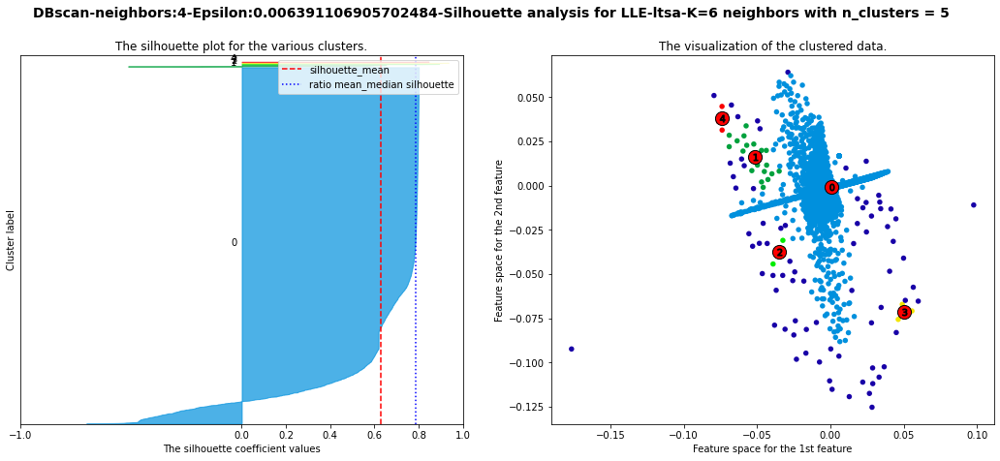

For n_clusters = 5 The average silhouette_score is : 0.6289778743717253
For n_clusters = 5 The Davies-Bouldin score is : 1.395094716096601
For n_clusters = 5 The ratio mean/median silhouette is : 0.801255482229587


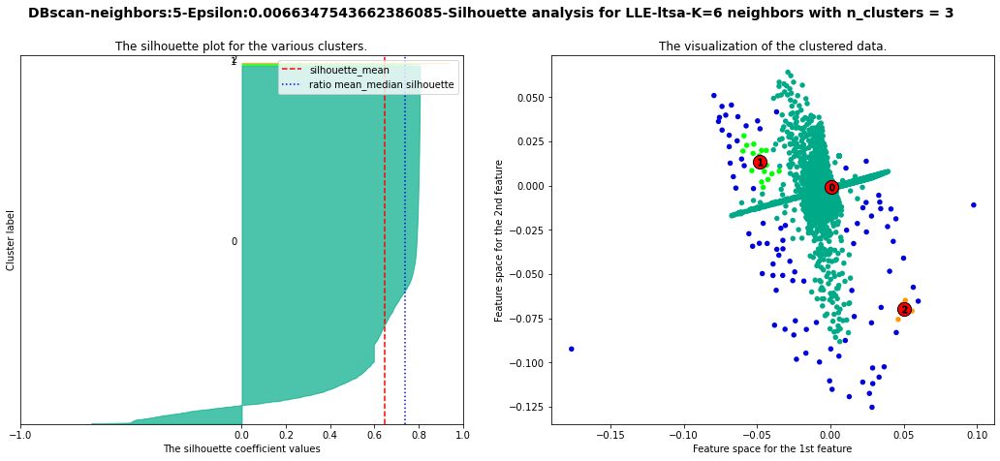

For n_clusters = 3 The average silhouette_score is : 0.644433599951189
For n_clusters = 3 The Davies-Bouldin score is : 1.401968244670531
For n_clusters = 3 The ratio mean/median silhouette is : 0.8731637025912775


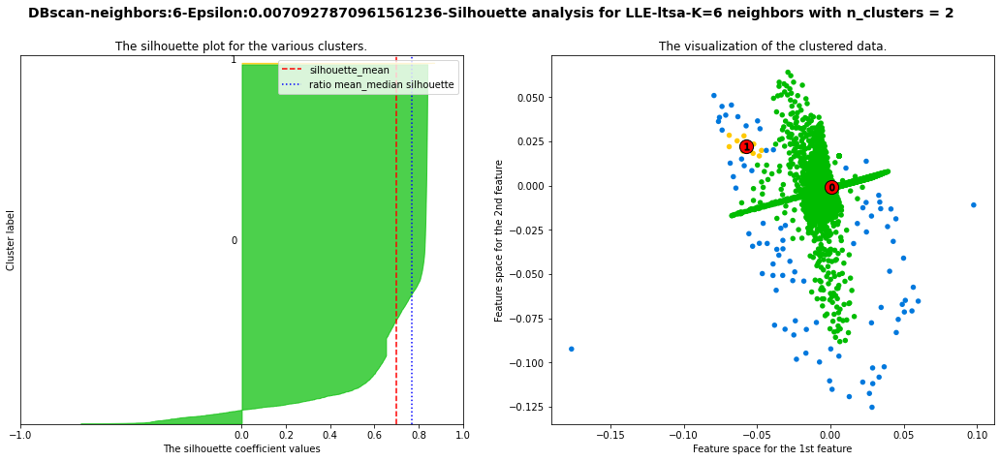

For n_clusters = 2 The average silhouette_score is : 0.6967495294054205
For n_clusters = 2 The Davies-Bouldin score is : 1.4764612916980784
For n_clusters = 2 The ratio mean/median silhouette is : 0.9059861463420198


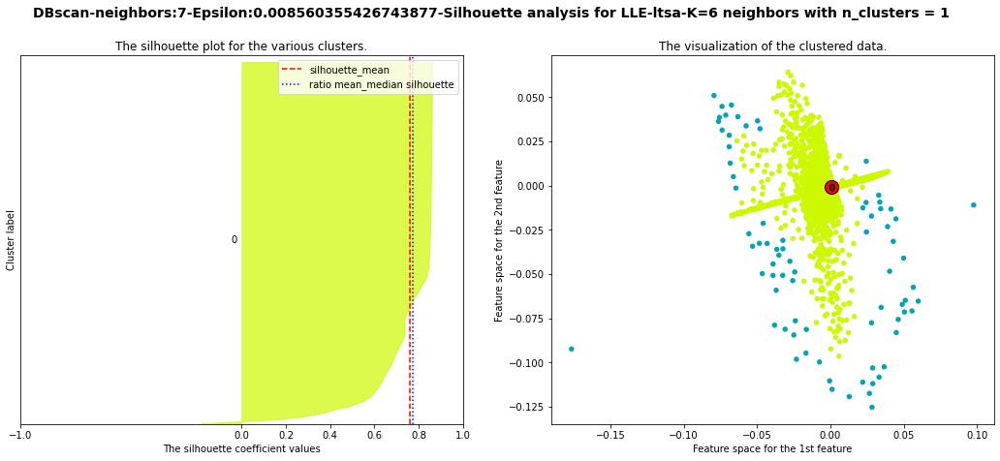

For n_clusters = 1 The average silhouette_score is : 0.7588405990122921
For n_clusters = 1 The Davies-Bouldin score is : 1.8137891686043568
For n_clusters = 1 The ratio mean/median silhouette is : 0.9820576328690861


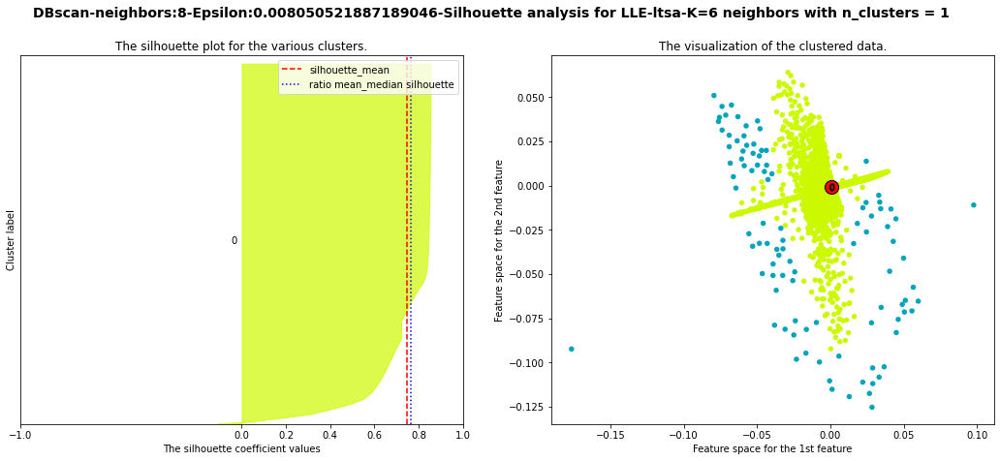

For n_clusters = 1 The average silhouette_score is : 0.7462603445019855
For n_clusters = 1 The Davies-Bouldin score is : 2.073661172714998
For n_clusters = 1 The ratio mean/median silhouette is : 0.9762465411336518


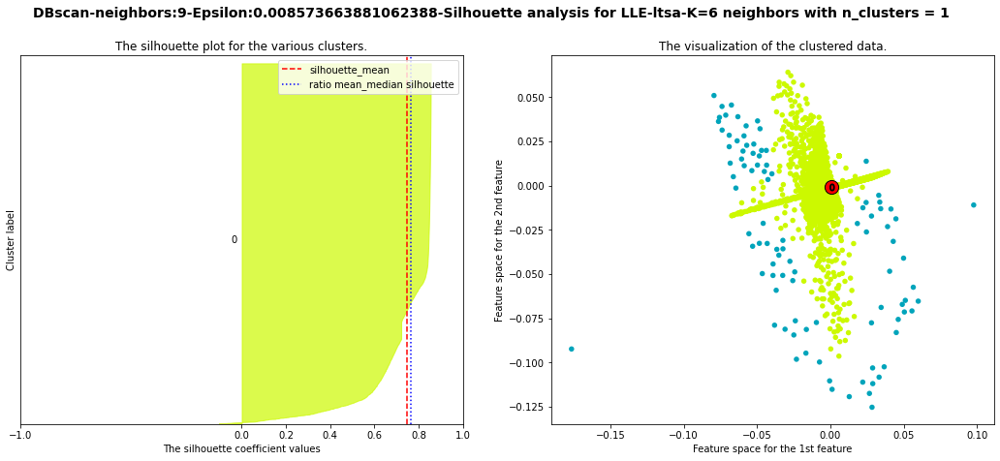

For n_clusters = 1 The average silhouette_score is : 0.7473271854421414
For n_clusters = 1 The Davies-Bouldin score is : 2.114660804736461
For n_clusters = 1 The ratio mean/median silhouette is : 0.9769385946308444


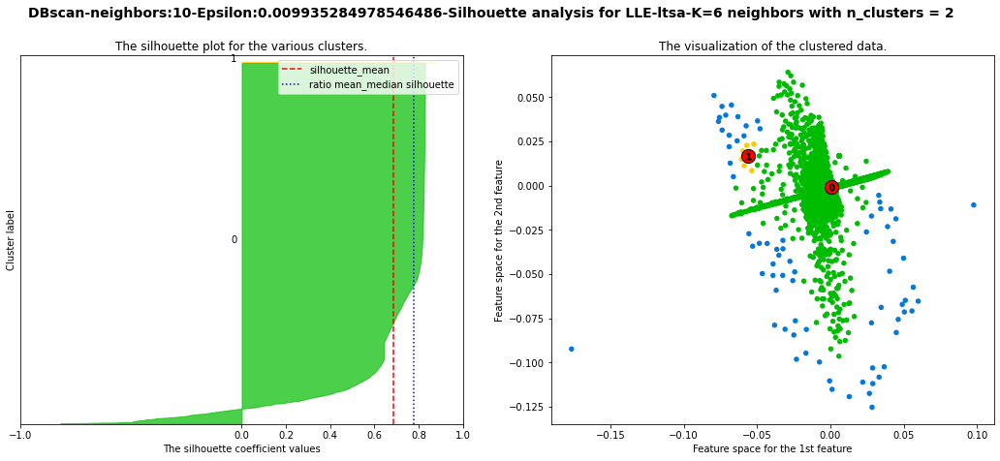

For n_clusters = 2 The average silhouette_score is : 0.6857059653191876
For n_clusters = 2 The Davies-Bouldin score is : 1.5232969147746276
For n_clusters = 2 The ratio mean/median silhouette is : 0.881840473012981


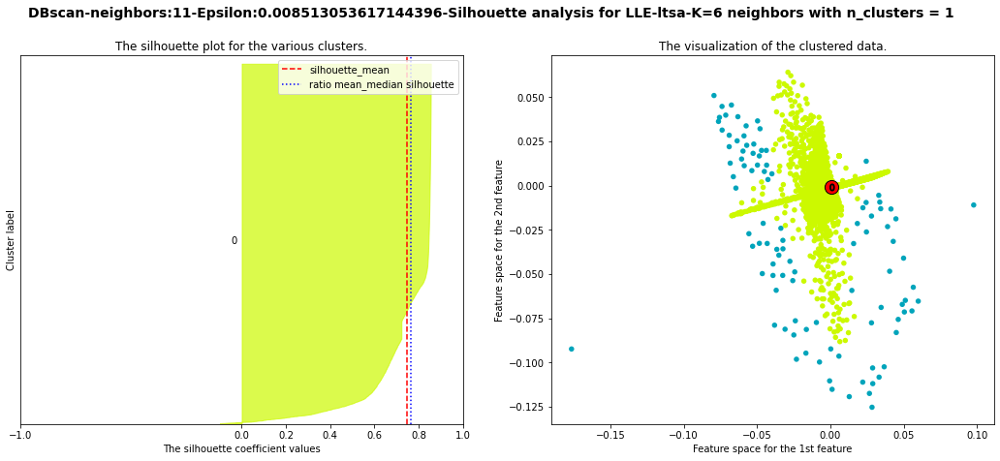

For n_clusters = 1 The average silhouette_score is : 0.7468763641369408
For n_clusters = 1 The Davies-Bouldin score is : 2.036110282912053
For n_clusters = 1 The ratio mean/median silhouette is : 0.9758768139268733


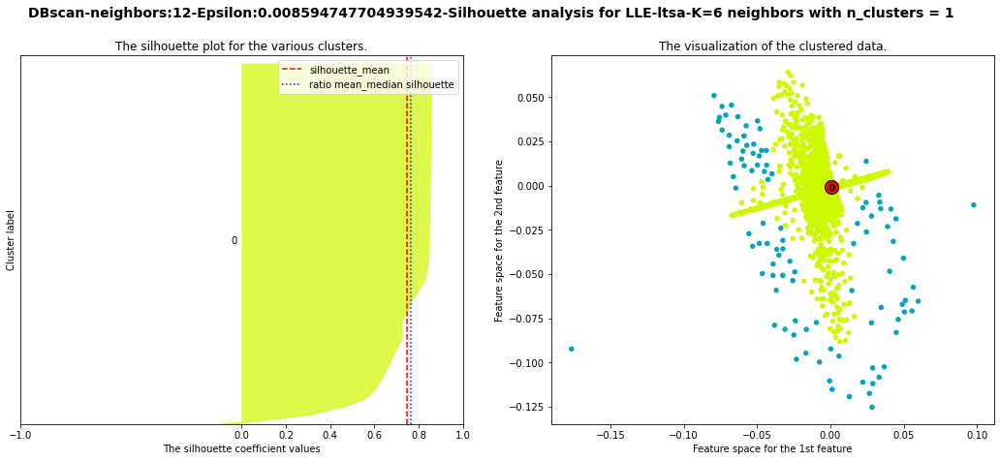

For n_clusters = 1 The average silhouette_score is : 0.7468763641369408
For n_clusters = 1 The Davies-Bouldin score is : 2.036110282912053
For n_clusters = 1 The ratio mean/median silhouette is : 0.9758768139268733


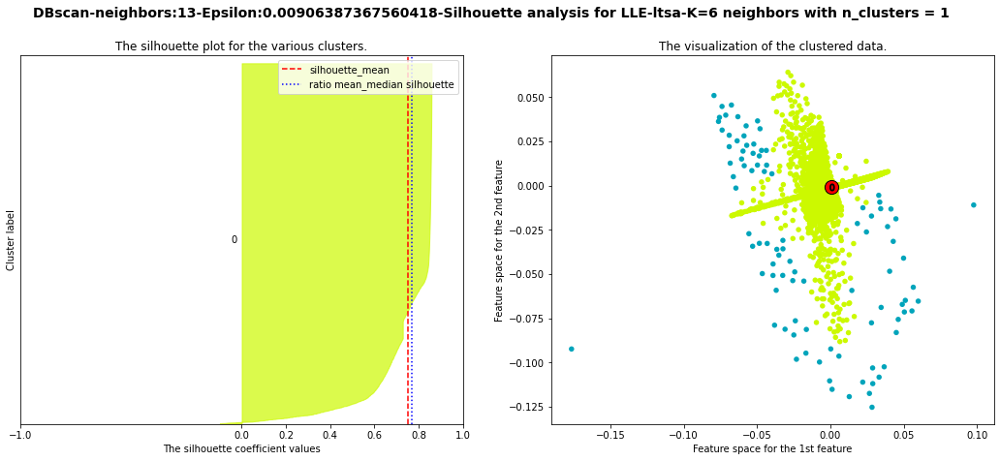

For n_clusters = 1 The average silhouette_score is : 0.7526272032425015
For n_clusters = 1 The Davies-Bouldin score is : 2.0041096766240245
For n_clusters = 1 The ratio mean/median silhouette is : 0.9775860182913175


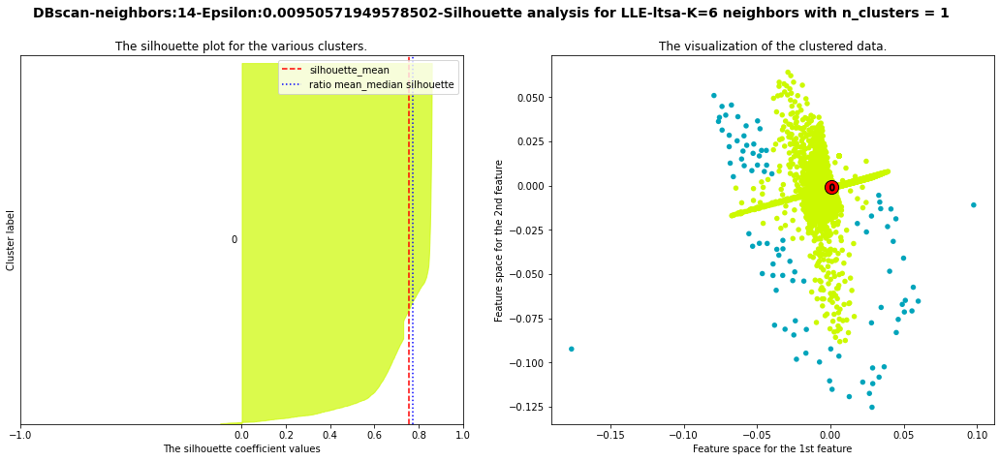

For n_clusters = 1 The average silhouette_score is : 0.7546851871300809
For n_clusters = 1 The Davies-Bouldin score is : 1.9983222085190948
For n_clusters = 1 The ratio mean/median silhouette is : 0.9783610814789921


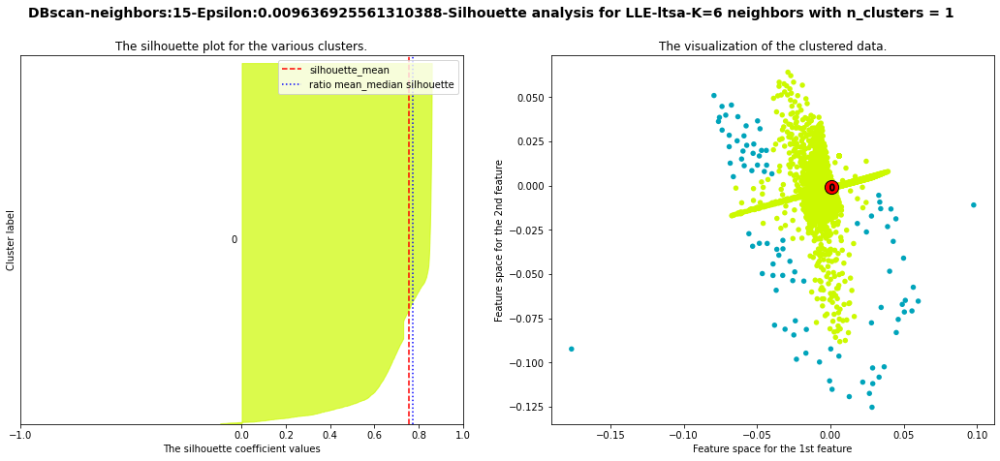

For n_clusters = 1 The average silhouette_score is : 0.7546851871300809
For n_clusters = 1 The Davies-Bouldin score is : 1.9983222085190948
For n_clusters = 1 The ratio mean/median silhouette is : 0.9783610814789921


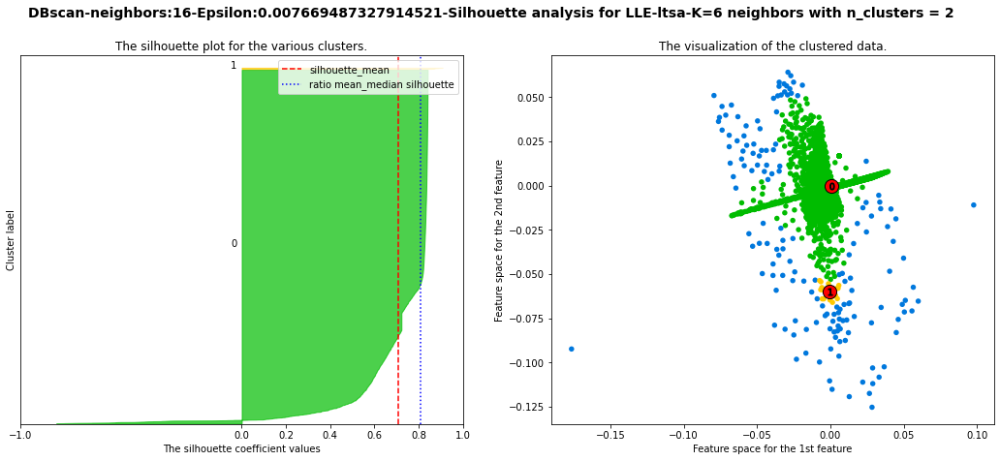

For n_clusters = 2 The average silhouette_score is : 0.7055961604773152
For n_clusters = 2 The Davies-Bouldin score is : 2.0925039087992436
For n_clusters = 2 The ratio mean/median silhouette is : 0.873860981841845


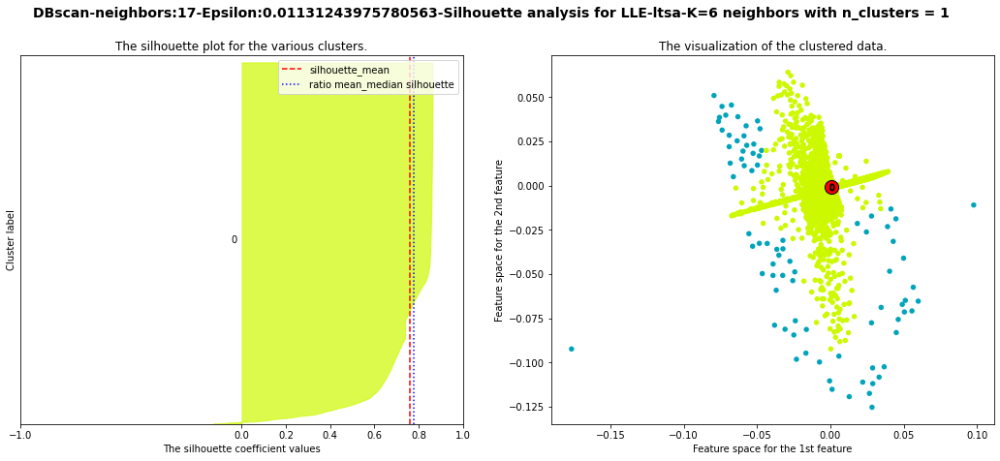

For n_clusters = 1 The average silhouette_score is : 0.762259489926419
For n_clusters = 1 The Davies-Bouldin score is : 1.9186769050771793
For n_clusters = 1 The ratio mean/median silhouette is : 0.9808369173957852


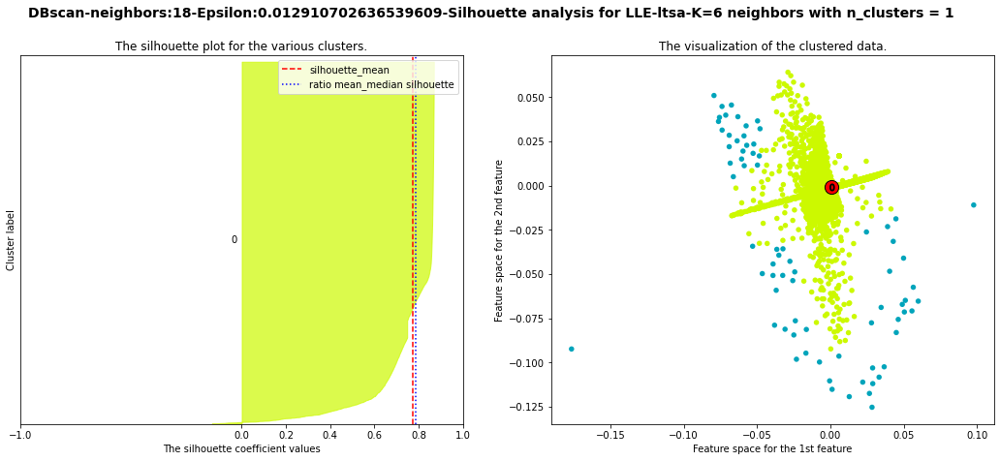

For n_clusters = 1 The average silhouette_score is : 0.7713378154939297
For n_clusters = 1 The Davies-Bouldin score is : 1.897491819484138
For n_clusters = 1 The ratio mean/median silhouette is : 0.9831908381644838


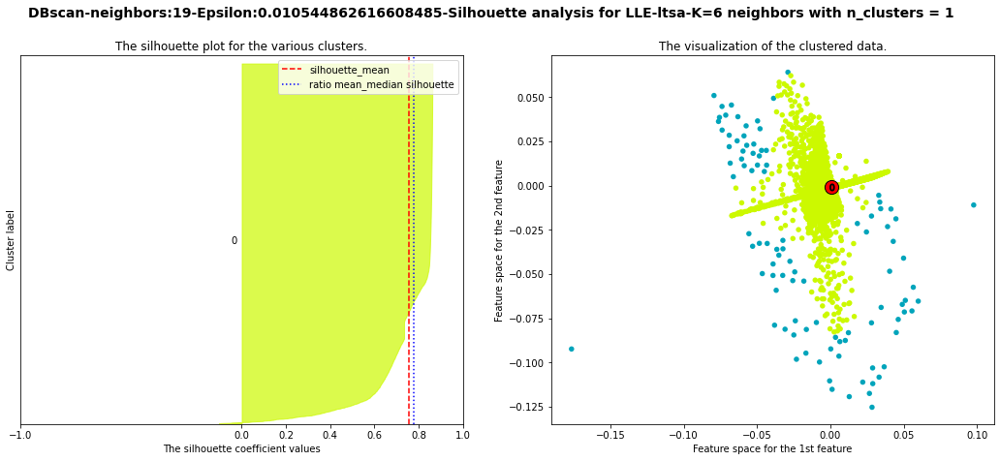

For n_clusters = 1 The average silhouette_score is : 0.7579556444481409
For n_clusters = 1 The Davies-Bouldin score is : 1.9727705458588483
For n_clusters = 1 The ratio mean/median silhouette is : 0.9771952465158374


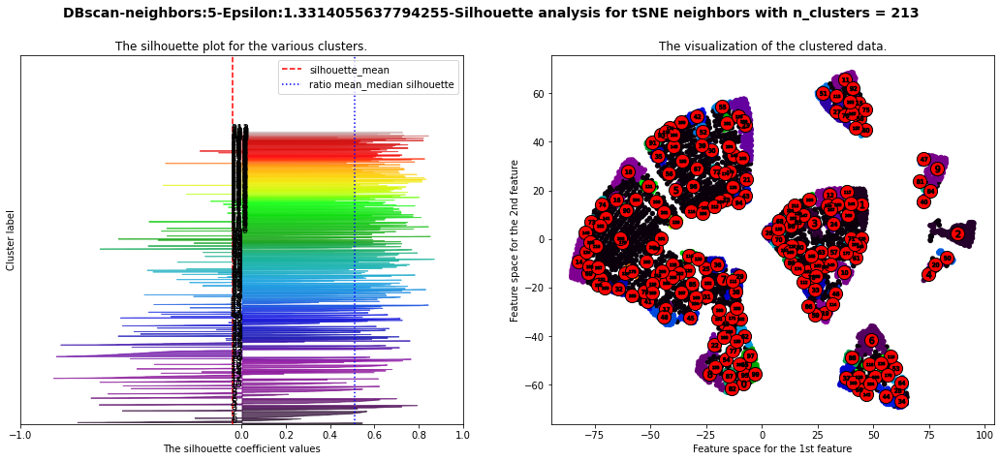

For n_clusters = 213 The average silhouette_score is : -0.042382177
For n_clusters = 213 The Davies-Bouldin score is : 1.2612368441079833
For n_clusters = 213 The ratio mean/median silhouette is : -0.08329196


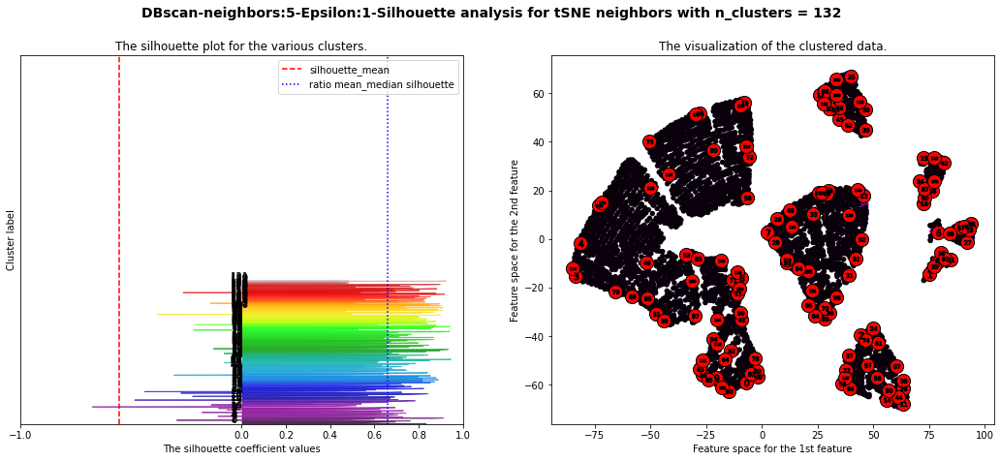

For n_clusters = 132 The average silhouette_score is : -0.5527091
For n_clusters = 132 The Davies-Bouldin score is : 1.110366167473859
For n_clusters = 132 The ratio mean/median silhouette is : -0.8403785388325661


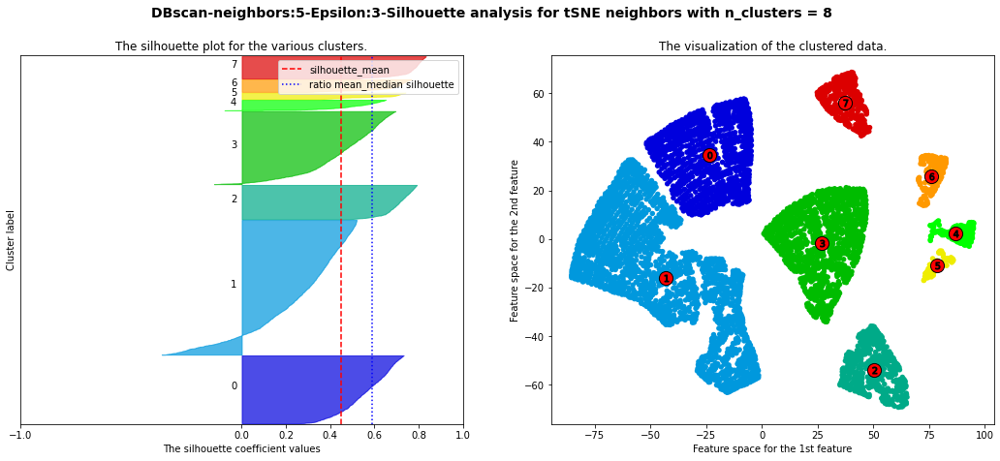

For n_clusters = 8 The average silhouette_score is : 0.45093495
For n_clusters = 8 The Davies-Bouldin score is : 0.647535647643091
For n_clusters = 8 The ratio mean/median silhouette is : 0.7664648813025084


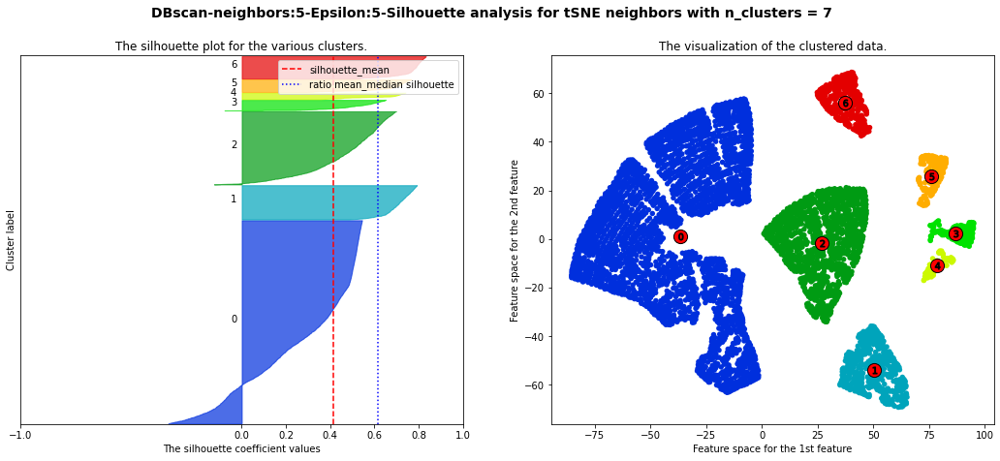

For n_clusters = 7 The average silhouette_score is : 0.4119308
For n_clusters = 7 The Davies-Bouldin score is : 0.6411173400642577
For n_clusters = 7 The ratio mean/median silhouette is : 0.66867334


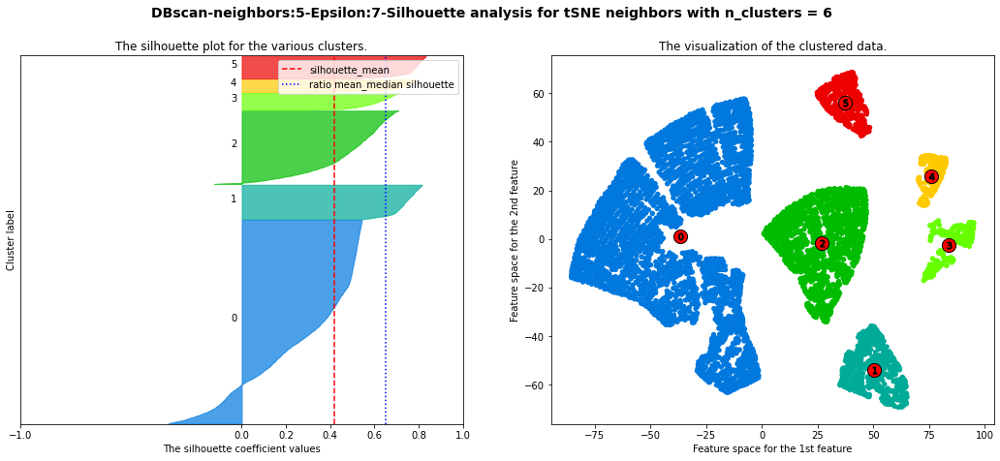

For n_clusters = 6 The average silhouette_score is : 0.42030108
For n_clusters = 6 The Davies-Bouldin score is : 0.6150815897509038
For n_clusters = 6 The ratio mean/median silhouette is : 0.6451068182150855


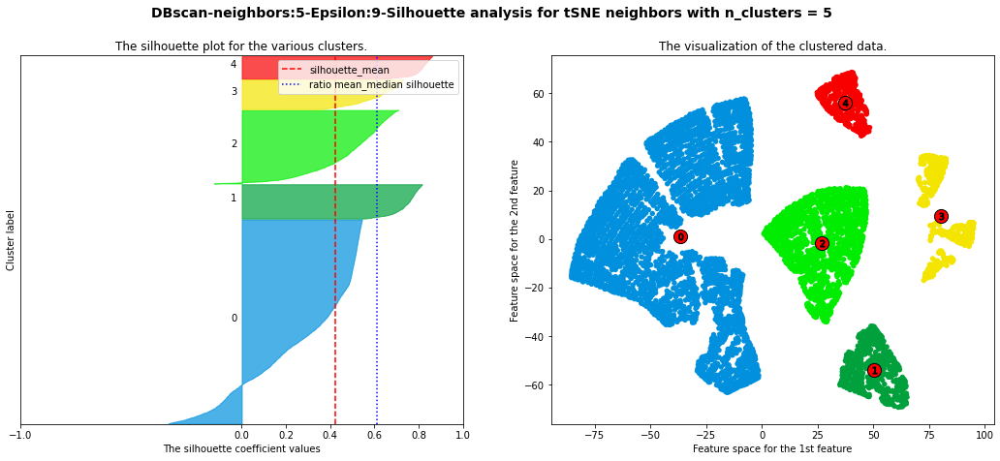

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


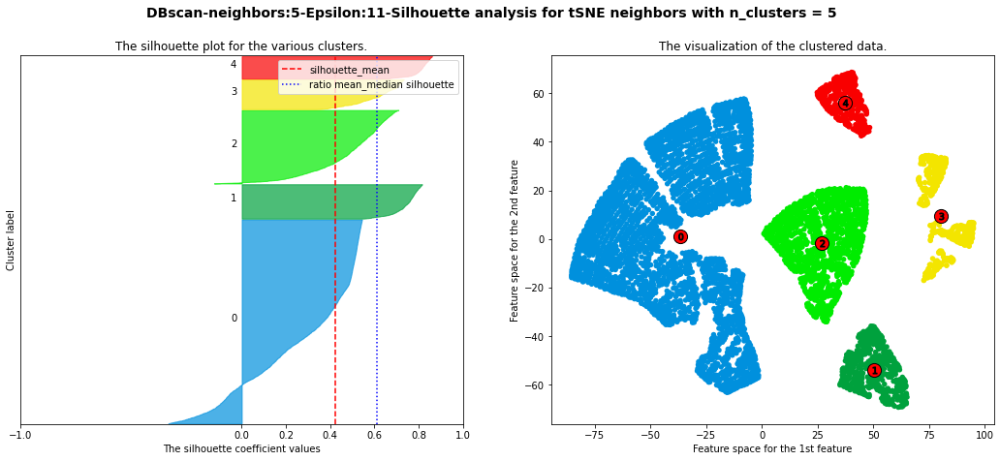

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


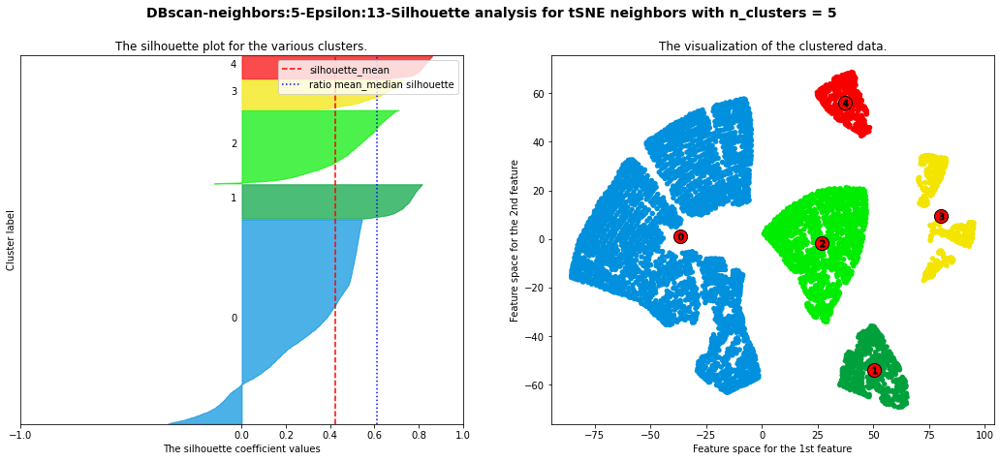

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


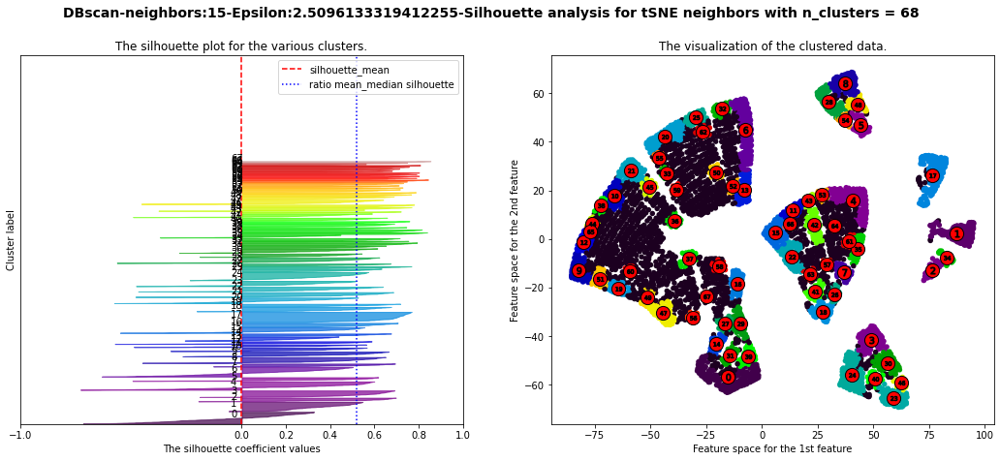

For n_clusters = 68 The average silhouette_score is : -0.004170847
For n_clusters = 68 The Davies-Bouldin score is : 1.0765915640647994
For n_clusters = 68 The ratio mean/median silhouette is : -0.008036422387507066


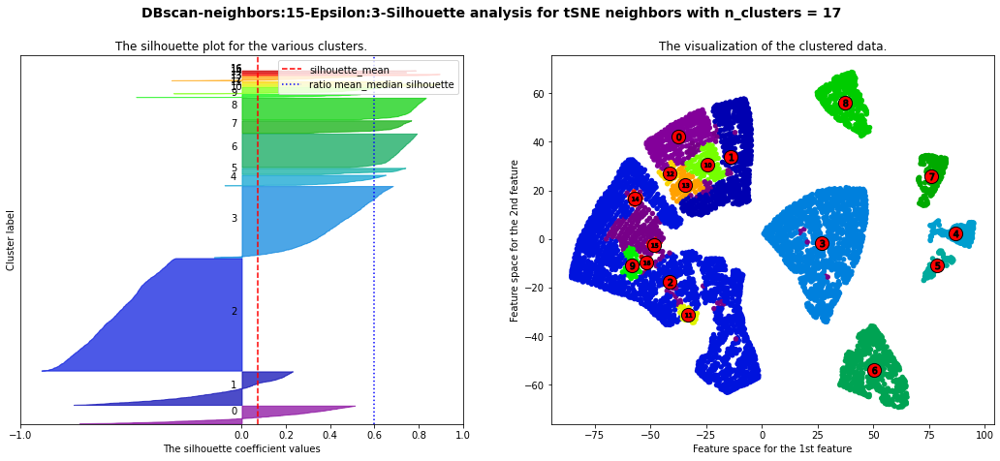

For n_clusters = 17 The average silhouette_score is : 0.07057754
For n_clusters = 17 The Davies-Bouldin score is : 1.4625472644552404
For n_clusters = 17 The ratio mean/median silhouette is : 0.11793064


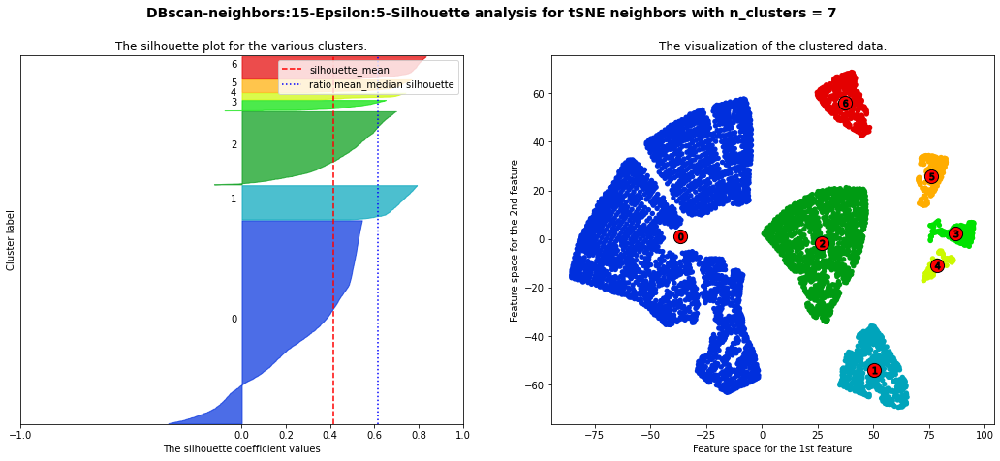

For n_clusters = 7 The average silhouette_score is : 0.4119308
For n_clusters = 7 The Davies-Bouldin score is : 0.6411173400642577
For n_clusters = 7 The ratio mean/median silhouette is : 0.66867334


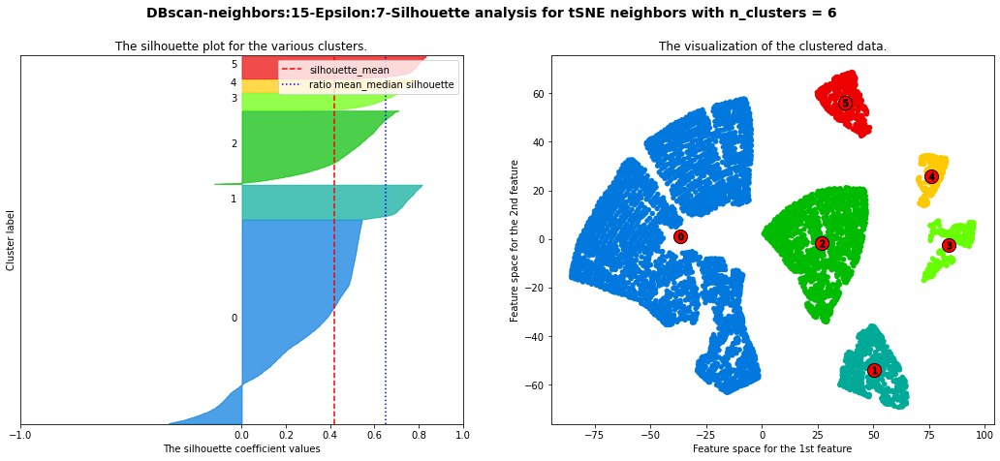

For n_clusters = 6 The average silhouette_score is : 0.42030108
For n_clusters = 6 The Davies-Bouldin score is : 0.6150815897509038
For n_clusters = 6 The ratio mean/median silhouette is : 0.6451068182150855


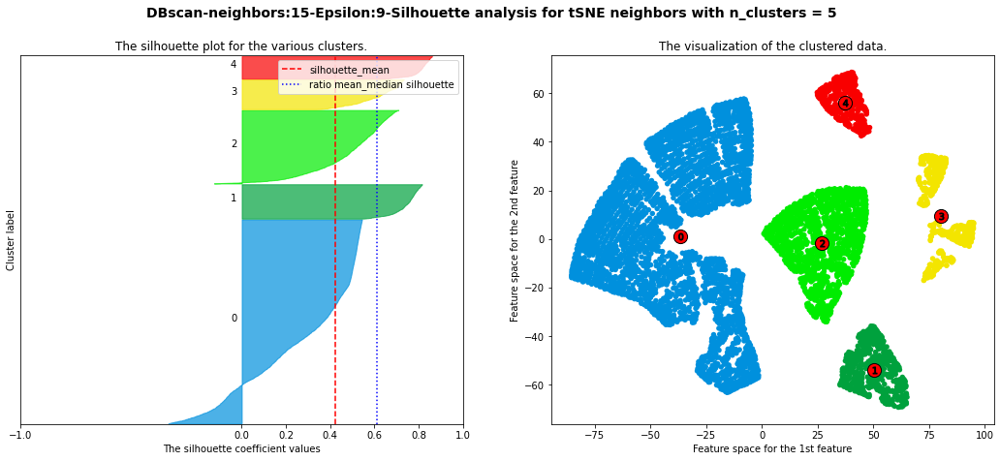

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


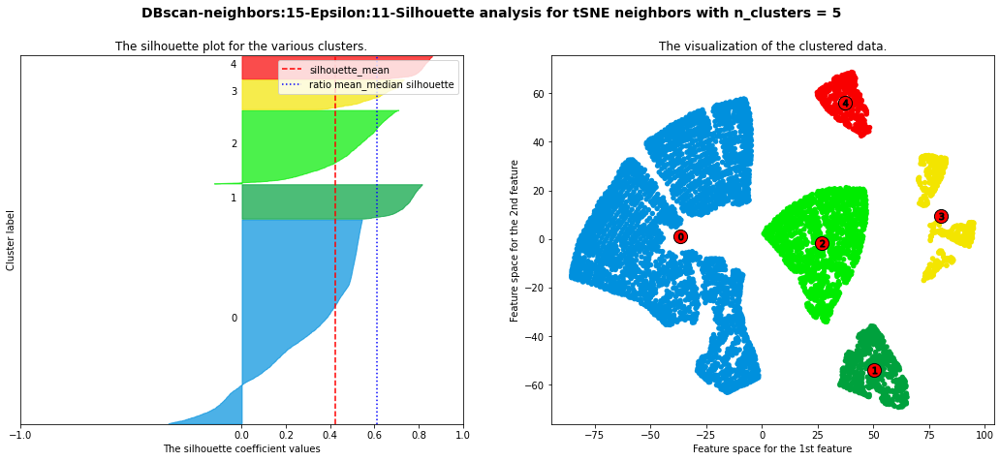

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


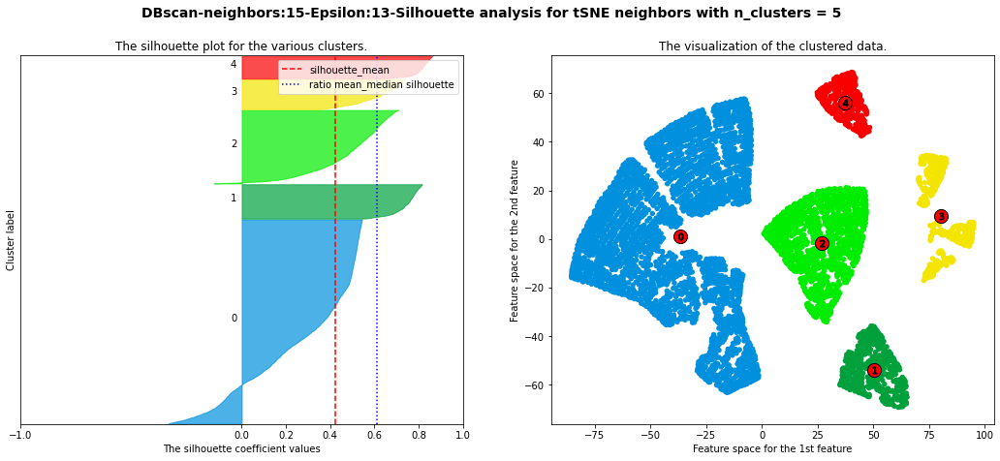

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


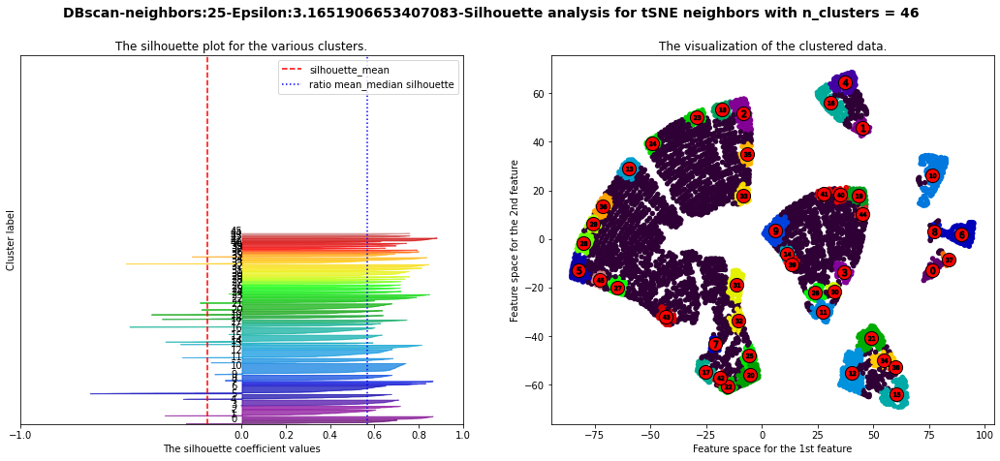

For n_clusters = 46 The average silhouette_score is : -0.15662149
For n_clusters = 46 The Davies-Bouldin score is : 0.9460401488940913
For n_clusters = 46 The ratio mean/median silhouette is : -0.2764691146140976


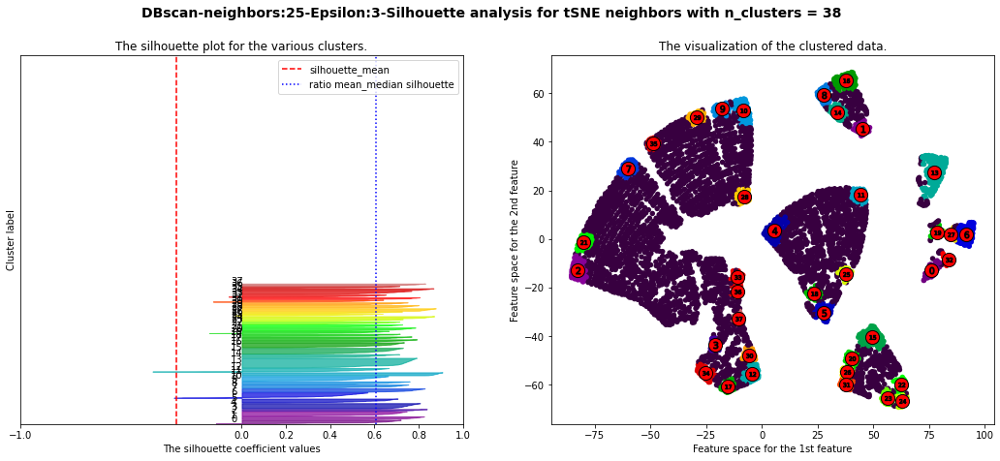

For n_clusters = 38 The average silhouette_score is : -0.29438227
For n_clusters = 38 The Davies-Bouldin score is : 1.030384933195127
For n_clusters = 38 The ratio mean/median silhouette is : -0.48386068099444046


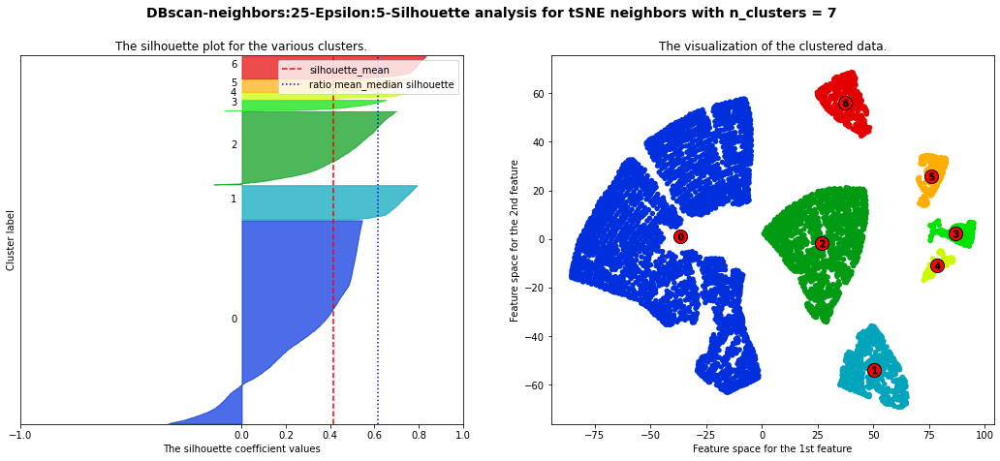

For n_clusters = 7 The average silhouette_score is : 0.4119308
For n_clusters = 7 The Davies-Bouldin score is : 0.6411173400642577
For n_clusters = 7 The ratio mean/median silhouette is : 0.66867334


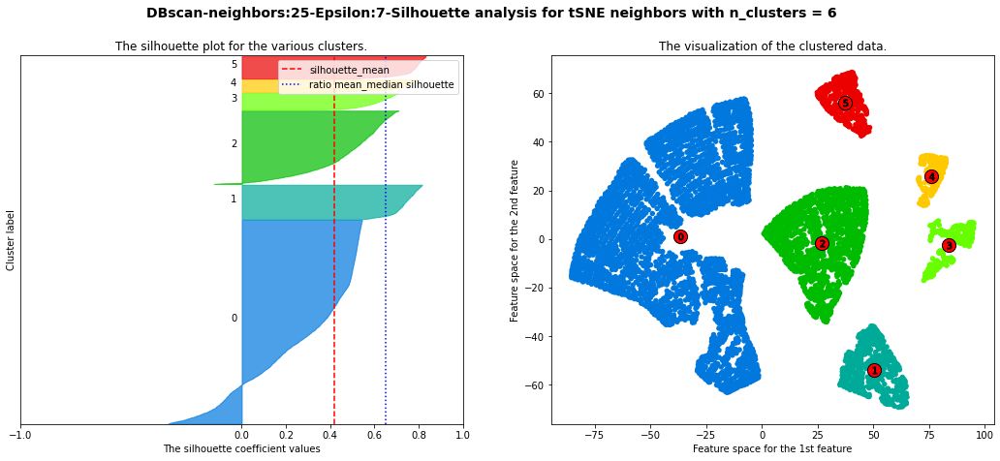

For n_clusters = 6 The average silhouette_score is : 0.42030108
For n_clusters = 6 The Davies-Bouldin score is : 0.6150815897509038
For n_clusters = 6 The ratio mean/median silhouette is : 0.6451068182150855


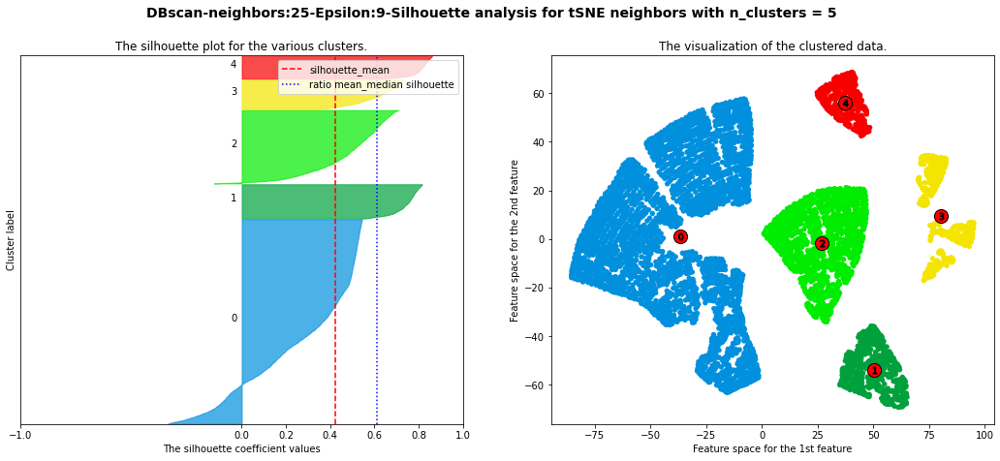

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


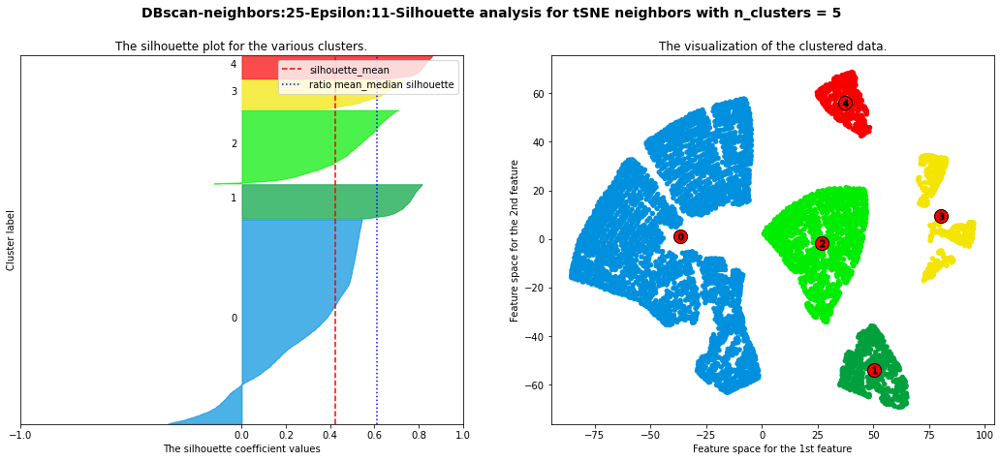

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


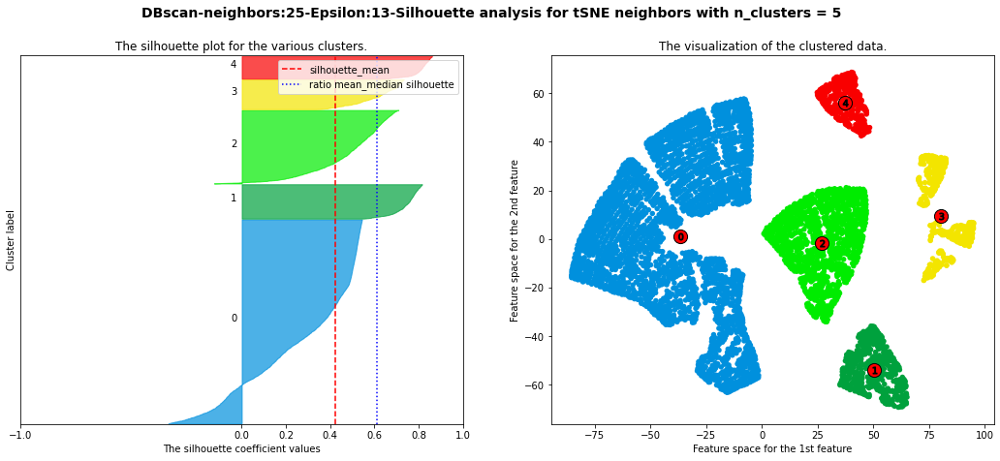

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


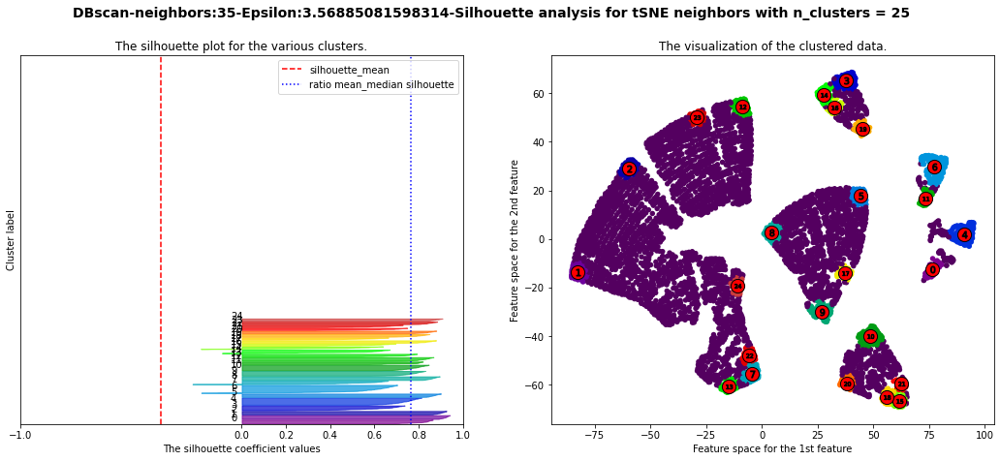

For n_clusters = 25 The average silhouette_score is : -0.36440736
For n_clusters = 25 The Davies-Bouldin score is : 0.9982358547404403
For n_clusters = 25 The ratio mean/median silhouette is : -0.47770792


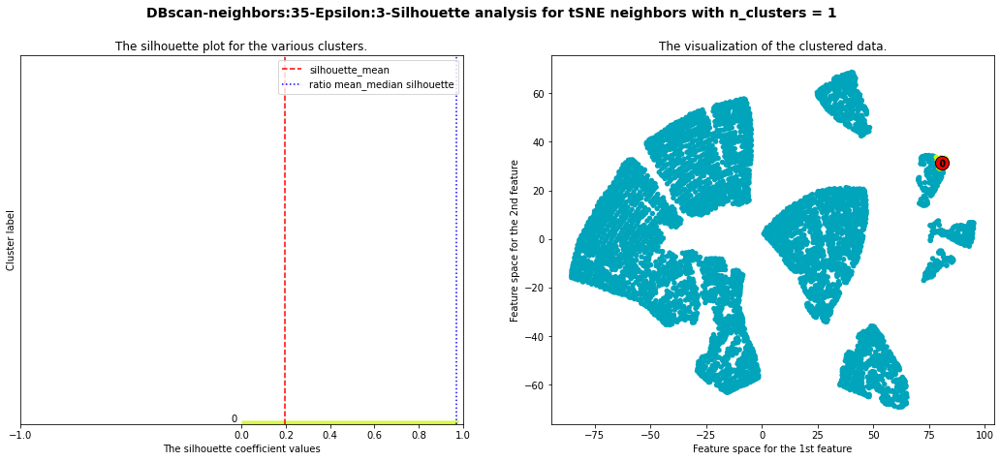

For n_clusters = 1 The average silhouette_score is : 0.19565262
For n_clusters = 1 The Davies-Bouldin score is : 0.6107084708299915
For n_clusters = 1 The ratio mean/median silhouette is : 0.20122623


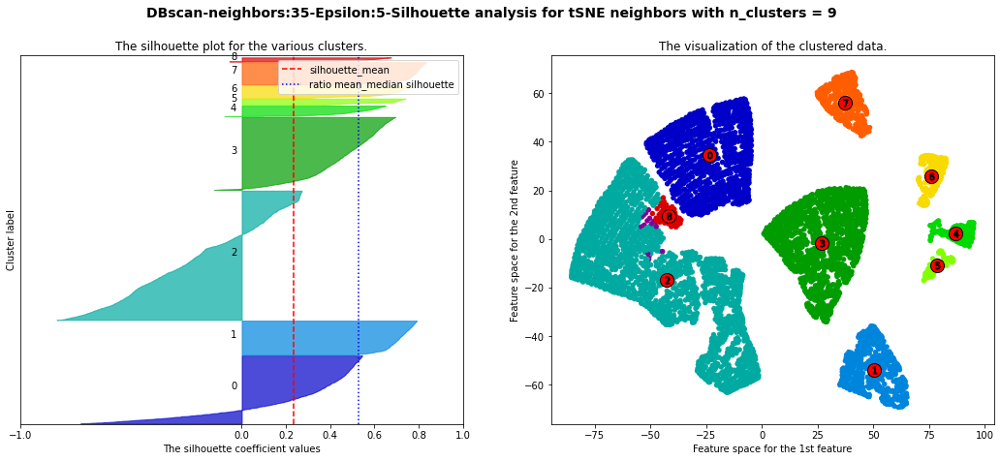

For n_clusters = 9 The average silhouette_score is : 0.23443843
For n_clusters = 9 The Davies-Bouldin score is : 0.885860001850412
For n_clusters = 9 The ratio mean/median silhouette is : 0.44277874


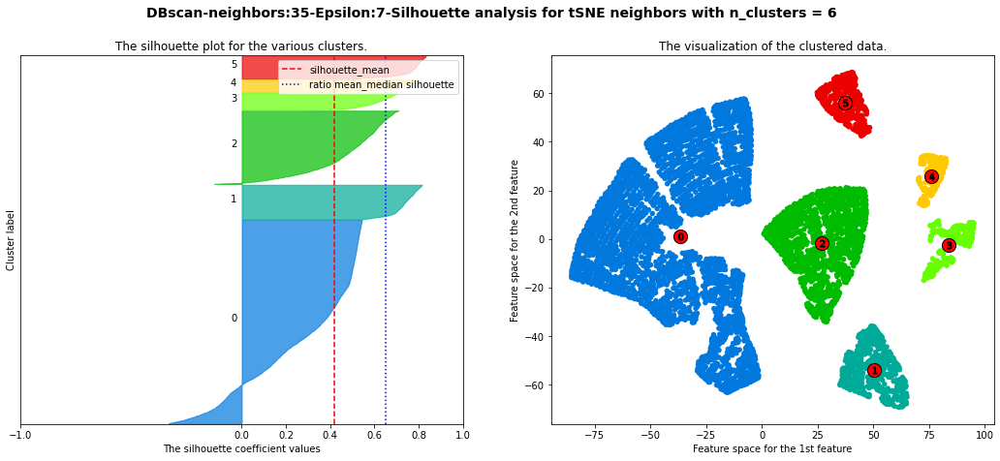

For n_clusters = 6 The average silhouette_score is : 0.42030108
For n_clusters = 6 The Davies-Bouldin score is : 0.6150815897509038
For n_clusters = 6 The ratio mean/median silhouette is : 0.6451068182150855


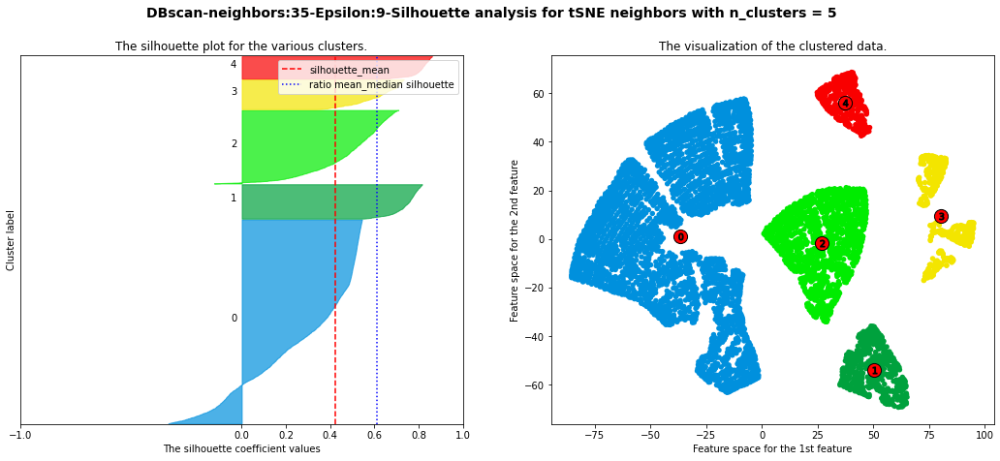

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


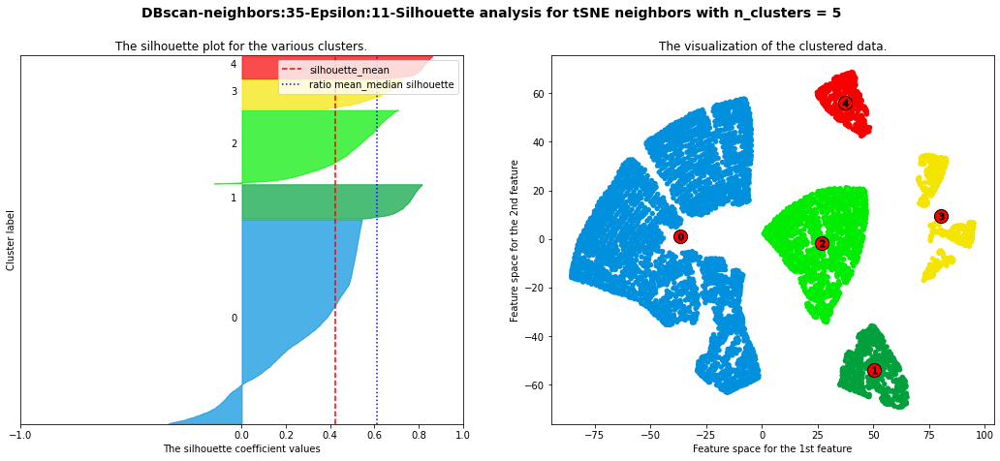

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


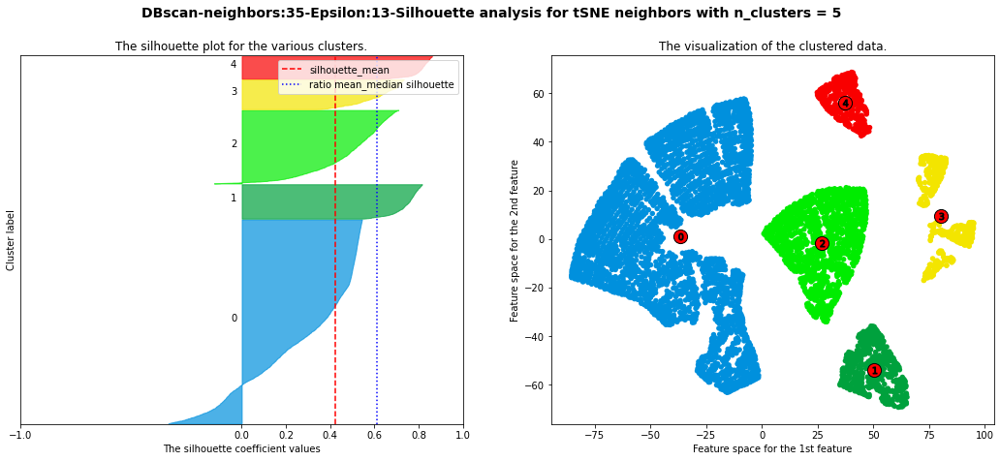

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


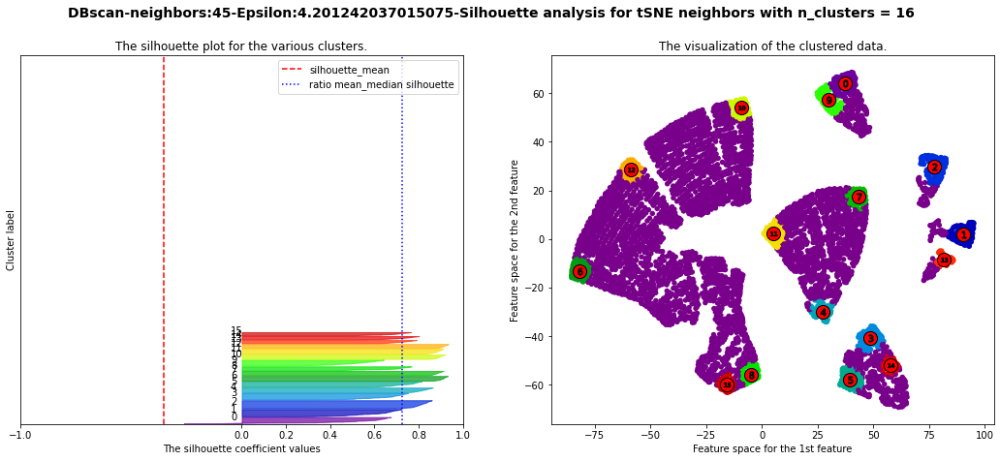

For n_clusters = 16 The average silhouette_score is : -0.35444796
For n_clusters = 16 The Davies-Bouldin score is : 1.0565475949177339
For n_clusters = 16 The ratio mean/median silhouette is : -0.49024679571020763


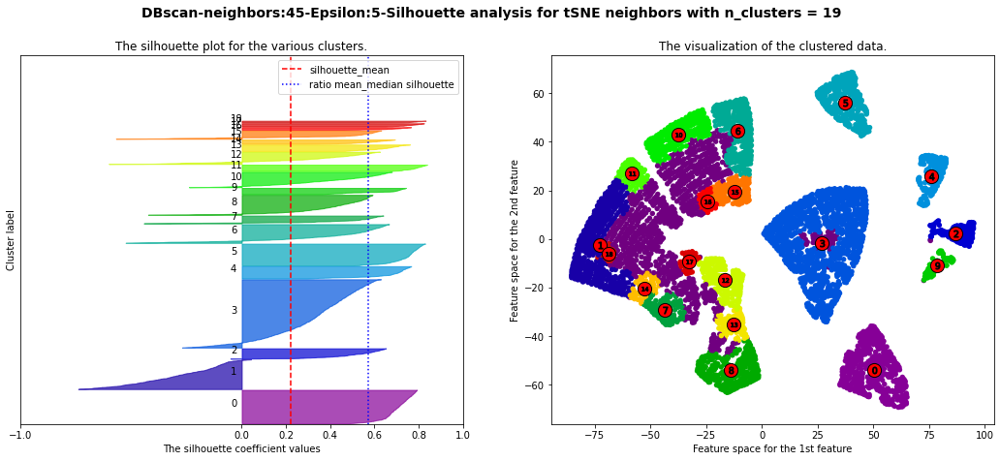

For n_clusters = 19 The average silhouette_score is : 0.219182
For n_clusters = 19 The Davies-Bouldin score is : 1.2227696694683354
For n_clusters = 19 The ratio mean/median silhouette is : 0.3845015


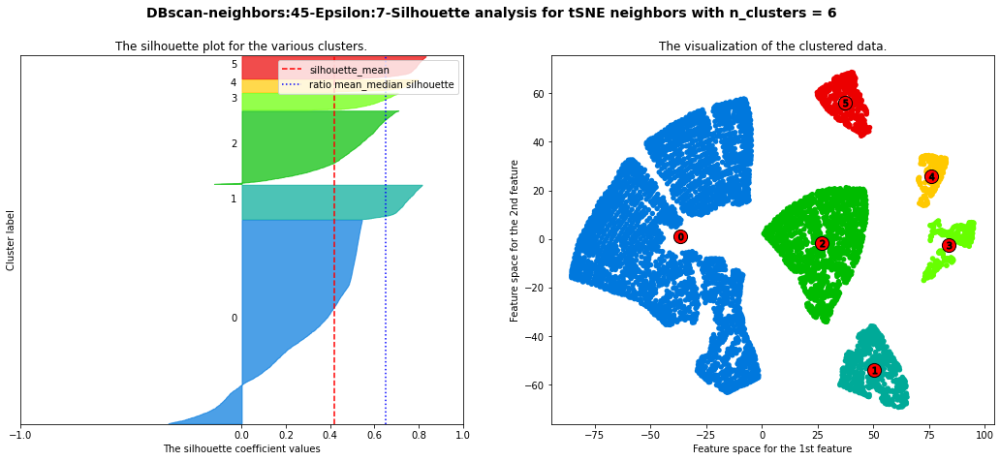

For n_clusters = 6 The average silhouette_score is : 0.42030108
For n_clusters = 6 The Davies-Bouldin score is : 0.6150815897509038
For n_clusters = 6 The ratio mean/median silhouette is : 0.6451068182150855


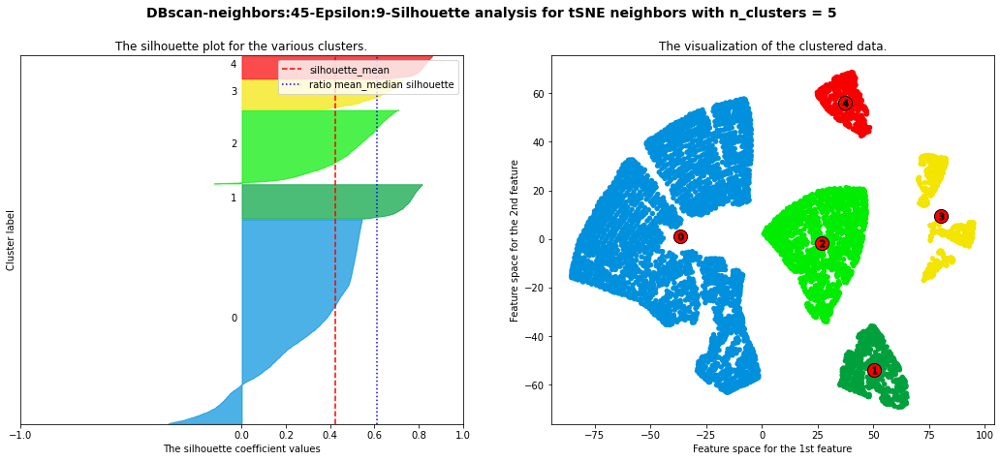

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


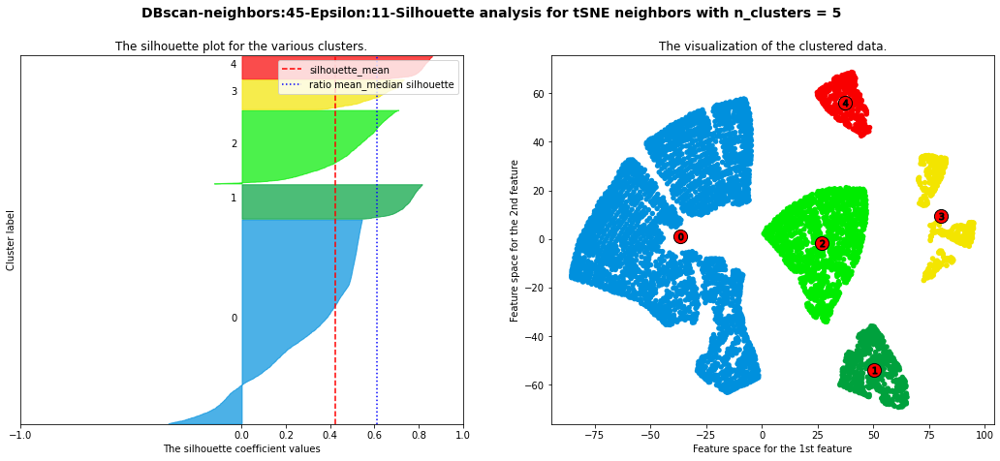

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


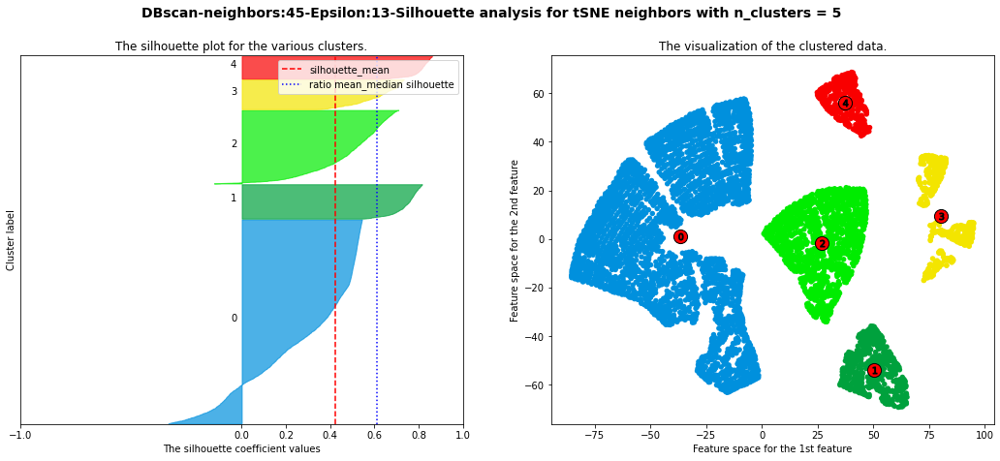

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


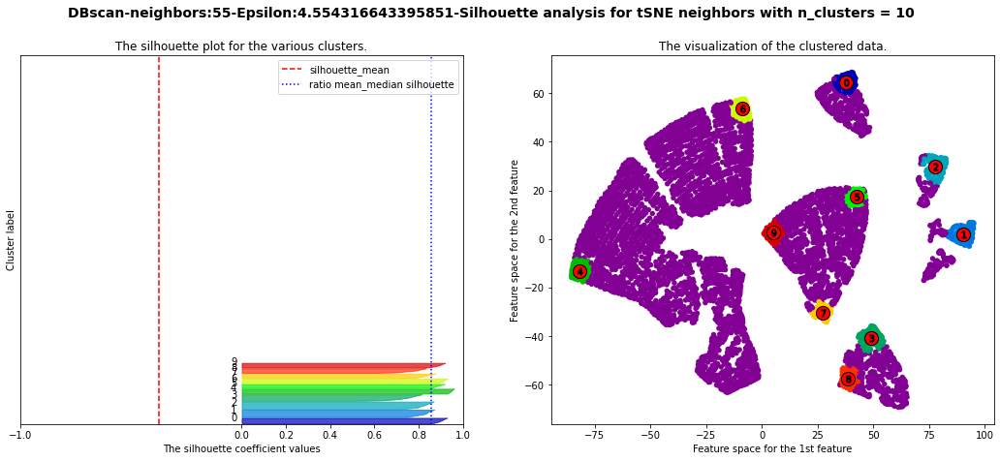

For n_clusters = 10 The average silhouette_score is : -0.37460926
For n_clusters = 10 The Davies-Bouldin score is : 1.3745914626583486
For n_clusters = 10 The ratio mean/median silhouette is : -0.4369095110971211


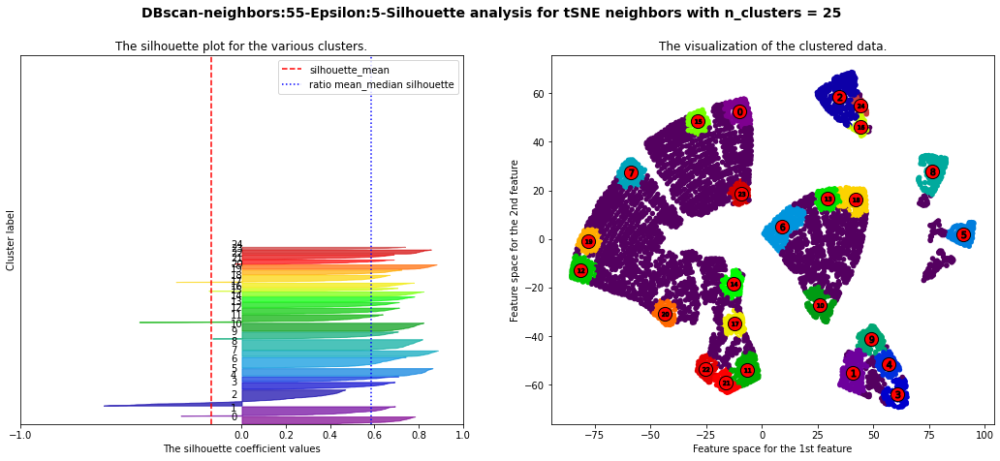

For n_clusters = 25 The average silhouette_score is : -0.13895947
For n_clusters = 25 The Davies-Bouldin score is : 1.0660500538432112
For n_clusters = 25 The ratio mean/median silhouette is : -0.23817475


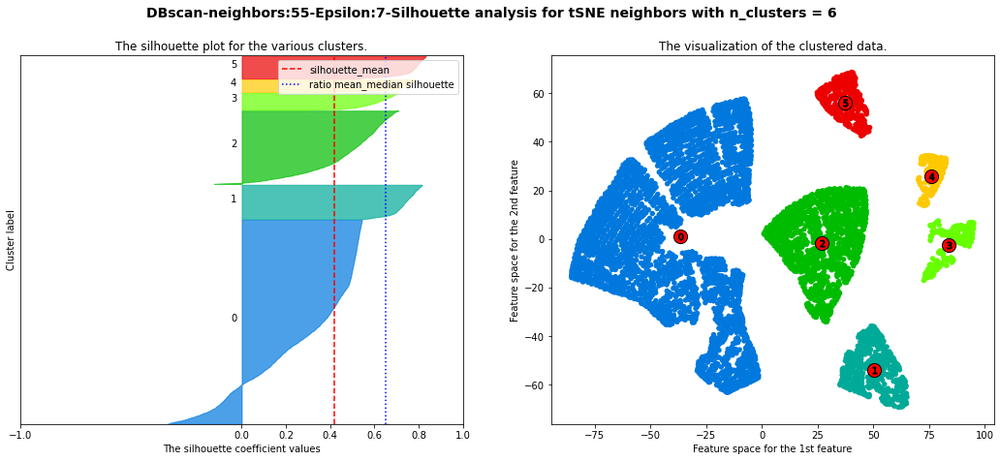

For n_clusters = 6 The average silhouette_score is : 0.42030108
For n_clusters = 6 The Davies-Bouldin score is : 0.6150815897509038
For n_clusters = 6 The ratio mean/median silhouette is : 0.6451068182150855


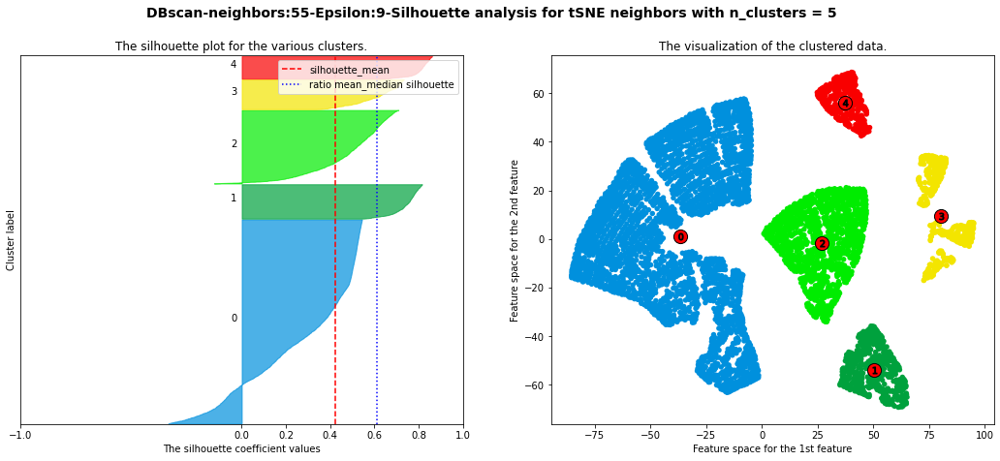

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


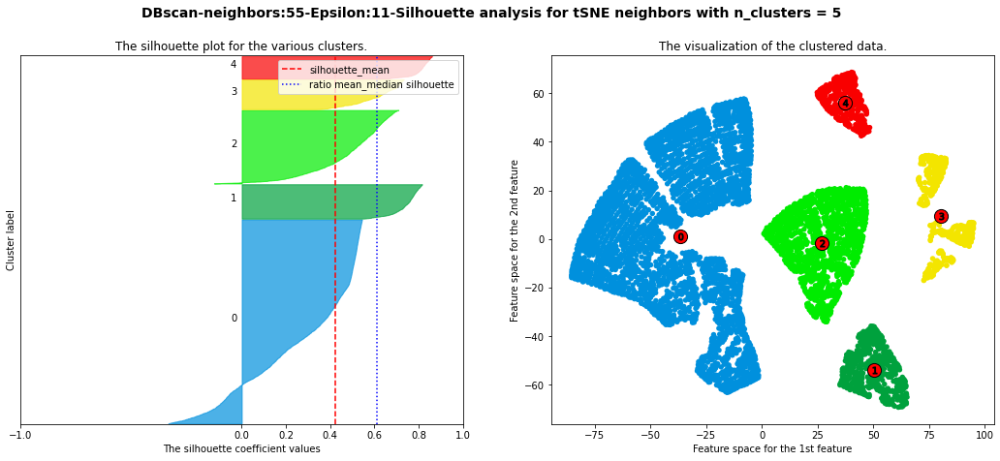

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


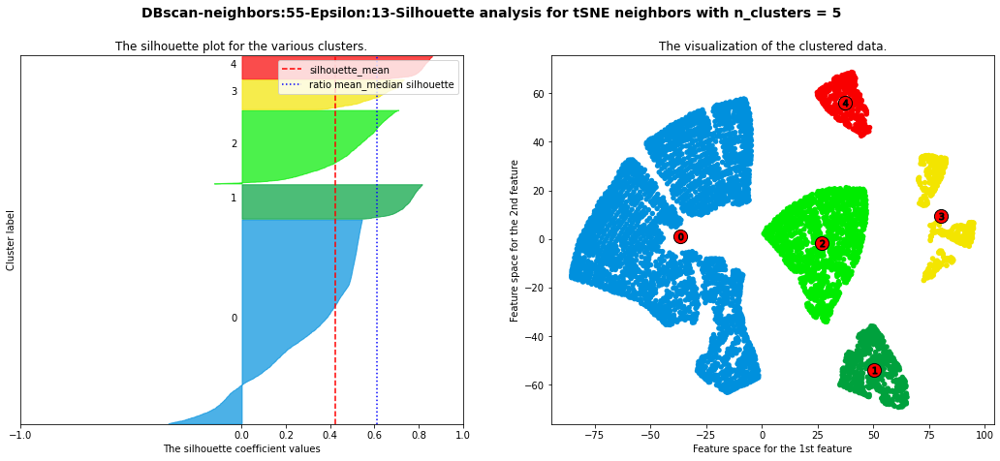

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


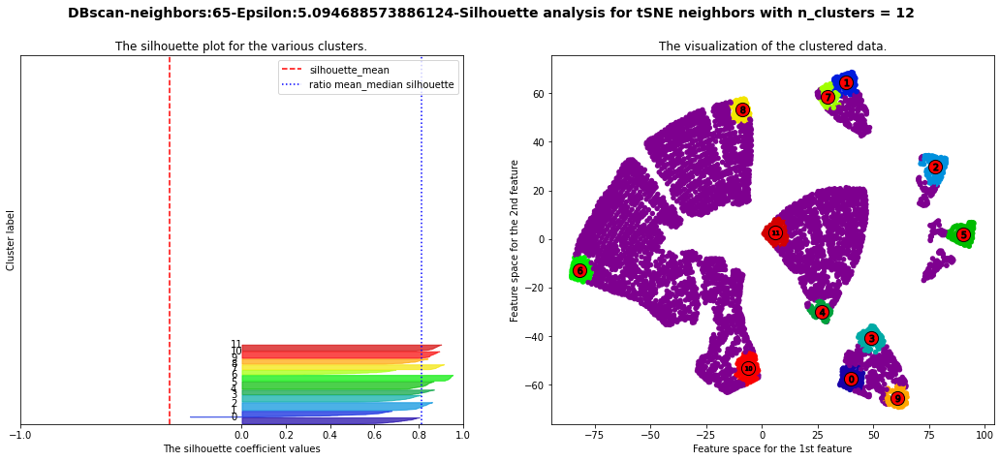

For n_clusters = 12 The average silhouette_score is : -0.3269645
For n_clusters = 12 The Davies-Bouldin score is : 1.15906265782287
For n_clusters = 12 The ratio mean/median silhouette is : -0.4019111307076424


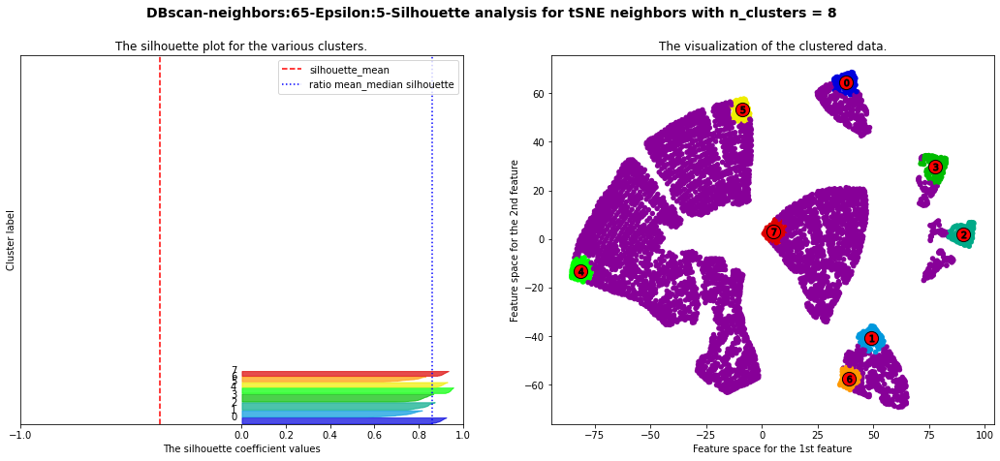

For n_clusters = 8 The average silhouette_score is : -0.36939254
For n_clusters = 8 The Davies-Bouldin score is : 1.4888626759683097
For n_clusters = 8 The ratio mean/median silhouette is : -0.4290620074084659


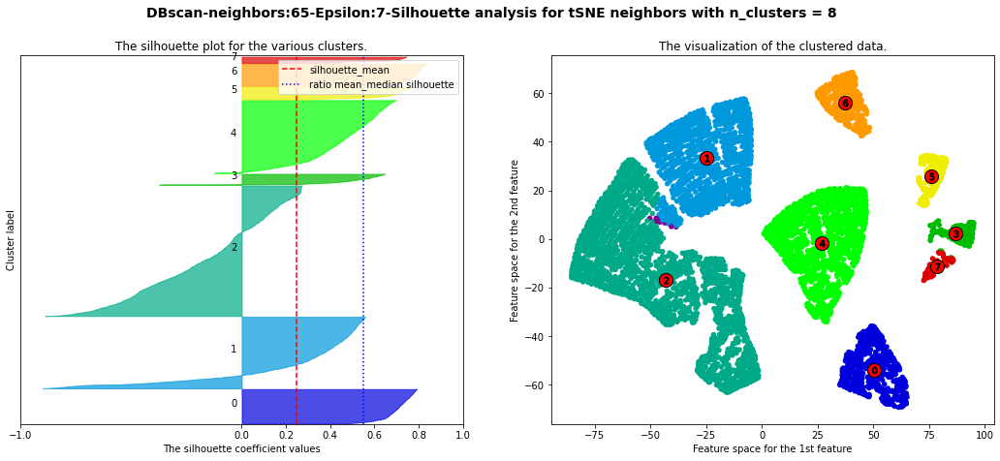

For n_clusters = 8 The average silhouette_score is : 0.24732164
For n_clusters = 8 The Davies-Bouldin score is : 0.7944014599077346
For n_clusters = 8 The ratio mean/median silhouette is : 0.44875866898470473


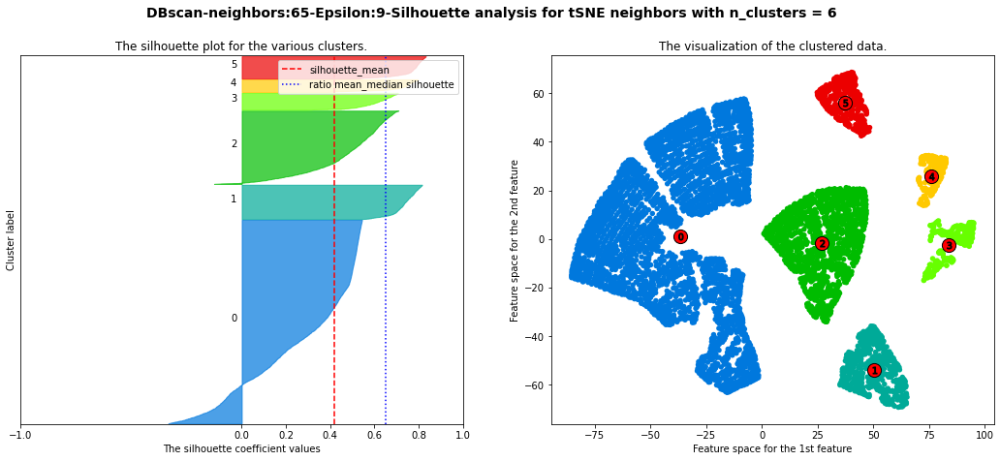

For n_clusters = 6 The average silhouette_score is : 0.42030108
For n_clusters = 6 The Davies-Bouldin score is : 0.6150815897509038
For n_clusters = 6 The ratio mean/median silhouette is : 0.6451068182150855


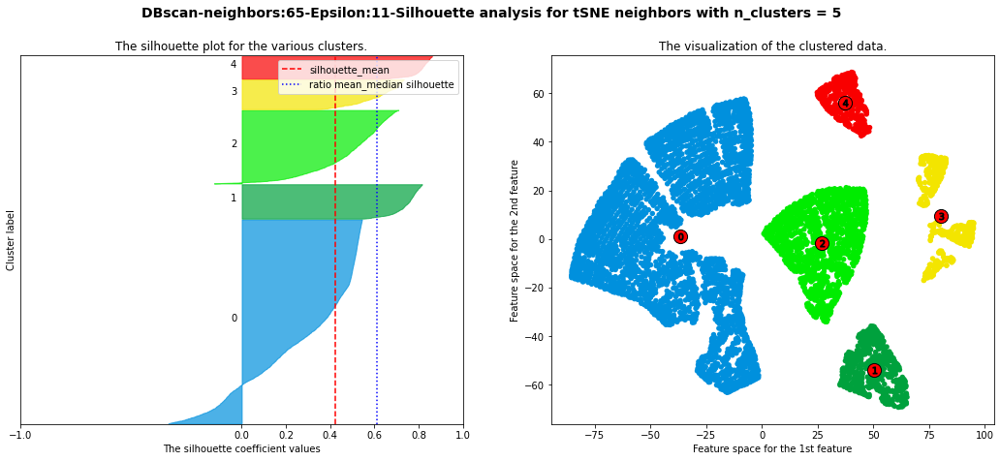

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


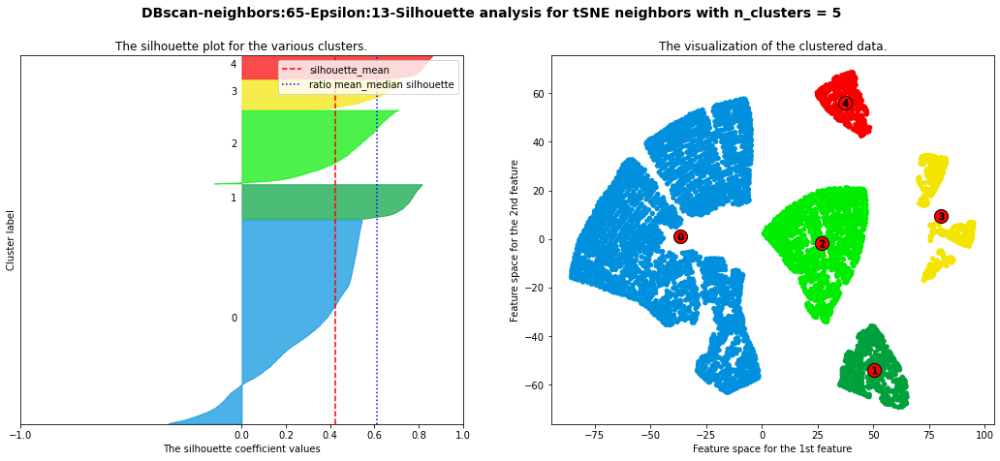

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


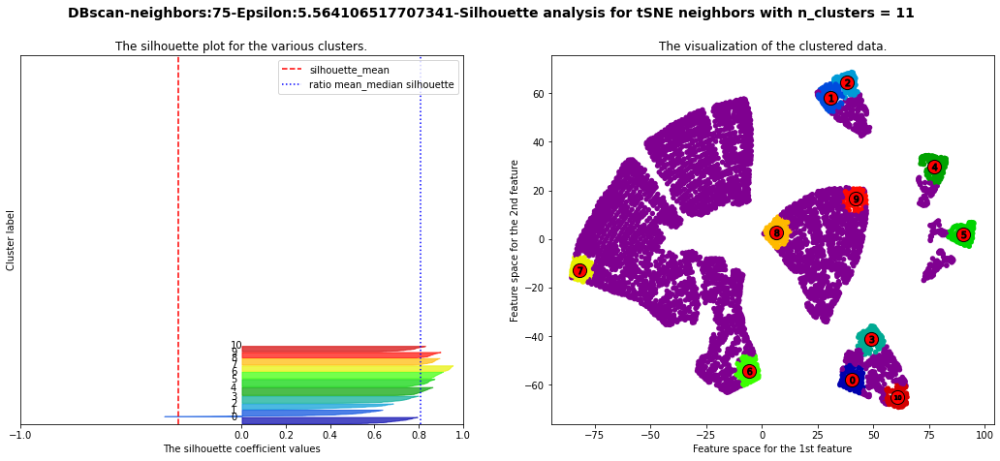

For n_clusters = 11 The average silhouette_score is : -0.28480223
For n_clusters = 11 The Davies-Bouldin score is : 1.1142844858762733
For n_clusters = 11 The ratio mean/median silhouette is : -0.35161126


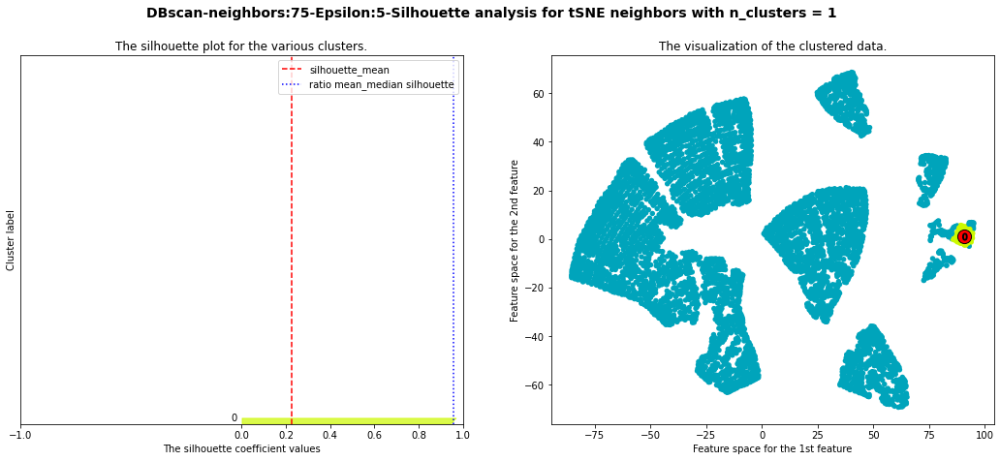

For n_clusters = 1 The average silhouette_score is : 0.22545627
For n_clusters = 1 The Davies-Bouldin score is : 0.5886306822277041
For n_clusters = 1 The ratio mean/median silhouette is : 0.23582882


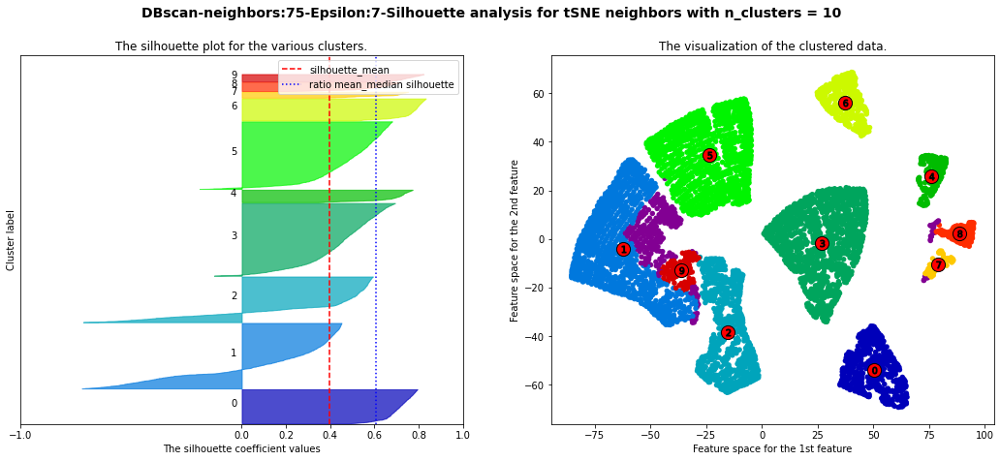

For n_clusters = 10 The average silhouette_score is : 0.3962692
For n_clusters = 10 The Davies-Bouldin score is : 1.1501190905859138
For n_clusters = 10 The ratio mean/median silhouette is : 0.6527757649451351


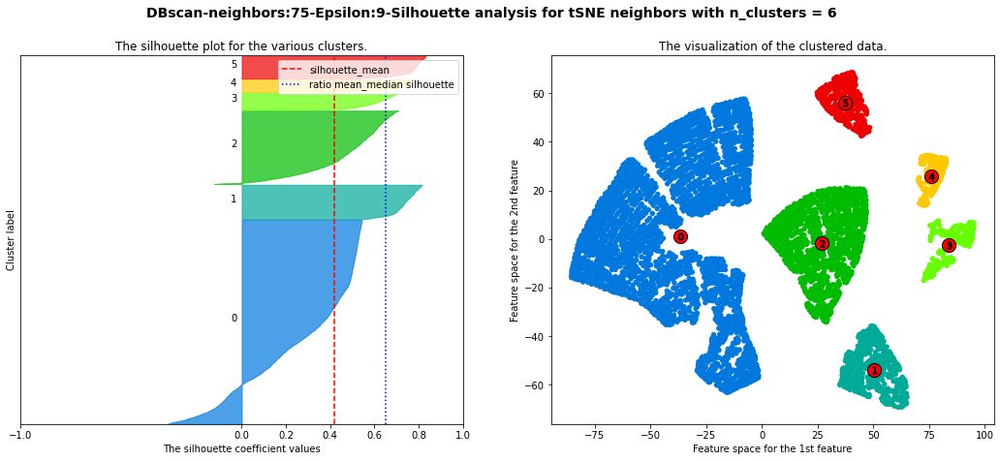

For n_clusters = 6 The average silhouette_score is : 0.42030108
For n_clusters = 6 The Davies-Bouldin score is : 0.6150815897509038
For n_clusters = 6 The ratio mean/median silhouette is : 0.6451068182150855


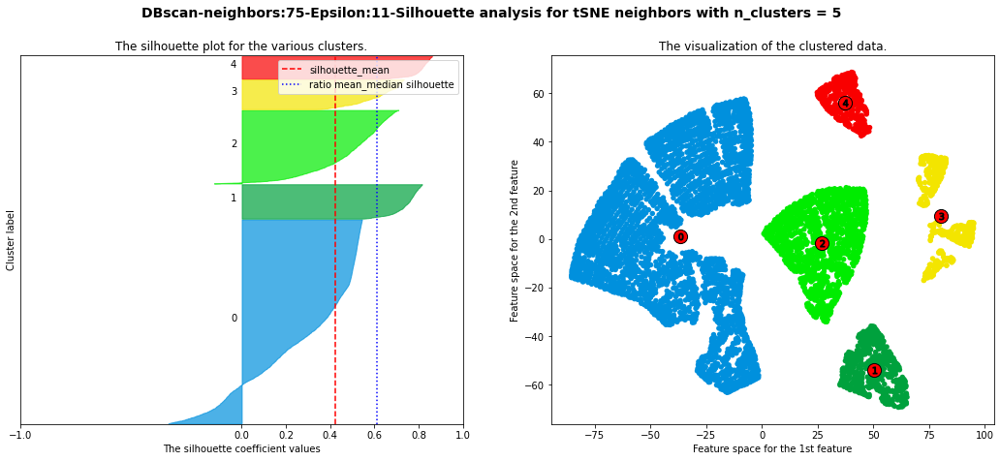

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


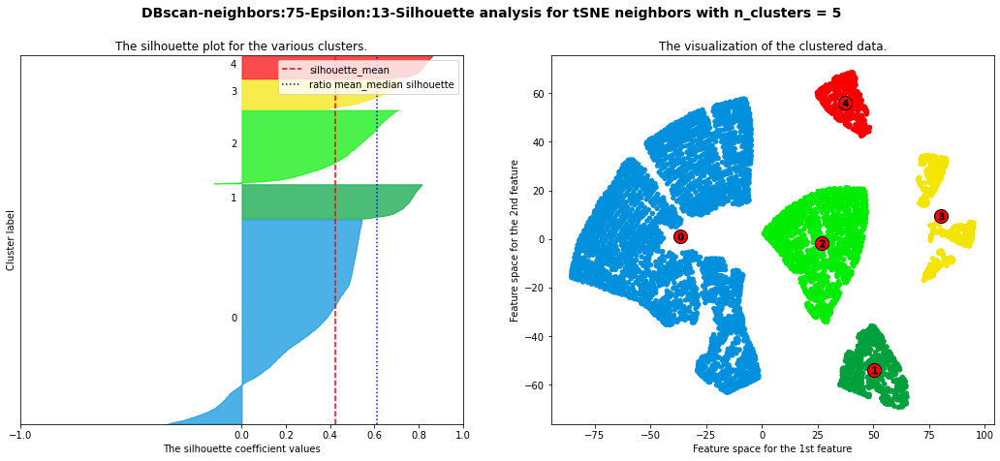

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


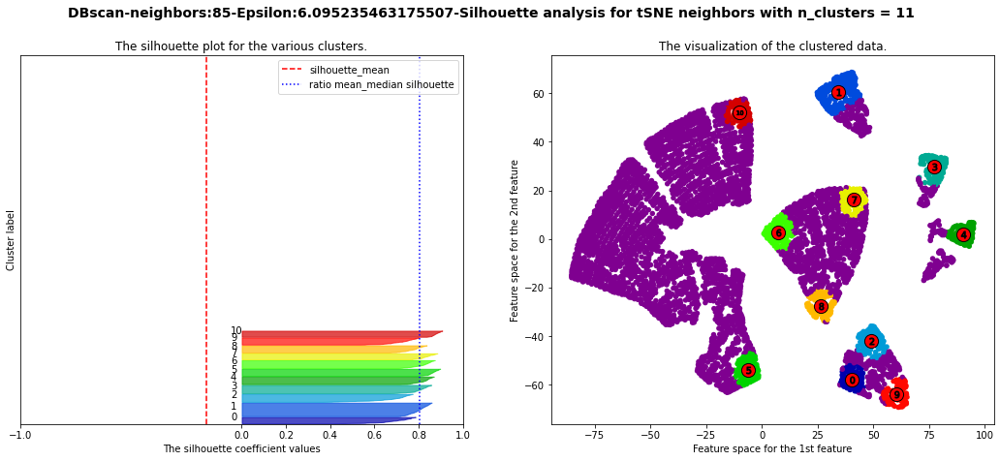

For n_clusters = 11 The average silhouette_score is : -0.15812807
For n_clusters = 11 The Davies-Bouldin score is : 1.0401863106478506
For n_clusters = 11 The ratio mean/median silhouette is : -0.19707876


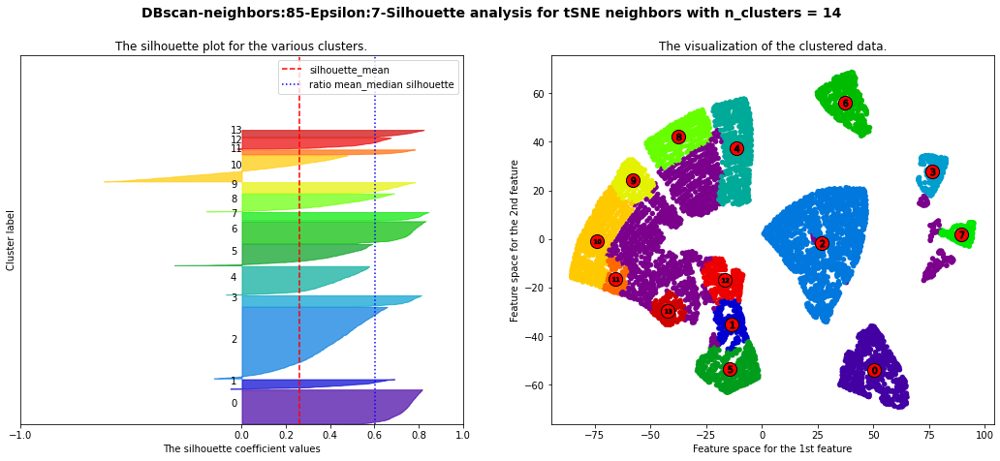

For n_clusters = 14 The average silhouette_score is : 0.2623393
For n_clusters = 14 The Davies-Bouldin score is : 1.0829765495117138
For n_clusters = 14 The ratio mean/median silhouette is : 0.4368926969627515


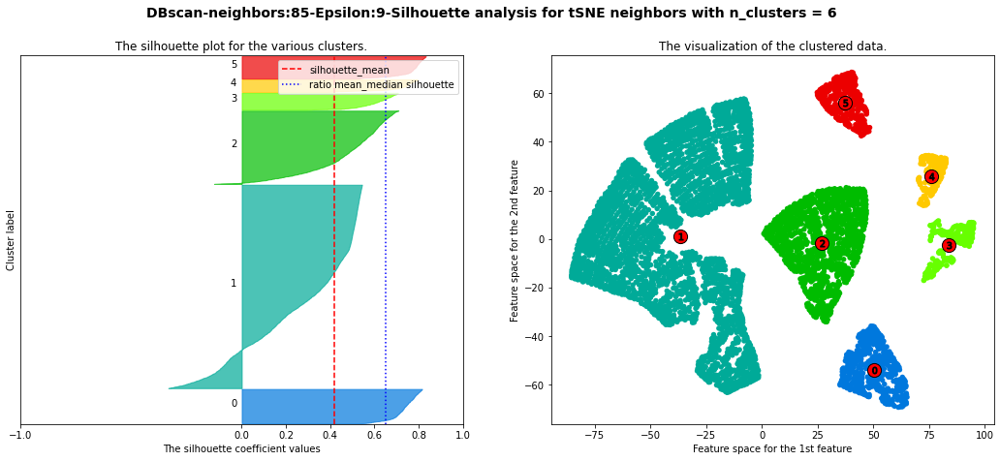

For n_clusters = 6 The average silhouette_score is : 0.42030108
For n_clusters = 6 The Davies-Bouldin score is : 0.6150815897509038
For n_clusters = 6 The ratio mean/median silhouette is : 0.6451068182150855


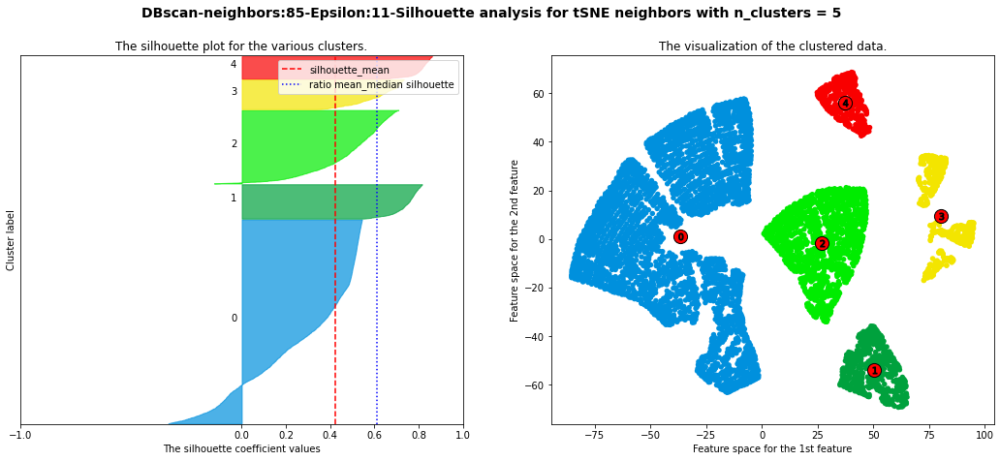

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


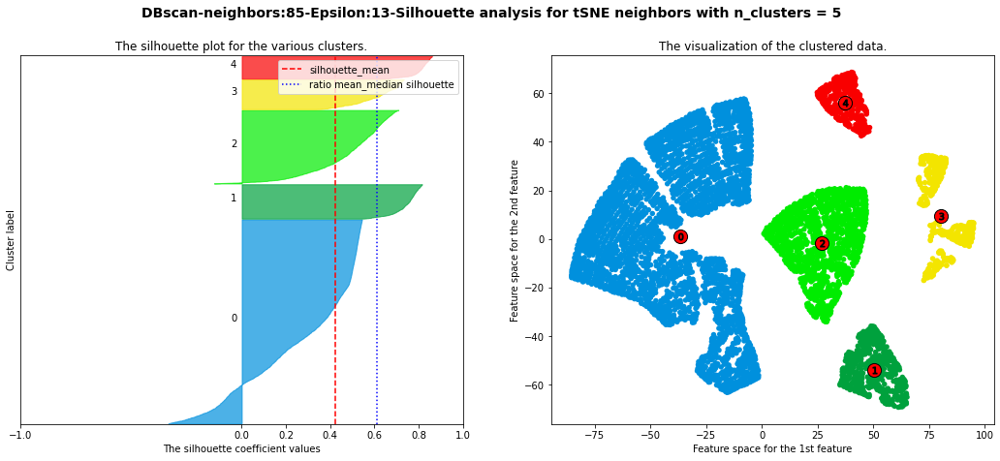

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


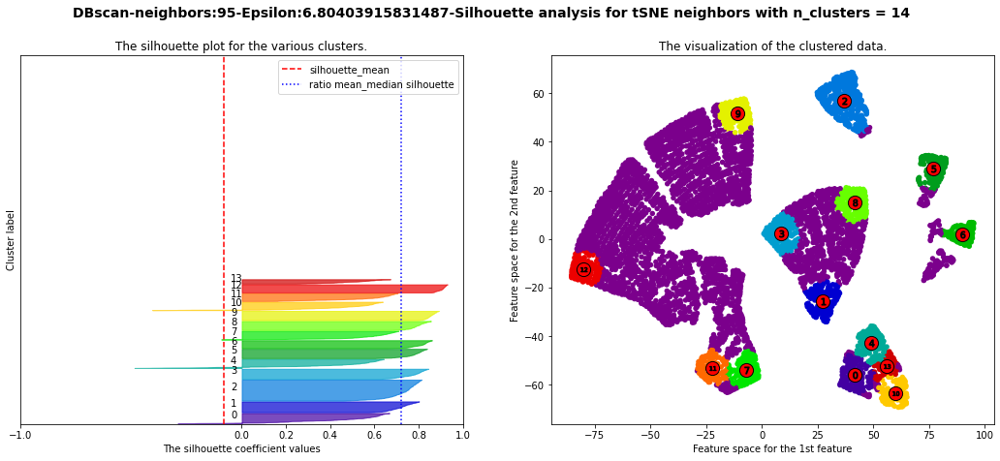

For n_clusters = 14 The average silhouette_score is : -0.08046198
For n_clusters = 14 The Davies-Bouldin score is : 0.8811536087288231
For n_clusters = 14 The ratio mean/median silhouette is : -0.11178724378239312


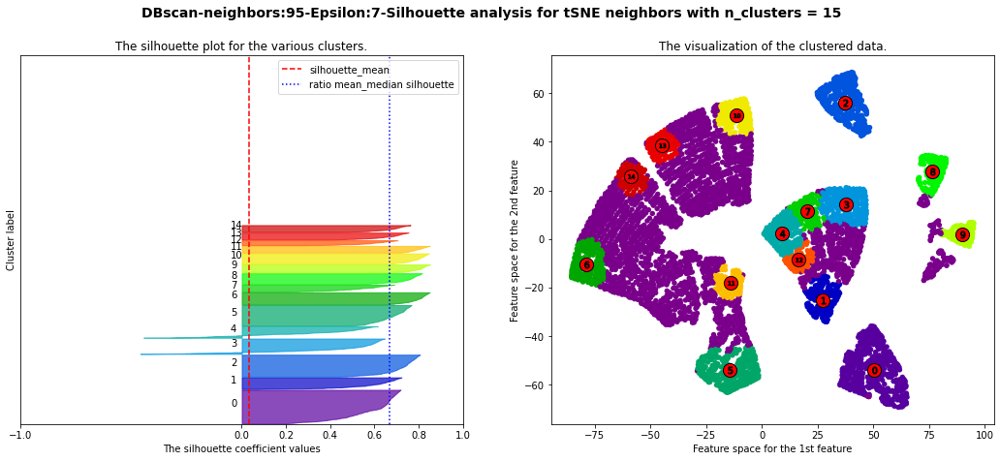

For n_clusters = 15 The average silhouette_score is : 0.0336867
For n_clusters = 15 The Davies-Bouldin score is : 1.0212207836205058
For n_clusters = 15 The ratio mean/median silhouette is : 0.05038566


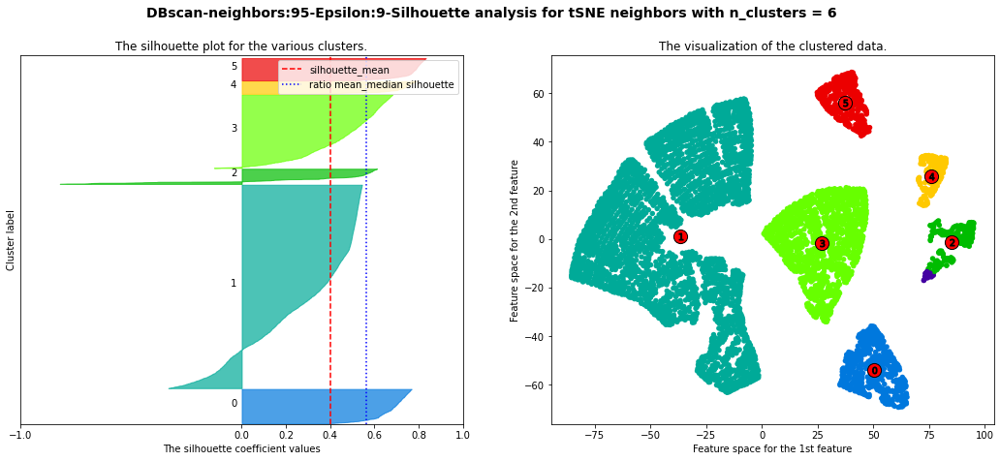

For n_clusters = 6 The average silhouette_score is : 0.39914045
For n_clusters = 6 The Davies-Bouldin score is : 0.6057667740551324
For n_clusters = 6 The ratio mean/median silhouette is : 0.7085196956581956


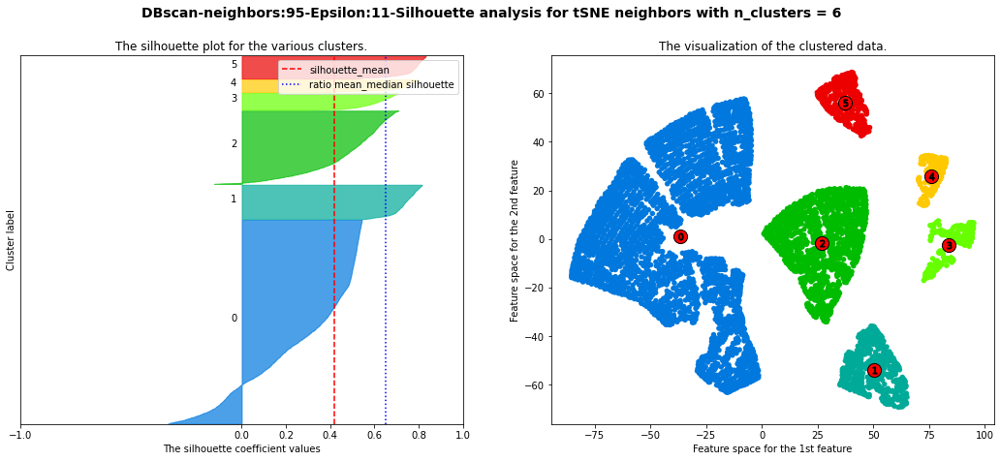

For n_clusters = 6 The average silhouette_score is : 0.42030108
For n_clusters = 6 The Davies-Bouldin score is : 0.6150815897509038
For n_clusters = 6 The ratio mean/median silhouette is : 0.6451068182150855


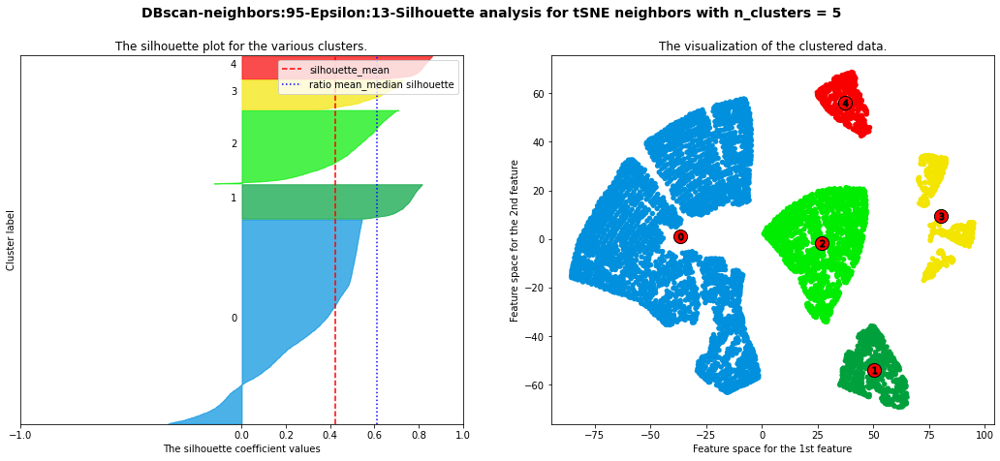

For n_clusters = 5 The average silhouette_score is : 0.42298946
For n_clusters = 5 The Davies-Bouldin score is : 0.648004459395731
For n_clusters = 5 The ratio mean/median silhouette is : 0.6942469


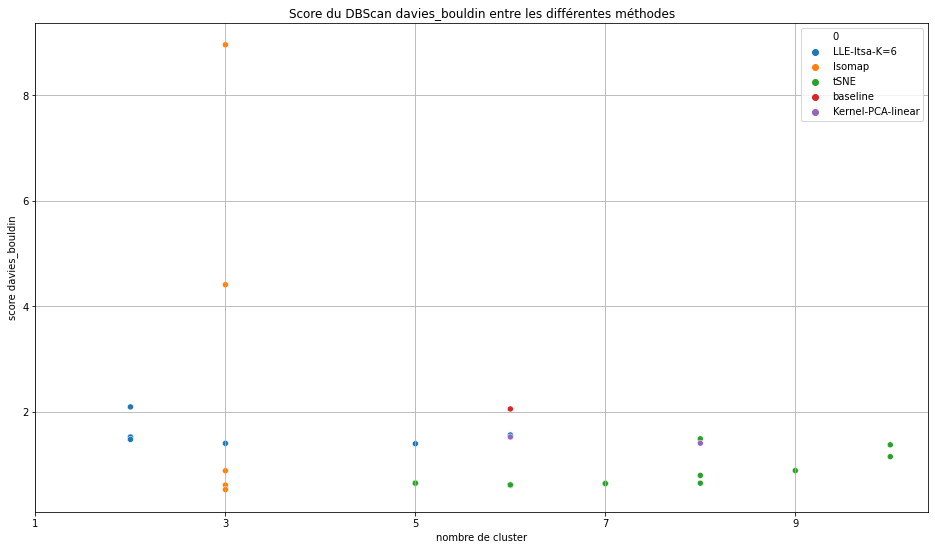

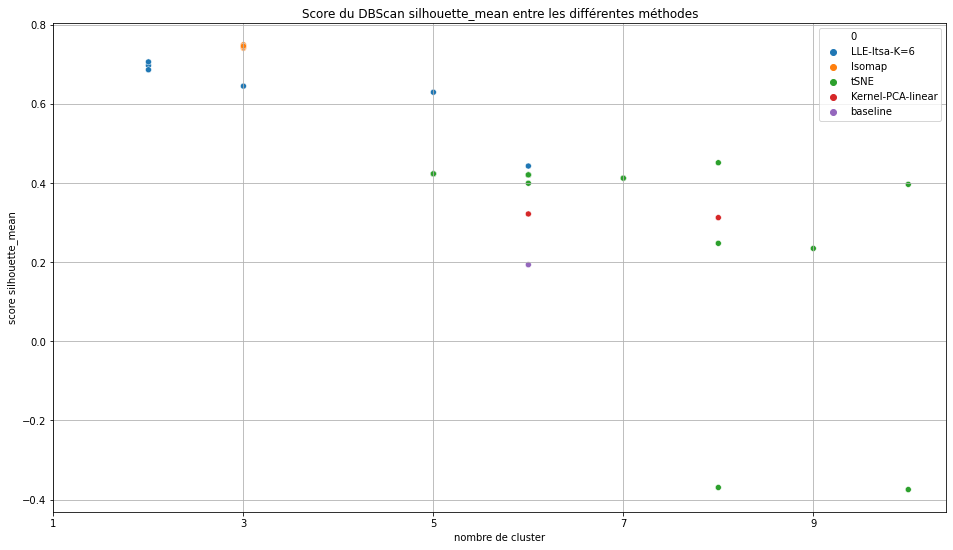

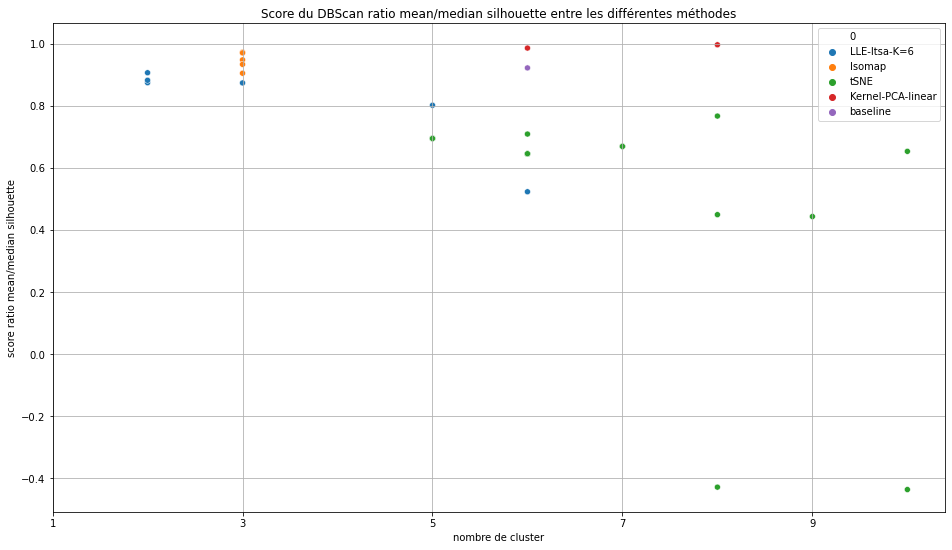

In [90]:
scores_finaux = []
labels = {}
scores_cluster = []

for param_grid in DBSCAN_eps_samples:
    dbs = DBSCAN(eps=param_grid[2], min_samples=param_grid[1]).fit(
        projections[param_grid[0]])
    scores_cluster, labels[param_grid[0]+"-min_sample:"+str(
        param_grid[1])] = DBSCAN_plot_silhouette_score(param_grid, projections[param_grid[0]], dbs)

    if len(scores_cluster) != 0:
        if len(scores_finaux) == 0:
            scores_finaux = scores_cluster
        else:
            scores_finaux = np.concatenate([scores_finaux, scores_cluster])


scores_df = pd.DataFrame(scores_finaux)
scores_df[3] = scores_df[3].astype("float")
scores_df[1] = scores_df[1].astype("int")
scores_df = scores_df[scores_df[1] > 1]
scores_df = scores_df.sort_values(by=1)
scores_df = scores_df[scores_df[1] <= 10]
max_nb_cluster = max(scores_df[1])

for score in score_type_list:
    scores_item_df = scores_df[scores_df[2] == score]
    ax = plt.figure(figsize=(16, 9)).add_subplot()
    sns.scatterplot(x=1, y=3, hue=0, data=scores_item_df)
    ax.set_xticks(np.arange(1, max_nb_cluster, 2))
    plt.xlabel("nombre de cluster")
    plt.ylabel("score "+str(score))
    plt.title("Score du DBScan "+str(score)+" entre les différentes méthodes")
    plt.legend(loc="upper right")
    ax.grid(True)
    plt.show()

La projection Isomap avec 3 clusters offre le meilleur score de silhouette et dedavies_bouldin

Je graphe la heatmap pour un cluster de 3. 

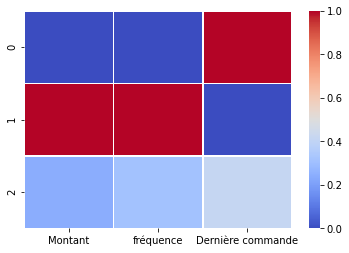

In [56]:
projection = 'Isomap'
clusters = 3
isomap_df = scores_df[(scores_df[0] == projection) & (
    scores_df[1] == clusters) & (scores_df[2] == 'silhouette_mean')]
isomap_df = isomap_df.sort_values(by=3, ascending=False)
isomap_df = isomap_df.iloc[0]
isomap_df = isomap_df[5]
plot_custumer_cluster(X_scaled_reduced, labels, isomap_df)

Je réalise maintenant un clustering hierarchique avec pour critère d'agrégation, celui de Ward.

Clustering hiéarchique  de la baseline


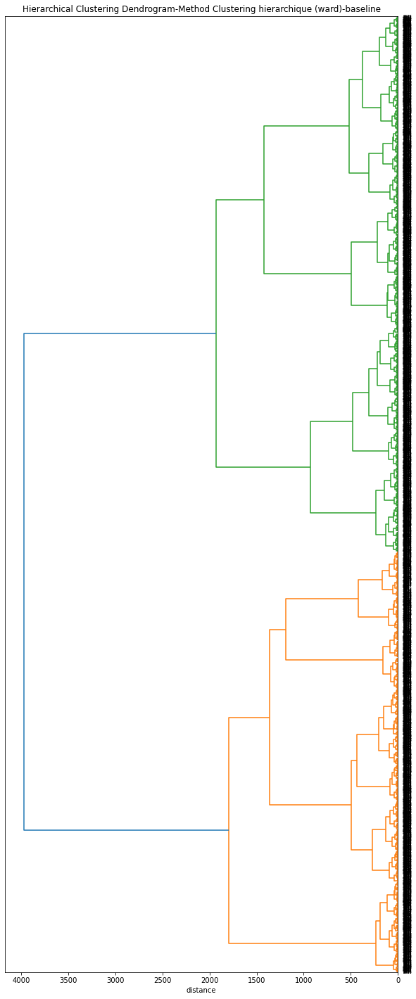

Clustering hiéarchique selon la projection Kernel-PCA-linear


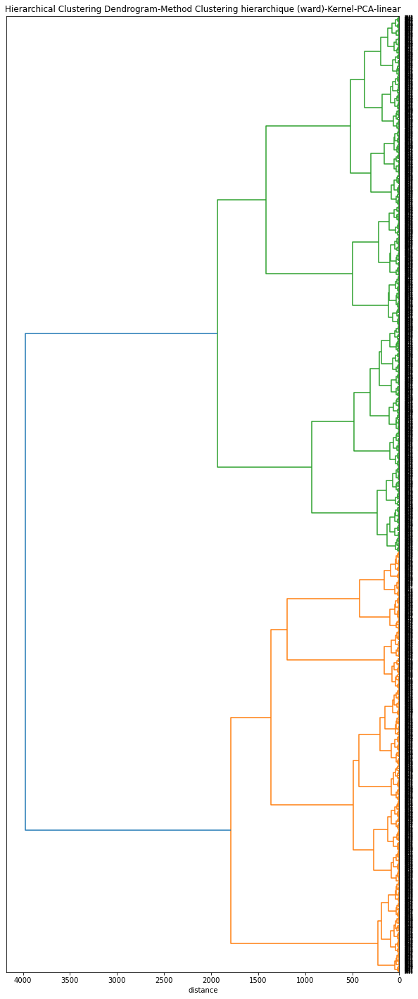

Clustering hiéarchique selon la projection Isomap


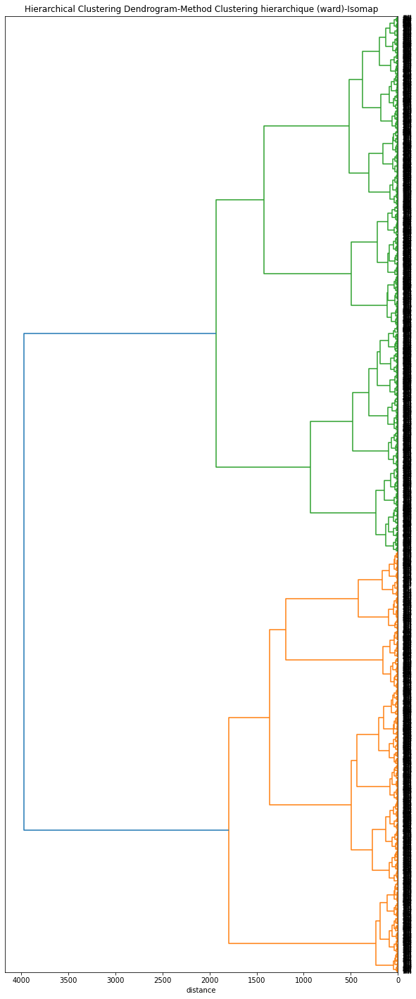

Clustering hiéarchique selon la projection LLE-ltsa-K=6


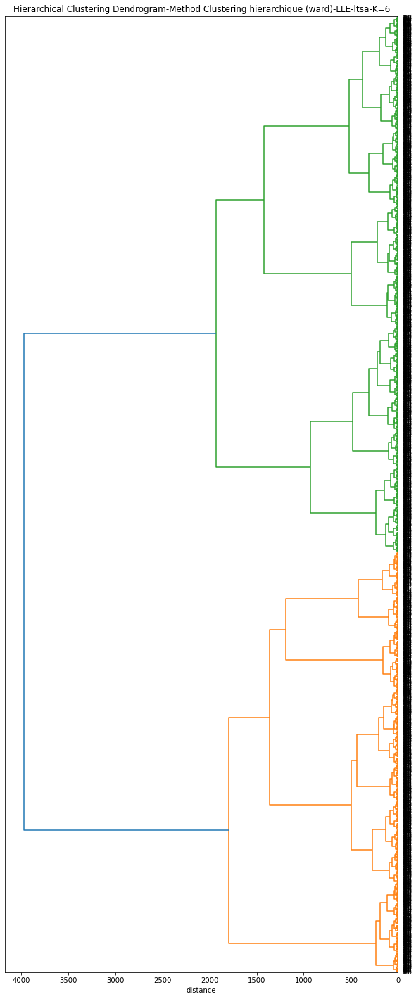

Clustering hiéarchique selon la projection tSNE


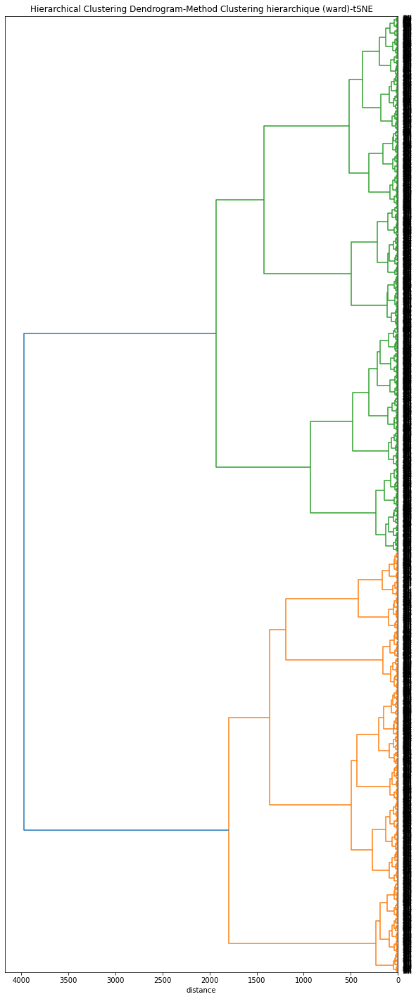

In [91]:
# initialisation du nombre de clusters à tester
scores = []
Z_list = {}

for proj_name in methode_list:

    if "baseline" in proj_name:
        print("Clustering hiéarchique  de la baseline")
    else:
        print("Clustering hiéarchique selon la projection "+str(proj_name))

    # sélection de la projection des données
    X = projections[name]

    # Clustering hiérarchique
    Z = linkage(X, 'ward')
    Z_list[proj_name] = Z

    # Affichage du dendrogramme
    plot_dendrogram(Z, title='Clustering hierarchique (ward)-'+proj_name)

J'identifie 4 clusters pour chacune des projection :

In [92]:
projec_clusters = []
nombre_clusters = 4
for proj_name in methode_list:
    cluster = fcluster(Z_list[proj_name],
                       nombre_clusters, criterion='maxclust')
    projec_clusters.append([proj_name, nombre_clusters, cluster])

Clustering hiéarchique selon la projection baseline


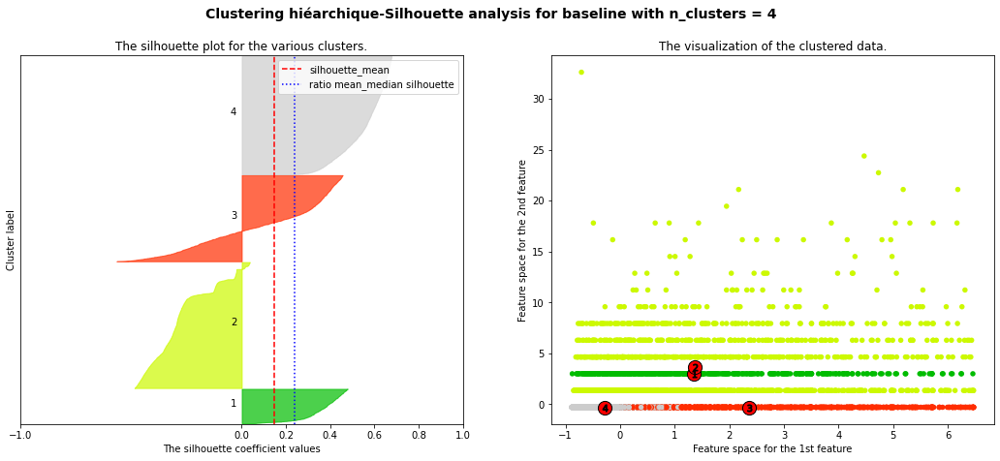

For n_clusters = [ 2  3  4  5  6  7  8  9 10] The average silhouette_score is : 0.14796323400017586
For n_clusters = [ 2  3  4  5  6  7  8  9 10] The Davies-Bouldin score is : 4.7527634077490335
For n_clusters = [ 2  3  4  5  6  7  8  9 10] The ratio mean/median silhouette is : 0.6156458268799464
Clustering hiéarchique selon la projection Kernel-PCA-linear


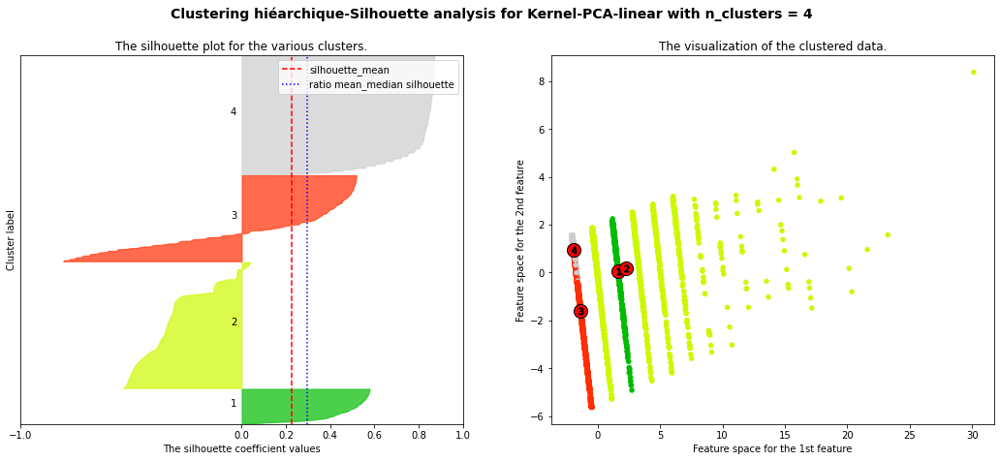

For n_clusters = [ 2  3  4  5  6  7  8  9 10] The average silhouette_score is : 0.2254226816482952
For n_clusters = [ 2  3  4  5  6  7  8  9 10] The Davies-Bouldin score is : 4.1808538084480285
For n_clusters = [ 2  3  4  5  6  7  8  9 10] The ratio mean/median silhouette is : 0.7573939029806832
Clustering hiéarchique selon la projection Isomap


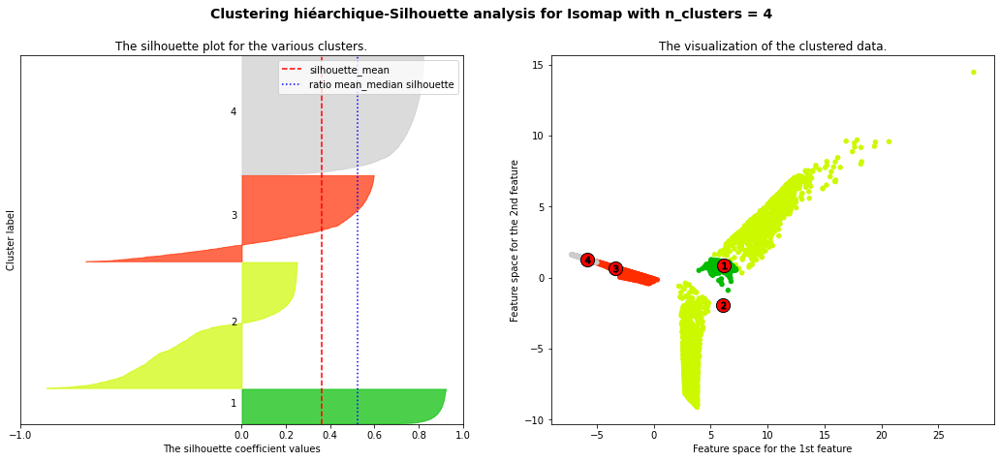

For n_clusters = [ 2  3  4  5  6  7  8  9 10] The average silhouette_score is : 0.36119346105047034
For n_clusters = [ 2  3  4  5  6  7  8  9 10] The Davies-Bouldin score is : 1.5896684911298389
For n_clusters = [ 2  3  4  5  6  7  8  9 10] The ratio mean/median silhouette is : 0.6895178474018272
Clustering hiéarchique selon la projection LLE-ltsa-K=6


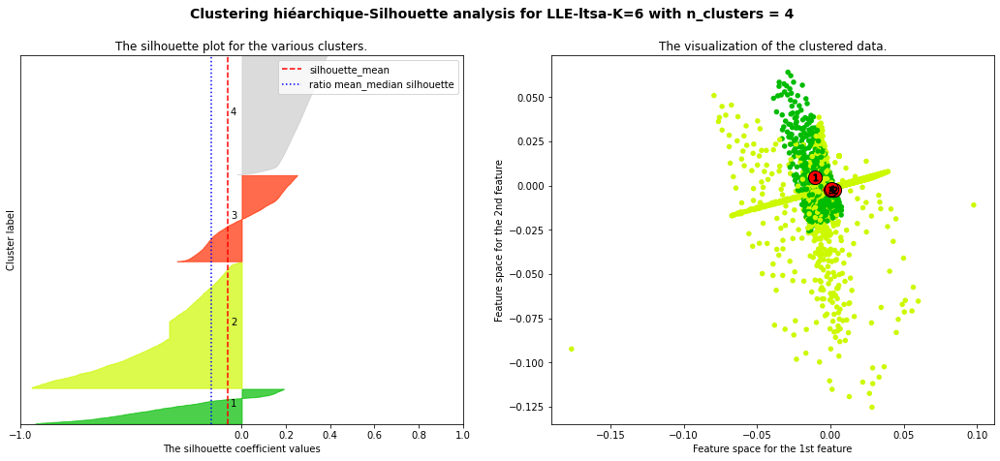

For n_clusters = [ 2  3  4  5  6  7  8  9 10] The average silhouette_score is : -0.06354577662981041
For n_clusters = [ 2  3  4  5  6  7  8  9 10] The Davies-Bouldin score is : 8.266613575439532
For n_clusters = [ 2  3  4  5  6  7  8  9 10] The ratio mean/median silhouette is : 0.46737867717314624
Clustering hiéarchique selon la projection tSNE


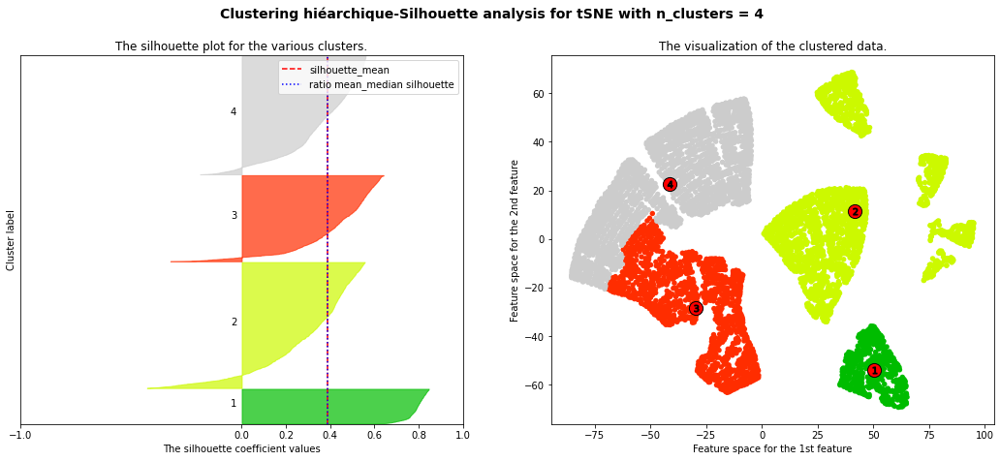

For n_clusters = [ 2  3  4  5  6  7  8  9 10] The average silhouette_score is : 0.3892832
For n_clusters = [ 2  3  4  5  6  7  8  9 10] The Davies-Bouldin score is : 0.8324153673017759
For n_clusters = [ 2  3  4  5  6  7  8  9 10] The ratio mean/median silhouette is : 1.0025127716569795


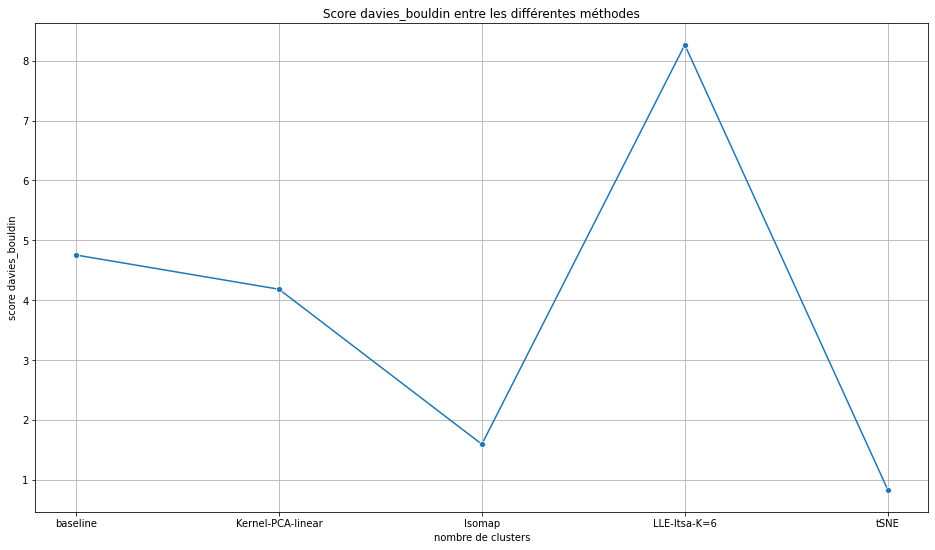

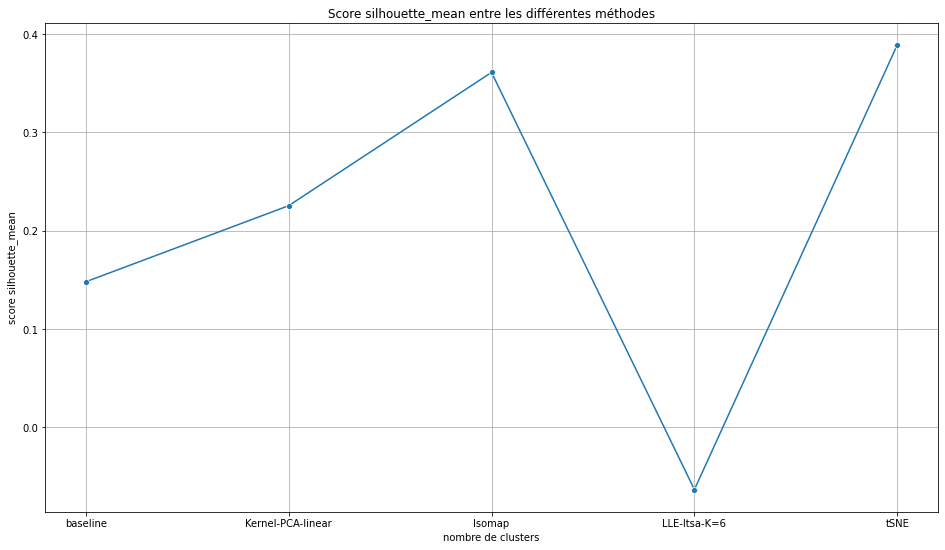

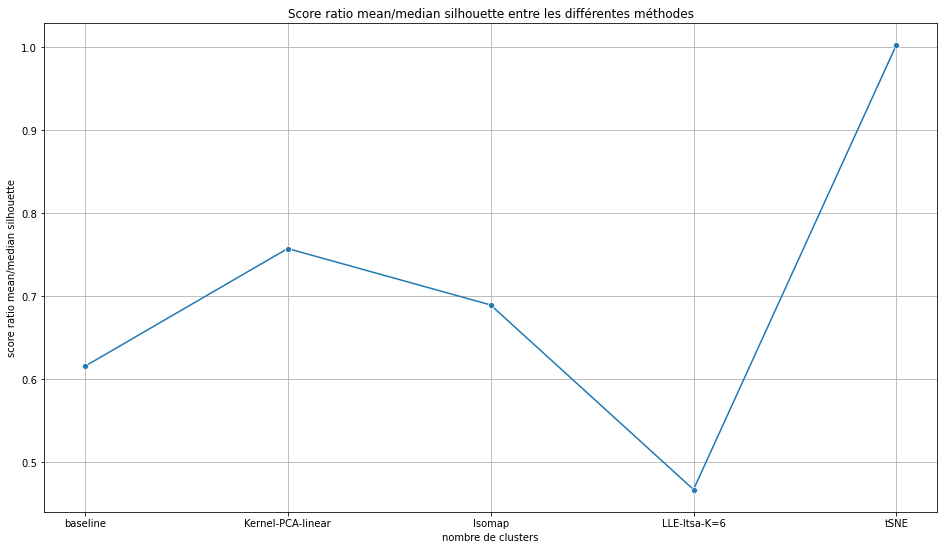

In [93]:
scores = []
for proj_cluster in projec_clusters:
    if "baseline" in proj_name:
        print("Clustering hiéarchique de la baseline")
    else:
        print("Clustering hiéarchique selon la projection " +
              str(proj_cluster[0]))

    scores_cluster = Hierarchique_plot_silhouette_score(
        proj_cluster[0], projections[proj_cluster[0]], proj_cluster[2])

    if len(scores) == 0:
        scores = scores_cluster
    else:
        scores = np.concatenate([scores, scores_cluster])


score_type_list = ['davies_bouldin',
                   'silhouette_mean', 'ratio mean/median silhouette']

scores_df = pd.DataFrame(scores)
scores_df[3] = scores_df[3].astype("float")
scores_df[1] = scores_df[1].astype("int")
scores_df = scores_df[scores_df[1] != 1]
scores_df = scores_df.sort_values(by=[1])

for score in score_type_list:
    scores_item_df = scores_df[scores_df[2] == score]
    plt.figure(figsize=(16, 9))
    #sns.lineplot(x = 1, y = 3, data = scores_item_df, hue=0, marker = "o")
    sns.lineplot(x=0, y=3, data=scores_item_df, marker="o")
    plt.xlabel("nombre de clusters")
    plt.ylabel("score "+str(score))
    plt.title("Score "+str(score)+" entre les différentes méthodes")
    plt.grid(True)
    plt.show()

Je choisi le cluster de 3 avec la projection stSNE:

In [94]:
projection = 'tSNE'

Je sélectionne le cluster trouvé pour cette projection et nombre de clusters

In [95]:
clusters_df = pd.DataFrame(projec_clusters)
clusters_df = clusters_df[(clusters_df[1] == nombre_clusters) & (
    clusters_df[0] == projection)]

In [96]:
cluster_final = {}
cluster_final[clusters_df.iloc[0][0]] = clusters_df.iloc[0][2]
cluster_final

{'tSNE': array([4, 4, 1, ..., 4, 2, 4], dtype=int32)}

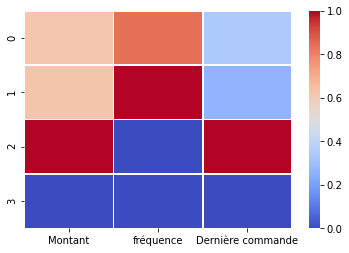

In [97]:
plot_custumer_cluster(X_scaled_reduced, cluster_final, projection)